### Exercise Objective

With the advancement of NLP in recent years, OCBC has growing aspirations of utilising news text creatively to 
create, improve and/or augment present and future banking services.

#### Task: Group the news in the provided news dataset to various clusters. 

Sample steps:
1. Get representation/embedding of each news article
2. Visualize the representation
3. Evaluation of the representation
4. Provide explanations to illustrate your assumptions, approach and thought process.

In [1]:
# All imports

import pandas as pd
import seaborn as sns
import nltk
import sklearn
import pyLDAvis.gensim_models
import pkg_resources
pkg_resources.require("gensim==3.8.3")
import gensim
import matplotlib.pyplot as plt 
import re

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from collections import  Counter
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import CoherenceModel
from pprint import pprint

/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/gensim/matutils.py:24: DeprecationWarning: Please use `triu` from the `scipy.linalg` namespace, the `scipy.linalg.special_matrices` namespace is deprecated.
  from scipy.linalg.special_matrices import triu
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/niharikashrivastav

## 1. Data Exploration

In [2]:
news_data = pd.read_csv('news_data.csv')

In [3]:
news_data.head(10)

,altid,title,content
0,sa1a70ab8ef5,Davenport hits out at Wimbledon,World number one Lindsay Davenport has critic...
1,ta497aea0e36,Camera phones are 'must-haves',Four times more mobiles with cameras in them ...
2,ta0f0fa26a93,US top of supercomputing charts,The US has pushed Japan off the top of the su...
3,ba23aaa4f4bb,Trial begins of Spain's top banker,"The trial of Emilio Botin, the chairman of Sp..."
4,baa126aeb946,Safety alert as GM recalls cars,The world's biggest carmaker General Motors (...
5,saa0c6292a37,Angry Williams rejects criticism,Serena Williams has angrily rejected claims t...
6,pa0f562ea8a2,E-University 'disgraceful waste',A failed government scheme to offer UK univer...
7,ea6b1e0f27d6,India to deport Bollywood actress,India has ordered the deportation of Iranian-...
8,ta74d0c14217,Web radio takes Spanish rap global,Spin the radio dial in the US and you are lik...
9,babc125887b7,Ailing EuroDisney vows turnaround,"EuroDisney, the European home of Mickey Mouse..."


In [4]:
news_data.shape

(60, 3)

In [5]:
stop_words = set(stopwords.words('english'))

def plot_most_commom_words(text, plot_size):
    text_list = text.str.split()
    text_list = text_list.values.tolist()
    corpus = [word for row in text_list for word in row]
    counter = Counter(corpus)
    most = counter.most_common()
    
    words, counts = [], []
    for word, count in most:
        if (word.lower() not in stop_words):
            words.append(word)
            counts.append(count)
    
    sns.set(rc = {'figure.figsize': plot_size})
    sns.barplot(x = counts, y = words)

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


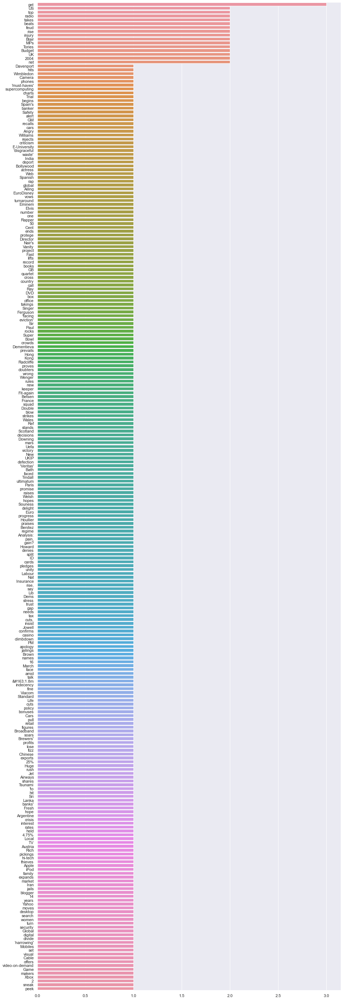

In [7]:
plot_most_commom_words(news_data['title'], (15,50))

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


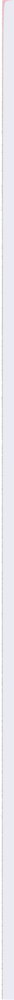

In [8]:
plot_most_commom_words(news_data['content'], (10, 900))

In [9]:
def plot_top_ngrams(text, n=2):
    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    def _get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq

    top_n_bigrams=_get_top_ngram(corpus,n)[:50]
    x,y=map(list,zip(*top_n_bigrams))
    sns.set(rc = {'figure.figsize':(15,8)})
    sns.barplot(x=y,y=x)

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


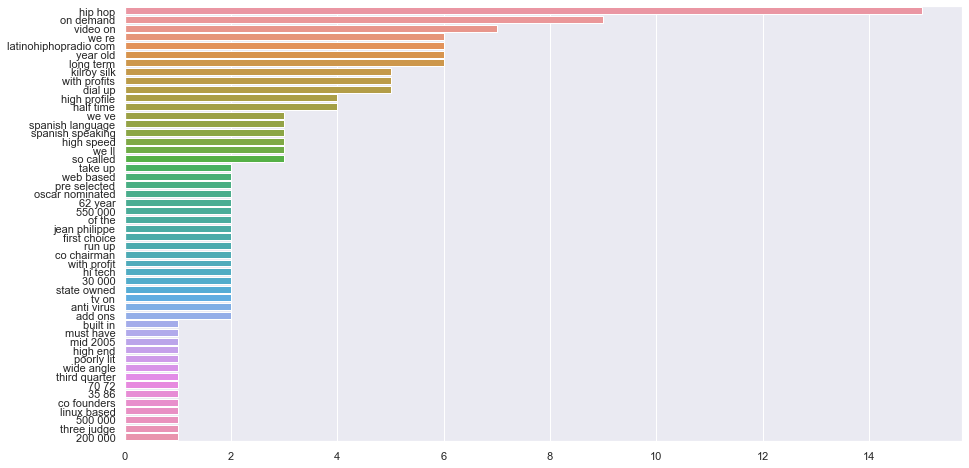

In [10]:
## Bigrams
plot_top_ngrams(news_data['content'], 2)

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


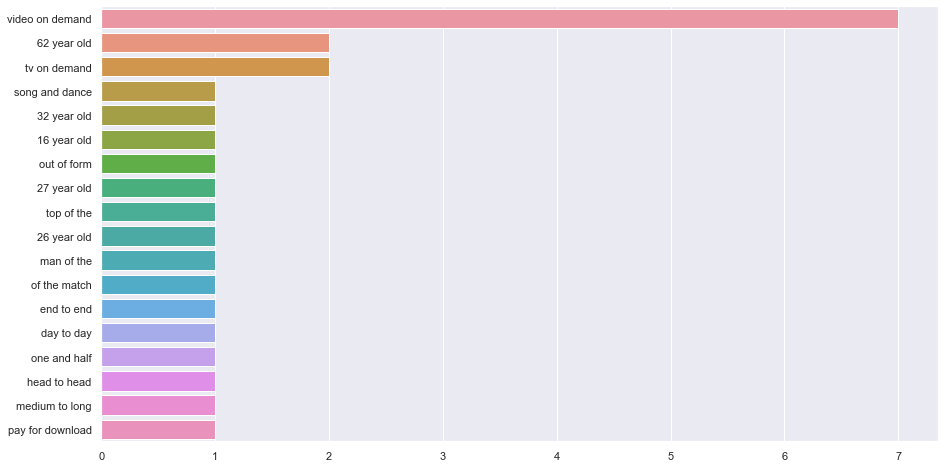

In [11]:
## Trigrams
plot_top_ngrams(news_data['content'], 3)

## 2. Data Cleaning

In [14]:
# Remove new line characters
news_data['content'] = [re.sub('\n', ' ', row) for row in news_data['content']]
# Remove distracting single quotes
news_data['content'] = [re.sub("\'", "", row) for row in news_data['content']]
# Remove distracting double quotes
news_data['content'] = [re.sub("\"", "", row) for row in news_data['content']]
# Remove hyphens and treat them as a single word
news_data['content'] = [re.sub("-", "", row) for row in news_data['content']]


# Remove punctuations, convert text into small-case, remove uneccessary symbols
def pre_process(articles):
    for article in articles:
        yield(gensim.utils.simple_preprocess(str(article), deacc=True))

# Remove stop words such as "the", "a", "of", etc.        
def remove_stopwords(texts):
    return [[word for word in doc if word not in stop_words] for doc in texts]
        
cleaned_content = list(pre_process(news_data['content']))

no_stopword_corpus = remove_stopwords(cleaned_content)
no_stopword_corpus = [" ".join(doc) for doc in no_stopword_corpus]
news_data['content'] = no_stopword_corpus

In [15]:
# Example of cleaned data
news_data['content'][0]

'world number one lindsay davenport criticised wimbledon issue equal prize money women reacting disputed comment england club chairman tim phillips american said think highly insulting prize money taken away somebody think mr phillips said wont money flowers wimbledon thats insulting england club spokesperson denied phillips made remark insisting definitely didnt say statement added said someone else humorous aside end radio interview conversation moved talking wimbledon grounds davenport speaking following announcement weeks dubai duty free event join us australian opens offering equal prize money women hear women playing three sets men play five said daveport best women never going beat best men different game go watch women doesnt make better worse hopefully able change peoples minds serena williams also dubai added im obviously equal prize money womens tennis exciting mens tennis exciting well women right bringing spectators able reap everyone else able reap'

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


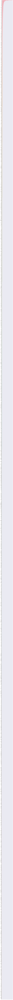

In [16]:
# Plot most common words with cleaned data

plot_most_commom_words(news_data['content'], (10, 900))

## 3. Use the LDA Clustering Algorithm

In [17]:
def preprocess_text(text):
    corpus=[]
    lem=WordNetLemmatizer()
    for news in text:
        words=[w for w in word_tokenize(news)]

        words=[lem.lemmatize(w) for w in words if len(w)>2]

        corpus.append(words)
    return corpus

def get_lda_objects(text):   
    corpus=preprocess_text(text)
    
    dic=gensim.corpora.Dictionary(corpus)
    bow_corpus = [dic.doc2bow(doc) for doc in corpus]
    
    lda_model =  gensim.models.LdaMulticore(bow_corpus, 
                                   num_topics = 60, 
                                   id2word = dic,                                    
                                   passes = 10,
                                   workers = 2,
                                   random_state=0)
    
    return lda_model, bow_corpus, dic

In [18]:
def plot_lda_vis(lda_model, bow_corpus, dic):
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.gensim_models.prepare(lda_model, bow_corpus, dic, sort_topics=False)
    return vis

In [19]:
lda_model, bow_corpus, dic = get_lda_objects(news_data['content'])

In [20]:
lda_model.show_topics()

[(48,
  '0.020*"mcclaren" + 0.010*"first" + 0.010*"would" + 0.010*"well" + 0.010*"place" + 0.010*"graz" + 0.010*"added" + 0.010*"back" + 0.010*"boro" + 0.010*"little"'),
 (19,
  '0.025*"film" + 0.020*"ukip" + 0.019*"said" + 0.017*"ray" + 0.017*"party" + 0.014*"dvd" + 0.014*"best" + 0.014*"hockney" + 0.011*"houston" + 0.008*"oscar"'),
 (2,
  '0.031*"broadband" + 0.014*"year" + 0.011*"get" + 0.011*"operator" + 0.011*"price" + 0.011*"local" + 0.010*"news" + 0.010*"home" + 0.010*"loop" + 0.010*"exchange"'),
 (22,
  '0.032*"xbox" + 0.025*"game" + 0.022*"said" + 0.019*"allard" + 0.016*"console" + 0.013*"would" + 0.013*"microsoft" + 0.013*"title" + 0.010*"make" + 0.010*"new"'),
 (6,
  '0.040*"viacom" + 0.030*"show" + 0.025*"fcc" + 0.020*"fine" + 0.015*"two" + 0.015*"radio" + 0.015*"paid" + 0.015*"stern" + 0.015*"indecency" + 0.010*"station"'),
 (5,
  '0.000*"said" + 0.000*"day" + 0.000*"online" + 0.000*"would" + 0.000*"blogger" + 0.000*"sigarchi" + 0.000*"tax" + 0.000*"iranian" + 0.000*"iran"

In [21]:
plot_lda_vis(lda_model, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is de

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.184409  0.070787       1        1  4.320858
1      0.077228 -0.080398       2        1  1.012918
2     -0.102930  0.041807       3        1  3.532757
3      0.074216  0.004221       4        1  0.007755
4     -0.022334  0.132428       5        1  2.147998
5      0.073985  0.004332       6        1  0.007755
6      0.062539 -0.005025       7        1  1.037214
7     -0.129999 -0.027400       8        1  6.431067
8     -0.135302  0.002098       9        1  5.125767
9      0.029767 -0.060118      10        1  1.536298
10     0.072094  0.004654      11        1  0.007755
11    -0.131012 -0.001053      12        1  3.454756
12    -0.072996 -0.139879      13        1  2.869821
13     0.038114 -0.038695      14        1  1.817038
14    -0.130662  0.037820      15        1  3.573708
15     0.074957 -0.021366      16        1  1.138589
16     0.072358  0.000185      17        1  1.287629
17     0.068464  0.002789      18        1  0.007755
18     0.056456  0.016216      19        1  1.253036
19    -0.037554 -0.016583      20        1  2.248395
20    -0.123697 -0.084744      21        1  2.779133
21     0.008453  0.140483      22        1  1.654777
22    -0.035418 -0.035061      23        1  1.910618
23    -0.008824 -0.054775      24        1  1.356938
24     0.038691  0.046501      25        1  1.037777
25     0.072425  0.004374      26        1  0.007755
26     0.074677  0.004465      27        1  0.007755
27    -0.210050  0.029162      28        1  5.023164
28     0.073531  0.003959      29        1  0.007755
29    -0.067231  0.068241      30        1  2.949960
30     0.074794  0.004030      31        1  0.007755
31    -0.030769 -0.113954      32        1  2.027682
32    -0.056767 -0.164706      33        1  5.003769
33     0.073270  0.003517      34        1  0.007755
34     0.074676  0.004185      35        1  0.007755
35     0.032257  0.055853      36        1  1.325745
36     0.074442  0.003929      37        1  0.007755
37    -0.103742  0.161120      38        1  3.092721
38     0.053239  0.079620      39        1  1.299308
39     0.069435  0.004489      40        1  0.007755
40    -0.022343  0.042218      41        1  1.512903
41     0.034688  0.103305      42        1  1.247763
42    -0.140836 -0.048127      43        1  5.466739
43     0.072638  0.003701      44        1  0.007755
44     0.074565  0.003641      45        1  0.007755
45     0.016509  0.095902      46        1  1.408461
46     0.074678  0.004130      47        1  0.007755
47    -0.050604 -0.055070      48        1  1.996489
48     0.063062 -0.080389      49        1  1.045012
49     0.100910 -0.043218      50        1  1.255561
50     0.073542  0.002893      51        1  0.007755
51    -0.086513 -0.021468      52        1  2.364917
52    -0.077650 -0.023920      53        1  2.643666
53    -0.148164 -0.031869      54        1  4.152608
54    -0.002463 -0.098895      55        1  2.179757
55     0.072906  0.005002      56        1  0.007755
56     0.072420  0.004103      57        1  0.007755
57     0.073671  0.004581      58        1  0.007755
58     0.070201  0.006044      59        1  0.007755
59    -0.107588  0.039926      60        1  2.321572, topic_info=       Term       Freq      Total Category  logprob  loglift
2397  blair  35.000000  35.000000  Default  30.0000  30.0000
610    sale  22.000000  22.000000  Default  29.0000  29.0000
69    radio  27.000000  27.000000  Default  28.0000  28.0000
98    world  40.000000  40.000000  Default  27.0000  27.0000
439    bank  21.000000  21.000000  Default  26.0000  26.0000
...     ...        ...        ...      ...      ...      ...
2396   bill   1.682163  13.391001  Topic60  -5.1760   1.6884
351    help   1.661510  15.574785  Topic60  -5.1883   1.5250
75      say   1.649559  30.831224  Topic60  -5.1956   0.8349
1168   life   1.641686  14.868767  Topic60  -5.2003   1.5594


In [22]:
corpus=preprocess_text(news_data['content'])
dic=gensim.corpora.Dictionary(corpus)
bow_corpus = [dic.doc2bow(doc) for doc in corpus]

In [23]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=corpus, dictionary=dic, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.5087956911487027


## 4. Use the LDA Mallet Clustering Algorithm

In [24]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'mallet-2.0.8/bin/mallet'
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=bow_corpus, num_topics=60, id2word=dic)

Mallet LDA: 60 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.97557
<20> LL/token: -9.70898
<30> LL/token: -9.60883
<40> LL/token: -9.53154

0	0.83333	year serena national point past blue time win venus slam final tennis beat borrowing sister injury losing installed dementieva sheila 
1	0.83333	card plan scheme spokesman police austria setting lib denied decision senior council cable dems compared souness successful source found terror 
2	0.83333	china khan young deficit visa opened disney export visitor norway bombay actress trillion xie revenue wanted working notice involved driven 
3	0.83333	side nation france back injury rugby saturday forward jones thomas scotland recovered laporte henson squad serge betsen man french leg 
4	0.83333	visual end airline growth began handset competition domestic manager due exploit turn legal wasenius listening enabled usage providing depending hitech 
5	0.83333	told bbc spokesman dont week 

<60> LL/token: -9.41103
<70> LL/token: -9.41737
<80> LL/token: -9.38408
<90> LL/token: -9.36858

0	0.83333	win player added serena grand hard venus final slam challenge tennis mind beat champion weve sister error dont open moved 
1	0.83333	card lib decision denied dem scheme plan police insisted dems cabinet mark senior decade asked reported tool expert yeo terror 
2	0.83333	china past success khan back yuan pace deficit visa involved taking norway actress released ministry telling produce united notice venture 
3	0.83333	france injury back saturday rugby scotland laporte henson squad serge betsen gavin thomas recovered missed jimmy bernard sebastien brought man 
4	0.83333	visual deal run indian began nokia manager share domestic today price begin wasenius downloaded happening carrier banker statistic frenzy route 
5	0.83333	told bbc spokesman week dont meeting news warned cabinet sunday pair hand personal ally robert political kilroysilk tuesday winning longer 
6	0.83333	recall wenger

<110> LL/token: -9.33305
<120> LL/token: -9.31345
<130> LL/token: -9.32305
<140> LL/token: -9.34709

0	0.83333	player win serena grand venus played final point slam perform past losing wimbledon tennis champion weve sister error beat suffered 
1	0.83333	card decision lib denied spokesman police scheme matt handling senior compared source met lead troop paying marginal yeo terror stopped 
2	0.83333	year china trade khan yuan visa success bombay trading deficit category norway taking lawyer released xie expansion state export role 
3	0.83333	france injury back saturday scotland laporte squad serge recovered missed expected betsen jimmy sebastien confident win rome parker gavin wasp 
4	0.83333	due indian share open impact began borrowing run picked working visitor commercial financial gave begin carrier banker air impressive english 
5	0.83333	told bbc dont cabinet news week robert sunday taylor warned people unified spokesman meeting important produced pair hand community dominant 
6	0.8

<160> LL/token: -9.34167
<170> LL/token: -9.32648
<180> LL/token: -9.31416
<190> LL/token: -9.28699

0	0.83333	win player serena grand venus played latest slam final point start weve sister force error denied mental disappointment champion wouldnt 
1	0.83333	card decision police shadow home denied bomb source easy matt debate senior decade cost condition yeo terror stopped pledged introduce 
2	0.83333	year china trade khan high yuan deficit visa trading commerce produce role norway actress chief arash xie ministry exporting rising 
3	0.83333	france injury saturday laporte face squad serge betsen thursday missed leg jimmy download included lanka wasp olivier marlu ma jeanphilippe 
4	0.83333	recently include open eurodisney free defence partly picked opened disney hdtv usage provider impressive tourist progress spend limited improving volume 
5	0.83333	told news spokesman week dont cabinet bbc launch taylor mark warned pair killed brought lost branded monday stateowned speculation meetin

<210> LL/token: -9.28123
<220> LL/token: -9.28323
<230> LL/token: -9.28181
<240> LL/token: -9.27477

0	0.83333	serena played grand venus player slam final made point style weve sister perform error close newcastle zealand period defeat halftime 
1	0.83333	card home decision easy denied police source met senior reached yeo stopped introduce compared bar life scheme family join soundtrack 
2	0.83333	year china trade khan rising yuan visa weakening deficit norway actress administration taking xie peg ministry today notice sector chief 
3	0.83333	france injury saturday coach win back laporte confident squad serge betsen centre recovered missed bernard sebastien crucial ruddock wasp olivier 
4	0.83333	share recently firm range strong previously eurodisney open hype restructuring disney banker fresh sell paris opened attraction loss company snalune 
5	0.83333	told dont week cabinet news warned taylor highlight launch longer pair hand ability past issue pestons trust manoeuvring damaging alle

<260> LL/token: -9.2778
<270> LL/token: -9.26418
<280> LL/token: -9.24393
<290> LL/token: -9.26236

0	0.83333	play played serena grand venus challenge half slam hard champion win sister error easy losing called mental martyn stewart thomas 
1	0.83333	card shadow support denied police scheme decision important home compared view involved banking yeo terror stopped pledged introduce davis stay 
2	0.83333	year china rising yuan period deficit trade visa slowdown commerce system event ministry weakening disappointed fell amount issued codenamed successfully 
3	0.83333	france coach saturday injury scotland laporte bbc centre ruddock henson squad serge recovered missed betsen expected spirit wide stephen wasp 
4	0.83333	share recently open chance eurodisney opened disney cent financial million endured agreed daily stock sell deal attraction visitor glasgow demonstrate 
5	0.83333	told dont news past khan start taylor trading hand norway commercial reported organised poster ensure notice india

<310> LL/token: -9.27561
<320> LL/token: -9.2291
<330> LL/token: -9.26564
<340> LL/token: -9.27137

0	0.83333	player played serena grand williams venus final win slam important dont play beat showed weve sister error injury losing included 
1	0.83333	card home lib cost denied secretary police scheme source senior mark unfair terror stopped remember bad met branded announced join 
2	0.83333	china trade year yuan currency job period business slowdown peg weakening deficit area export increase handing code rollout ons concerned 
3	0.83333	france saturday injury thomas scotland laporte confident centre squad serge missed betsen jimmy sebastien eef troop spirit rome kicker wasp 
4	0.83333	company recently share eurodisney growth banking release restructuring picked opened financial end february rupee domestic slipped stay sell disney attraction 
5	0.83333	told past khan start dont drop visa give driven taking champion commercial stateowned african argument broke theme hand notice norway 
6	

<360> LL/token: -9.28454
<370> LL/token: -9.27761
<380> LL/token: -9.2714
<390> LL/token: -9.258

0	0.83333	player serena dont grand win venus played hard final point slam losing tennis beat champion weve sister error year mind 
1	0.83333	card home life denied police source decision senior reached monday scheme easy properly cost pension terror stopped introduce davis compared 
2	0.83333	china trade yuan period deficit debt increase peg commerce weakening keeping export success neat xie tightening ministry criminally start spend 
3	0.83333	injury france saturday back laporte henson squad serge missed betsen centre jimmy beating wasp olivier nicolas marlu ma jeanphilippe harinordoquy 
4	0.83333	company challenge recently open deal share eurodisney million restructuring main disney financial giuseppe job wave stay opened attraction site situation 
5	0.83333	khan visa deputy alleged back visitor norway core recover church routine notice bombay actress past year protection infected usefuln

<410> LL/token: -9.27211
<420> LL/token: -9.27796
<430> LL/token: -9.25958
<440> LL/token: -9.29232

0	0.83333	player serena played injury hard final decade venus slam grand losing point display weve sister error business kilroysilks dementieva confidence 
1	0.83333	card decision home issue denied police mark cost easy source met good scheme endured terror introduce davis compared bar produce 
2	0.83333	china growth trade period yuan pace suffered similar deficit export continued peg commerce weakening job host close xie ministry hitech 
3	0.83333	france back saturday win centre thomas laporte coach confident injury henson serge missed betsen hype play squad jimmy sebastien wasp 
4	0.83333	recently share eurodisney opened firm disney visitor air brighton le tourist paris debt attraction time range gig nontechnical podcasts prowess 
5	0.83333	khan back year black visa routine norway controversy actress office defence posed football wrong notice immigration bombay joining recognised los 

<460> LL/token: -9.2441
<470> LL/token: -9.2769
<480> LL/token: -9.25978
<490> LL/token: -9.22025

0	0.83333	serena point played grand past final win venus slam display weve sister error dont ministry spell continue perform declining close 
1	0.83333	card decision issue denied police home set front good scheme easy cost support david intervened yeo terror pledged ordinary introduce 
2	0.83333	china growth annual general trade month similar fell loss yuan economic period deficit peg commerce blamed bond continued eef stateowned 
3	0.83333	france injury saturday thomas scotland laporte ruddock squad serge betsen centre henson missed jimmy bernard sebastien international wasp trip olivier 
4	0.83333	share recently firm eurodisney group airway impressive studio restructuring disney initial million carrier stern argument daily sort sell opened deal 
5	0.83333	year back told khan ago visa bombay role norway actress pain broke irish focus stage wrong combine retailer weakening merrill 
6	0.83

<510> LL/token: -9.24314
<520> LL/token: -9.25061
<530> LL/token: -9.23353
<540> LL/token: -9.26131

0	0.83333	serena win grand strong venus played past slam weve sister ive error close pressure losing final spirit french defeat basis 
1	0.83333	card home decision denied police scheme easy issue compared affair mark announced yeo terror stopped pledged introduce davis bomb explained 
2	0.83333	similar china growth trade yuan deficit rise lead blamed tightening ministry hitech commerce regulation rapid complain suffered produced track mp 
3	0.83333	injury france back serge laporte betsen playing thomas squad missed jimmy sebastien case stephen olivier nicolas marlu ma leg harinordoquy 
4	0.83333	share recently eurodisney opened disney visitor spend perform open russia stock stay single sell restructuring attraction local chat dent strained 
5	0.83333	year work khan visa told bombay today working routine norway actress freedom bar pea scene hoping notice immigration back playstation 
6	0

<560> LL/token: -9.23508
<570> LL/token: -9.23902
<580> LL/token: -9.22325
<590> LL/token: -9.25872

0	0.83333	hard made grand serena venus played slam impact regional weve sister error zealand attacking tournament situation player declining final amount 
1	0.83333	card decision issue denied home police scheme benefit hold decade easy support announced life inspection terror pledged introduce davis argument 
2	0.83333	china trade growth period yuan deficit continued made peg commerce sign red suggests building endured weakening expansion crucial point sensitive 
3	0.83333	back france injury forward laporte serge missed betsen confident suspended face thursday call giving weekend wasp squad olivier nicolas marlu 
4	0.83333	share recently open damaged opened eurodisney visitor financial viacom spring london sell restructuring disney attraction performance business shareholder euro reidar 
5	0.83333	year give khan work visa role involved back trading norway actress past handling working j

<610> LL/token: -9.2365
<620> LL/token: -9.22719
<630> LL/token: -9.25478
<640> LL/token: -9.27256

0	0.83333	player played serena win grand venus slam display championship weve sister error close challenge injury hard final visit dementieva broke 
1	0.83333	card end decision home denied people police concern issue source easy council compared affair situation money endured authority ultimately objective 
2	0.83333	growth china similar market produce trade deficit yuan trading peg commerce currency pace sector perform impact continued ministry blamed benefit 
3	0.83333	france injury laporte confident thomas serge missed betsen sebastien forward wednesday panel wasp olivier nicolas marlu ma jimmy jeanphilippe harinordoquy 
4	0.83333	recently open share domestic firm eurodisney visitor public financial providing air single disney state properly gmc demonstrate foray door spammer 
5	0.83333	year work khan call past back working visa office norway deputy actress response notice venture exp

<660> LL/token: -9.26313
<670> LL/token: -9.24166
<680> LL/token: -9.22231
<690> LL/token: -9.23901

0	0.83333	player played world serena welsh win venus grand final slam pressure french display weve sister important error close wave stem 
1	0.83333	card decision home issue police denied source front scheme easy council yeo stopped pledged davis argument allegedly tourist running decade 
2	0.83333	china trade period yuan similar deficit expected rise commerce expansion job keeping report increase ministry hitech pace pressure british sensitive 
3	0.83333	france injury scotland laporte serge betsen squad missed sebastien wasp olivier nicolas marlu ma jeanphilippe harinordoquy grandclaude coach bernard focus 
4	0.83333	firm open recently deal hour eurodisney pay restructuring opened disney visitor financial air banking turning troubled sell part finance attraction 
5	0.83333	work khan john working bombay back year regional division visa official norway actress office stereotype spell lio

<710> LL/token: -9.25286
<720> LL/token: -9.23855
<730> LL/token: -9.28959
<740> LL/token: -9.27969

0	0.83333	player world williams serena welsh great played grand made win venus injury final slam losing beat champion weve sister family 
1	0.83333	card decision issue denied police scotland falling home easy bad source met read scheme council expensive stopped introduce davis scottish 
2	0.83333	china growth high pressure period yuan deficit trade export peg commerce expansion pace continued figure xie ministry exporting weakening job 
3	0.83333	france confident injury serge missed laporte betsen forward awareness olivier nicolas marlu ma jeanphilippe harinordoquy grandclaude combination stuart sebastien hope 
4	0.83333	share recently firm director made opened main eurodisney company restructuring disney visitor home financial competitive ruled drayton planning walt troubled 
5	0.83333	back year khan immigration visa song routine norway controversy actress newspaper jackson notice home

<760> LL/token: -9.27723
<770> LL/token: -9.23293
<780> LL/token: -9.23673
<790> LL/token: -9.25243

0	0.83333	player great win serena welsh venus played grand slam losing final gavin display weve sister important error close supporter stem 
1	0.83333	card decision home shadow denied police source cost spokesman hold driven scheme support yeo stopped pledged introduce davis objective response 
2	0.83333	china growth trade similar yuan deficit hype peg commerce weakening pace period confidence mark xie ministry healthy blamed brighton anfield 
3	0.83333	france injury saturday back laporte squad serge scotland recovered missed betsen face jimmy expected wasp olivier marlu ma jeanphilippe grandclaude 
4	0.83333	firm share recently million company open belief opened eurodisney restructuring deal initial high handing main disney attraction visitor give financial 
5	0.83333	year work khan past back visa bombay famous success routine role norway involved call bollywood actress dominant notice

<810> LL/token: -9.24049
<820> LL/token: -9.25983
<830> LL/token: -9.30813
<840> LL/token: -9.27493

0	0.83333	win player played serena welsh grand great venus slam hard period display championship weve sister error final play shamble legend 
1	0.83333	card decision end denied home hold society police easy statistic front scheme monday terror stopped pledged davis compared objective nigel 
2	0.83333	china taking produce head yuan deficit trade issue industry job panel ministry similar put joining bank reported talking end glimpse 
3	0.83333	france injury saturday back victory thomas scotland laporte squad serge recovered betsen confident man missed leg jimmy perspective anfield olivier 
4	0.83333	firm company share director recently control initially trading bad restructuring disney financial problem satellite rewind gold clear mutual planning daily 
5	0.83333	year khan fact back visa bombay bollywood work visitor routine norway actress issued december sell english immigration american

<860> LL/token: -9.2672
<870> LL/token: -9.25818
<880> LL/token: -9.25647
<890> LL/token: -9.23722

0	0.83333	player win williams serena great played grand venus slam important rugby display weve sister error challenge final bill zealand summer 
1	0.83333	card decision denied police home hold decade dont david end yeo terror press pledged introduce asian medium money ingame communicate 
2	0.83333	china head demand trade yuan pace job damaged issue commerce weakening annual deficit xie extending spirit ball point panel face 
3	0.83333	france injury saturday nation scotland laporte thomas squad serge expected betsen hype missed jimmy bernard sebastien man default engine beating 
4	0.83333	firm share company recently control catch eurodisney action proving restructuring opened main disney meant visitor adult stowell shamble mutual cochairman 
5	0.83333	year khan statistic visa bombay routine norway initial back september dance work office spywareremoval demographic bell gauge frost aara t

<910> LL/token: -9.26283
<920> LL/token: -9.2277
<930> LL/token: -9.22202
<940> LL/token: -9.26665

0	0.83333	player win great played venus grand final serena slam past important williams weve sister error supporter observed dementieva broke previously 
1	0.83333	card decision end denied chairman police home easy bomb source dont issue sign held secretary insisted dems senior situation support 
2	0.83333	china trade similar yuan future deputy spend peg weakening dollar deficit hdtv xie ministry hitech commerce expansion middlesbrough export england 
3	0.83333	france injury saturday scotland serge laporte betsen beginning squad jimmy wasp olivier nicolas missed marlu ma jeanphilippe harinordoquy grandclaude damien 
4	0.83333	firm company recently loss low eurodisney turning opened disney visitor call interest faster mechanism trading walt sell attraction addition begin 
5	0.83333	year khan visa general produced working norway immigration expensive argued notice actress flight work predi

<960> LL/token: -9.26099
<970> LL/token: -9.24409
<980> LL/token: -9.26573
<990> LL/token: -9.23601

0	0.83333	player williams nation great win grand serena venus played past squad man slam losing final tennis event point display early 
1	0.83333	card decision police issue denied dem home lib dems argued source met mark senior reached tightening terror stopped pledged introduce 
2	0.83333	made china state trade yuan deficit figure control commerce export issued supreme xie trading ministry thousand died country administration gave 
3	0.83333	france injury saturday recovered laporte serge betsen missed pressure wasp olivier nicolas marlu ma harinordoquy grandclaude flanker stuart brought broke 
4	0.83333	strong recently time share open firm involved perform flight made restructuring picked opened eurodisney disney visitor controversy weve problem peso 
5	0.83333	year taking khan give previous visa office posed gain success norway actress died notice indian viewing eastenders unprotected

In [25]:
# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=corpus, dictionary=dic, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('Coherence Score: ', coherence_ldamallet)

Coherence Score:  0.5596391456880173


## 5. Compare models to get the best clustering algorithm (LDA vs LDA Mallet)

In [26]:
def lda_vs_ldamallet(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values_lda = []
    coherence_values_ldamallet = []
    model_list_lda = []
    model_list_ldamallet = []
    
    for num_topics in range(start, limit, step):
        model_lda = gensim.models.LdaMulticore(corpus=bow_corpus, num_topics = num_topics, id2word = dic, passes = 10,workers = 2, random_state=0)
        model_list_lda.append(model_lda)
        coherencemodel = CoherenceModel(model=model_lda, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values_lda.append(coherencemodel.get_coherence())
        
        model_lda_mallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=bow_corpus, num_topics=num_topics, id2word=dic)
        model_list_ldamallet.append(model_lda_mallet)
        coherencemodel = CoherenceModel(model=model_lda_mallet, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values_ldamallet.append(coherencemodel.get_coherence())

    return model_list_lda, model_list_ldamallet, coherence_values_lda, coherence_values_ldamallet

In [27]:
model_list_lda, model_list_ldamallet, coherence_values_lda, coherence_values_ldamallet = lda_vs_ldamallet(dictionary=dic, 
                                                                                                          corpus=bow_corpus, 
                                                                                                          texts=corpus, 
                                                                                                          start=2, 
                                                                                                          limit=60, 
                                                                                                          step=2)

Mallet LDA: 2 topics, 1 topic bits, 1 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.36768
<20> LL/token: -9.29621
<30> LL/token: -9.28302
<40> LL/token: -9.25632

0	25	blair labour radio tax show told minister government number market brown election plan prime news phone country day camera money 
1	25	year people world game time made sale service bank make music end net top added home player broadband firm technology 

<50> LL/token: -9.24876
<60> LL/token: -9.24542
<70> LL/token: -9.22489
<80> LL/token: -9.23282
<90> LL/token: -9.22358

0	25	blair labour radio people tax show told minister government number market brown election plan day prime sale news film money 
1	25	year world people game time made service bank make music rate end net player top added home million broadband firm 

<100> LL/token: -9.21824
<110> LL/token: -9.20622
<120> LL/token: -9.20769
<130> LL/token: -9.20394
<140> LL/token: -9.20268

0	25	blair labour radio tax show told ministe

<60> LL/token: -9.28426
<70> LL/token: -9.24075
<80> LL/token: -9.22082
<90> LL/token: -9.22281

0	12.5	blair labour minister government number tax people music rate brown election prime film money party added chancellor woman howard family 
1	12.5	world game radio show make told end plan phone camera mobile good week work record medium public station put hiphop 
2	12.5	year service market day top home million broadband country win tory life set programme offer local back access wale project 
3	12.5	people made sale time bank technology firm month program spokesman cut player report profit williams member side half director cent 

<100> LL/token: -9.23273
<110> LL/token: -9.21416
<120> LL/token: -9.19771
<130> LL/token: -9.19097
<140> LL/token: -9.16987

0	12.5	blair labour tax told minister government rate brown election plan prime film money party public week chancellor tory woman howard 
1	12.5	world game radio show make music phone camera mobile good work user medium end station pu

<710> LL/token: -9.06027
<720> LL/token: -9.06055
<730> LL/token: -9.06246
<740> LL/token: -9.07292

0	12.5	blair labour tax told minister government brown election plan prime film money party week public chancellor tory howard family campaign 
1	12.5	game radio show make music world player phone end camera technology mobile work month set digital station hiphop play medium 
2	12.5	people year service net day top home news million broadband firm world country report time user program programme record offer 
3	12.5	year sale bank rate market made win life good added cut economy wale part place profit williams england rise race 

<750> LL/token: -9.06736
<760> LL/token: -9.07161
<770> LL/token: -9.07093
<780> LL/token: -9.07144
<790> LL/token: -9.05945

0	12.5	blair labour tax told minister government brown election plan prime film party week money public chancellor tory howard spokesman family 
1	12.5	game radio show people make music end world player phone camera month mobile work set 

<260> LL/token: -9.0726
<270> LL/token: -9.06523
<280> LL/token: -9.08347
<290> LL/token: -9.06591

0	8.33333	sale bank rate year market country money cut set time people economy part rise investment interest consumer economic private fall 
1	8.33333	game made day added good end win family back week play williams called national race cent injury criminal match france 
2	8.33333	blair labour tax minister brown election plan prime told government party public chancellor tory bbc howard spokesman record campaign bill 
3	8.33333	world radio people music film phone camera report mobile make work number digital station hiphop project real month visual similar 
4	8.33333	show year player life top world million wale england place number side half speed share model great nair bonus building 
5	8.33333	year people net home news broadband firm service user woman program offer programme security research time local virus access profit 

<300> LL/token: -9.05492
<310> LL/token: -9.0527
<320> LL/tok

<710> LL/token: -9.01983
<720> LL/token: -9.00969
<730> LL/token: -8.99243
<740> LL/token: -9.01811

0	8.33333	sale bank year rate market life country cut economy profit rise investment interest euro consumer made economic director private fall 
1	8.33333	game day added good win make made back family play wale player place williams england called race side half france 
2	8.33333	blair labour told minister government tax brown election plan prime money party public chancellor tory howard spokesman campaign bill put 
3	8.33333	radio people number world music phone camera month mobile report digital station hiphop real part project visual cent song website 
4	8.33333	year show top film record national world system speed lift control pressure car high model nair biggest office super young 
5	8.33333	time people net home service broadband firm news million program end programme user offer technology local security research virus access 

<750> LL/token: -9.00558
<760> LL/token: -8.99126
<77

<110> LL/token: -9.10358
<120> LL/token: -9.09974
<130> LL/token: -9.09822
<140> LL/token: -9.08666

0	6.25	tax bank rate year sale time country market life plan cut economy bill profit card rise investment interest euro economic 
1	6.25	blair labour minister told brown election prime party government chancellor tory public howard spokesman record campaign leader issue book member 
2	6.25	people net home news broadband firm user million program programme offer local security virus research online year watch visual criminal 
3	6.25	people radio music phone camera month mobile good service report digital station similar website company analyst television lead real model 
4	6.25	world film year back top project cable price system speed nation control access chance pressure office national nair fund viacom 
5	6.25	show year work world hiphop casino medium song group british track millan taking machine written rap spain hard change super 
6	6.25	game player win play wale williams england si

<460> LL/token: -9.01886
<470> LL/token: -9.01732
<480> LL/token: -8.99826
<490> LL/token: -9.0212

0	6.25	year bank rate country market life cut economy profit rise sale time investment interest euro consumer economic fall european cost 
1	6.25	blair labour tax told minister government brown election prime party public chancellor tory plan howard spokesman bill bbc leader card 
2	6.25	net home news broadband firm year people user program programme offer security virus access service end criminal research local search 
3	6.25	people radio music phone camera report month mobile work service digital station project technology visual million company channel analyst make 
4	6.25	world film record system speed lift director office nair high control young sharp actor india tower including fair pressure performance 
5	6.25	show top number year world medium put hiphop real casino cent song group announced track millan chance time rap fan 
6	6.25	game made good win player wale place williams en

<810> LL/token: -8.98609
<820> LL/token: -8.98213
<830> LL/token: -8.97819
<840> LL/token: -8.99553

0	6.25	year sale bank rate market life country cut economy made part profit rise investment interest euro consumer economic fall european 
1	6.25	blair labour tax minister government brown election prime told party public plan chancellor tory howard spokesman bill leader card member 
2	6.25	net home broadband firm year service user people program news programme offer security research end virus access local cable criminal 
3	6.25	radio music phone camera report mobile people month world work digital station project million visual similar channel player technology analyst 
4	6.25	world film record top year system speed lift control pressure high machine office nair building young actor india tower minute 
5	6.25	show number time put hiphop casino medium year set cent group announced latest track millan real top rap fan song 
6	6.25	game good win back made week play wale player place will

<160> LL/token: -9.05228
<170> LL/token: -9.05967
<180> LL/token: -9.06656
<190> LL/token: -9.054

0	5	home end money woman program real virus year criminal men taking machine written biggest national change network meant spyware malicious 
1	5	year sale bank rate market report cut economy life profit rise price firm investment euro consumer interest fall european cost 
2	5	year show number time casino british medium similar song telewest cable announced offering high big service viacom super live videoondemand 
3	5	game good win added back offer week play williams player place half match told thing club job start great mike 
4	5	blair labour tax minister brown election government prime party told plan chancellor tory public spokesman people howard family bill campaign 
5	5	day made set country economic xbox state argentina china dollar goal debt sentence president remains earlier court international current hold 
6	5	wale england bbc race side france make made nation injury stand wedn

<460> LL/token: -9.00098
<470> LL/token: -9.01956
<480> LL/token: -9.041
<490> LL/token: -9.00617

0	5	net news broadband firm woman program user security virus home put research criminal money men web machine computer people connection 
1	5	year sale bank rate life market cut economy time profit rise investment interest euro consumer store private fall cost share 
2	5	show number year end offer time casino medium service cable song added telewest price announced offering le big content viacom 
3	5	game good player made place williams play added side club goal match start great mike official win team houllier job 
4	5	blair labour tax told minister government brown election prime party plan public chancellor tory howard spokesman bill leader member book 
5	5	people day family set part online country xbox state argentina international made china case sentence future president easy court current 
6	5	week bbc back wale england race half france nation injury year make deal win important w

<760> LL/token: -9.02206
<770> LL/token: -9.00627
<780> LL/token: -9.01024
<790> LL/token: -9.01597

0	5	net home broadband news people firm program user security research million virus access criminal real web machine computer connection software 
1	5	year sale rate market cut life economy profit rise investment interest euro consumer store economic european cost bank europe growth 
2	5	year show time service offer medium casino british number cable local telewest price announced le big offering viacom super live 
3	5	game added good made player place williams end decision woman men match international money club goal start great mike official 
4	5	blair labour tax minister government brown election plan prime party public tory told chancellor howard bill card member spokesman book 
5	5	people day bank family set country make online private made xbox argentina campaign easy fund case sentence state court current 
6	5	win wale race side half france told play england nation injury back 

<60> LL/token: -9.24128
<70> LL/token: -9.18777
<80> LL/token: -9.15978
<90> LL/token: -9.16245

0	4.16667	made woman place london men match pressure injury club job goal leader important back play coach team mind event houllier 
1	4.16667	people money virus project rate budget television firm taking written fund bonus head risk network stock meant common european change 
2	4.16667	show good win set game card end national home real announced cent dont start easy super remains wednesday trial monday 
3	4.16667	people make top day net online called month visual access station speed website lift part argentina lead debt building due 
4	4.16667	tax bank plan government cut life economy bill rate british howard decision investment interest economic country time market term international 
5	4.16667	year family euro profit growth china warned back case sentence demand increased performance court europe biggest iranian blogger ipod heineken 
6	4.16667	world sale record hiphop rise france consu

<310> LL/token: -9.03752
<320> LL/token: -9.04095
<330> LL/token: -9.0378
<340> LL/token: -9.03182

0	4.16667	win wale williams england added good side france play half player injury place club goal match great saturday coach team 
1	4.16667	net people program security research woman virus criminal machine computer end job written money change software risk network meant spyware 
2	4.16667	show year song back cent viacom super remains performance trial earlier end bowl agreed paul singer paid fcc halftime fine 
3	4.16667	top day record time speed people lift bbc system pressure high international online problem control building sentence president court current 
4	4.16667	bank rate life cut economy country market rise investment consumer money economic private interest cost argentina strong debt sector fund 
5	4.16667	made year family profit euro european europe warned china sale biggest growth demand increased annual marketing heineken carlsberg revenue recall 
6	4.16667	world sale hip

<560> LL/token: -9.0075
<570> LL/token: -9.02727
<580> LL/token: -9.01916
<590> LL/token: -9.02518

0	4.16667	win good game wale williams england back place side half france player injury play nation match club goal great mike 
1	4.16667	year people net home end program security virus user criminal machine computer connection important technology woman head network written meant 
2	4.16667	show cent year past viacom super remains trial bowl ago performance paul live paid wednesday santander earlier botin end fcc 
3	4.16667	day top record world casino called system speed lift announced control pressure high national sentence campaign court tower minute current 
4	4.16667	bank rate money market cut time economy life added rise investment interest year economic argentina private continue term consumer set 
5	4.16667	year made family profit sale euro europe warned fall china job european biggest dollar demand future increased growth annual fell 
6	4.16667	world sale medium put hiphop week 

<810> LL/token: -9.00456
<820> LL/token: -9.00921
<830> LL/token: -9.01086
<840> LL/token: -9.01494

0	4.16667	win game back added wale williams england place side half good france player injury match play club great mike made 
1	4.16667	people home net woman program security research virus criminal user men machine computer end connection written technology money change software 
2	4.16667	show year end set viacom super live remains trial earlier event bowl performance wednesday paul ago singer deputy paid santander 
3	4.16667	day top world record casino system speed lift called online pressure national high announced sentence court case current tower minute 
4	4.16667	bank rate year market cut economy made rise life money investment interest consumer economic private state continue start debt argentina 
5	4.16667	sale family profit euro european growth warned fall car model china retail expected increased rose demand marketing made heineken carlsberg 
6	4.16667	world medium country h

<60> LL/token: -9.26076
<70> LL/token: -9.23203
<80> LL/token: -9.18959
<90> LL/token: -9.17163

0	3.57143	sale rate good rise investment euro store fall european consumer economic continue dollar expected strong debt chief cost business retail 
1	3.57143	people day home online similar website taking case sentence easy court make pc release success iranian blogger threat crime study 
2	3.57143	radio show service added time programme station watch visual telewest cable channel offering television month handset thing content viacom super 
3	3.57143	world top work hiphop firm record group lift medium speed control millan track rap fan bonus desktop web meant user 
4	3.57143	game make year play people race system xbox week lot building give mind minute difficult title school office allard dvd 
5	3.57143	tax money woman program security virus cent criminal latest machine computer written wednesday put million malicious head part change expert 
6	3.57143	film win wale side half france back i

<260> LL/token: -9.01979
<270> LL/token: -9.05379
<280> LL/token: -9.05387
<290> LL/token: -9.0411

0	3.57143	sale profit rise euro consumer store fall european europe growth expected car china sector continue chief retail risk demand increased 
1	3.57143	day family campaign called director film biggest sentence bbc court office release online iranian blogger move ray dvd gave case 
2	3.57143	show radio programme station medium watch visual similar song telewest channel television content viacom super live videoondemand ntl bowl ago 
3	3.57143	world top number record hiphop system speed lift track millan rap radio tower spanish spain high american minute listener language 
4	3.57143	game make race year play xbox goal important lot coach performance difficult part title support allard wenger future run sport 
5	3.57143	net people user home end program security virus firm money criminal web machine computer written software head network change spyware 
6	3.57143	wale film side france hal

<460> LL/token: -9.01305
<470> LL/token: -9.02988
<480> LL/token: -9.00727
<490> LL/token: -9.01613

0	3.57143	sale year profit rise euro consumer store fall european growth continue car europe china expected sector chief biggest retail risk 
1	3.57143	number day family campaign bbc people website office make case sentence coming court current called release online iranian blogger ray 
2	3.57143	radio show medium programme station watch visual similar song channel television chance content viacom head super live trial bowl ago 
3	3.57143	world top record hiphop speed year lift system control track millan rap fan pressure spain group building artist american tower 
4	3.57143	game make part people race cent xbox set important lot give easy performance earlier winning lost title support playing play 
5	3.57143	net people user program security virus home criminal web machine computer written firm technology end connection taking spyware malicious email 
6	3.57143	film back wale side france

<660> LL/token: -8.98236
<670> LL/token: -8.99345
<680> LL/token: -9.00724
<690> LL/token: -8.99666

0	3.57143	sale year profit rise euro consumer store fall growth warned car china expected sector continue chief european business europe retail 
1	3.57143	number film day family office sentence actor online including bbc current iranian blogger move campaign release ray dvd director box 
2	3.57143	radio show station visual song medium watch television chance taking lead thing viacom live area time super bowl ago paul 
3	3.57143	world year top record hiphop system speed lift track millan pressure high rap fan spain group building performance artist tower 
4	3.57143	game make people part race cent xbox important easy team lot mind forward difficult title support allard wenger london hope 
5	3.57143	net user program home security virus criminal year people woman web machine written firm software computer technology change spyware malicious 
6	3.57143	back wale side france half injury engla

<860> LL/token: -9.01643
<870> LL/token: -8.98448
<880> LL/token: -9.01514
<890> LL/token: -9.00656

0	3.57143	year sale profit rise euro fall consumer store growth expected warned car china sector continue chief biggest europe retail demand 
1	3.57143	day film number family online campaign called sentence actor bbc court current office release including website iranian blogger ray dvd 
2	3.57143	radio show station visual similar song medium year chance channel thing lead television viacom super live area bowl paul singer 
3	3.57143	world top record hiphop system speed group lift millan rap spain building track fan control artist tower minute spanish american 
4	3.57143	game make people part race cent xbox lot set future team give lost performance event winning difficult title support playing 
5	3.57143	net home user people end program firm security virus criminal taking machine year connection computer woman software network written research 
6	3.57143	back wale england side half fran

<60> LL/token: -9.22987
<70> LL/token: -9.18257
<80> LL/token: -9.17481
<90> LL/token: -9.1449

0	3.125	government record top casino system speed lift announced control lib current world tower euniversity high monday international chairman iranian airline 
1	3.125	cent woman made nair sharp remains india men young director part wenger favourite becky fair recall office open march run 
2	3.125	tax plan party week tory bill card issue member government budget britain question warned shadow secretary common club economy ukip 
3	3.125	year williams win decision price number china lot denied ago important dont earlier hard point bbc police easy santander lead 
4	3.125	sale music visual similar rise consumer store market growth expected latest fall car time television continue chief model content retail 
5	3.125	good back wale england place side half france injury goal saturday coach team job played play liverpool cup man paris 
6	3.125	blair labour told minister brown election prime chancel

<260> LL/token: -9.03062
<270> LL/token: -9.05002
<280> LL/token: -9.0404
<290> LL/token: -9.04

0	3.125	world casino record system speed lift control high problem announced tower pressure real airline gambling spend international top building jet 
1	3.125	film cent made nair sharp india young including recently fair wenger man becky mark indian offered love completely cast fact 
2	3.125	tax government plan tory howard bill card decision economic party budget money issue country british lib britain spokesman denied shadow 
3	3.125	year top million national china hard super earlier bowl song trial time khan santander botin test blue halftime jackson venus 
4	3.125	sale rise consumer store fall euro growth expected warned car model cut sector continue chief biggest retail demand january general 
5	3.125	win good wale williams side half france player place injury match mike england saturday coach goal forward team houllier back 
6	3.125	blair labour minister brown election prime told chan

<460> LL/token: -9.01802
<470> LL/token: -8.99573
<480> LL/token: -8.99922
<490> LL/token: -9.0014

0	3.125	world record casino system speed lift international half high british building control tower minute airline gambling began jet move finally 
1	3.125	film nair office young sharp actor india director told fair ray dvd including box becky khan love decision completely cast 
2	3.125	tax government plan party tory howard bill card economic money issue due country home lib britain spokesman denied shadow secretary 
3	3.125	year top million time national announced event place santander botin test previous current blue success trial biggest started gene deficit 
4	3.125	sale profit rise euro fall consumer store growth car model china expected sector chief warned retail risk demand increased general 
5	3.125	win good wale back williams player side france injury match goal start great game england coach team play houllier saturday 
6	3.125	blair labour minister brown election prime told p

<660> LL/token: -9.02407
<670> LL/token: -9.01734
<680> LL/token: -9.00216
<690> LL/token: -8.97885

0	3.125	year world record casino system speed lift control pressure high british international problem tower minute airline move gambling building street 
1	3.125	film office nair sharp actor india including director ray dvd man favourite box becky life khan indian gave love completely 
2	3.125	tax government party plan tory howard bill leader card money decision budget spokesman michael issue britain london lost lib due 
3	3.125	top time national called announced model year place trial case current chairman santander face court botin biggest research blue personal 
4	3.125	sale profit rise rate euro consumer store europe growth expected continue warned china retail strong future increased january general european 
5	3.125	win back wale player williams england good side half france injury match goal saturday coach forward great houllier job team 
6	3.125	blair labour minister brown elec

<860> LL/token: -9.0123
<870> LL/token: -9.01396
<880> LL/token: -9.01366
<890> LL/token: -9.01337

0	3.125	world record casino system speed year lift high international great pressure problem tower minute control building airline gambling indian began 
1	3.125	film number nair office young sharp actor including success india fair ray dvd box becky offered love completely cast fact 
2	3.125	tax government plan tory howard bill money card issue decision british economic budget spokesman country britain due lib denied cable 
3	3.125	top time announced national wednesday case called set trial taking monday chairman current spend warned santander botin accused blue deputy 
4	3.125	sale profit rise euro consumer store cost growth expected car china strong sector chief fall european retail increased january general 
5	3.125	good win wale england player back williams side half france match goal injury saturday coach team play houllier nation played 
6	3.125	blair labour told minister brown el

<60> LL/token: -9.20601
<70> LL/token: -9.20562
<80> LL/token: -9.13719
<90> LL/token: -9.14862

0	2.77778	people broadband technology service phone camera music mobile user digital news research project million local connection image software operator photo 
1	2.77778	number year win added injury offering price week big serena playing airline dont began top range centre jet confident point 
2	2.77778	tax plan government tory money howard bill country casino people put economic cost state argentina dollar debt economy lib president 
3	2.77778	spokesman report life bank card decision warned term club scheme investment fund bonus stock chairman european company denied annual demand 
4	2.77778	made real access people xbox private official hard national set increase mind tuesday high divide microsoft apology street talk thought 
5	2.77778	blair labour minister brown prime election party chancellor family told leader member campaign book question public budget michael mp issue 
6	2.77778	ye

<210> LL/token: -9.06023
<220> LL/token: -9.06447
<230> LL/token: -9.07337
<240> LL/token: -9.05421

0	2.77778	phone news camera music mobile people technology broadband digital local project access analyst research model report million image operator photo 
1	2.77778	number week added price announced latest song serena playing denied airline loop jet talk source rest venus domestic argued friday 
2	2.77778	tax plan government money bill casino economic country cost argentina dollar economy debt lib president secretary state challenge creditor gambling 
3	2.77778	bank life spokesman card interest report made decision private investment market fund bonus good euniversity chairman shadow mark hit police 
4	2.77778	game made make set xbox start official international people give london title easy allard hard conference console microsoft industry head 
5	2.77778	blair labour minister brown election prime party public chancellor tory told howard dont leader issue budget tony michael questio

<360> LL/token: -9.02847
<370> LL/token: -9.04585
<380> LL/token: -9.05401
<390> LL/token: -9.03209

0	2.77778	music phone camera mobile million local digital project people technology broadband access player report analyst news image operator photo artist 
1	2.77778	added number time price dont announced latest song serena airline began open mind end jet exchange talk finally venus thing 
2	2.77778	tax plan money government bill casino economy people country economic set argentina dollar debt president hard secretary united high creditor 
3	2.77778	made bank spokesman life card decision investment private interest share term fund bonus stock standard euniversity denied chairman policy hit 
4	2.77778	game make real xbox model work official easy give title support allard set console microsoft extra conference amount people interface 
5	2.77778	blair labour minister brown election prime party chancellor tory howard told public government leader budget tony mp issue britain war 
6	2.77778

<510> LL/token: -9.05722
<520> LL/token: -9.02501
<530> LL/token: -9.01776
<540> LL/token: -9.01913

0	2.77778	people music phone camera mobile digital player technology market handset month image analyst report photo million information artist version internet 
1	2.77778	end added number price woman share denied recently time serena event airline point began range open jet street latest indian 
2	2.77778	tax plan money government bill casino people economic state country argentina international dollar debt economy lib president cost shadow secretary 
3	2.77778	bank life made spokesman market report decision interest private investment term rate scheme past fund bonus stock policy standard euniversity 
4	2.77778	game work card make xbox official easy biggest model give support real set allard khan spend system conference console microsoft 
5	2.77778	blair labour minister brown election prime party public chancellor tory told howard leader government budget tony michael book mp issue 
6

<660> LL/token: -9.00817
<670> LL/token: -9.00026
<680> LL/token: -9.00555
<690> LL/token: -9.02591

0	2.77778	phone camera music mobile digital million player technology people month handset analyst market image information idea version internet sold service 
1	2.77778	added number woman money share men club mind meant challenge school serena denied latest indian began concern open jet point 
2	2.77778	tax plan government bill casino country economic budget economy state cost debt scheme international people money dollar lib president argentina 
3	2.77778	bank market report project made rate investment life private interest sector fund bonus set policy stock euniversity time agreed standard 
4	2.77778	game people work make card xbox important business give easy dont set hard allard title recall support model conference amount 
5	2.77778	blair labour minister brown election prime told party chancellor tory public howard leader question issue michael mp britain tony book 
6	2.77778	show

<810> LL/token: -9.00415
<820> LL/token: -8.97949
<830> LL/token: -9.00729
<840> LL/token: -9.01008

0	2.77778	music people phone camera mobile technology digital service million analyst handset player report image photo information increase american idea sold 
1	2.77778	added number woman week british men denied dont mind airline launch latest price began serena open jet coming medium prize 
2	2.77778	tax money plan government people card economic state argentina budget dollar britain decision debt lib president country economy home cost 
3	2.77778	bank market made life investment interest report private fund bonus year stock trial chairman policy standard part euniversity share company 
4	2.77778	work game make xbox model future business real problem title easy product support allard give performance amount console microsoft industry 
5	2.77778	blair labour minister brown election prime told party public chancellor tory howard issue book leader tony michael question mp war 
6	2.77778

<970> LL/token: -8.99091
<980> LL/token: -8.98495
<990> LL/token: -9.00651

0	2.77778	music phone camera mobile people digital technology report analyst market player handset million image feature information version internet sold service 
1	2.77778	added woman number end week men latest money announced event recently serena airline deal challenge began open jet meant venus 
2	2.77778	tax plan government card money economy economic decision budget country argentina britain people lib president state set dollar cable shadow 
3	2.77778	bank market life made private investment project fund bonus share stock earlier policy scheme euniversity report chairman standard longterm trial 
4	2.77778	game work xbox model make biggest hard set give product future title allard spend easy recall support conference amount console 
5	2.77778	blair labour minister told brown election prime party chancellor tory howard public leader question issue tony mp war campaign book 
6	2.77778	show year song viacom

<110> LL/token: -9.10299
<120> LL/token: -9.09146
<130> LL/token: -9.07282
<140> LL/token: -9.05932

0	2.5	bank lift record speed world state high made dollar strong argentina sector control president system december hit disaster began pay 
1	2.5	end year race woman men club dont make london team mike event added serena playing airline run thing bath athens 
2	2.5	phone camera mobile report digital world technology month handset fund image photo information people sold increase santander botin feature analyst 
3	2.5	family rate consumer made member chief bank retail rise remains biggest spending economy expected hold general november economist christmas trial 
4	2.5	people time game set make real part similar month television taking problem lot head announced quality national hope past support 
5	2.5	service broadband offer firm access technology search price le news big desktop operator home local company internet product telephone coming 
6	2.5	year market life cut cent investment pr

<260> LL/token: -9.02741
<270> LL/token: -9.02094
<280> LL/token: -9.01089
<290> LL/token: -9.04905

0	2.5	world bank top record system speed lift state argentina high pressure building president hard tower minute december hit control loan 
1	2.5	year added woman race men end place club team mike mind airline wenger london run man open event jet bath 
2	2.5	phone camera people report mobile digital technology world fund month image feature project information sold photo made manufacturer increase figure 
3	2.5	family rate rise consumer british biggest bank retail risk expected spending hold chief general car outlook economist economy christmas interest 
4	2.5	people game set make medium time part dont real end television easy put give taking difficult support playing hope important 
5	2.5	service broadband time research access million search firm price news year model connection desktop operator le business local huge key 
6	2.5	year market life cut rate cent investment made firm priva

<410> LL/token: -8.99458
<420> LL/token: -9.03454
<430> LL/token: -9.01087
<440> LL/token: -8.99703

0	2.5	world top record system speed lift pressure building tower disaster control loan tfc minute level fastest produced passenger guinness elevator 
1	2.5	year place race club mike woman men make team event meant mind airline run indian playing jet bath athens winning 
2	2.5	people phone technology camera report mobile digital world month image feature photo information increase country fund sold quality agreed wsis 
3	2.5	rate family rise consumer fall british cut car biggest retail future general spending fell hold chief time national economist economy 
4	2.5	people game end medium make part cent dont real television month set head give easy chance taking work simple session 
5	2.5	year broadband million firm access research company search service analyst home model price business desktop operator product news market internet 
6	2.5	bank market life made private investment rate conti

<560> LL/token: -9.00123
<570> LL/token: -9.01719
<580> LL/token: -9.00715
<590> LL/token: -9.00947

0	2.5	world top record speed lift system control pressure national tower minute le spend blue tfc gene fastest building passenger guinness 
1	2.5	year make race woman number england club mike team men event end work playing airline khan indian week jet bath 
2	2.5	phone camera mobile report digital technology people image project photo month increase spokesman past sold information world quality feature wsis 
3	2.5	family rise rate british car consumer chief biggest retail general spending economy hold november outlook economist expected future christmas fall 
4	2.5	people game set medium make cent dont part taking lot important easy real chance give microsoft taylor strategy head benefit 
5	2.5	million broadband year news research access firm home work technology search analyst connection big announced desktop software service operator key 
6	2.5	bank market year rate cut life investme

<710> LL/token: -8.99542
<720> LL/token: -9.00932
<730> LL/token: -9.00578
<740> LL/token: -9.00855

0	2.5	world top record system speed lift control pressure national building tower minute blue tfc high gene fastest passenger guinness elevator 
1	2.5	number year place race woman end club week event mike men airline wenger team run jet bath athens yearold march 
2	2.5	phone camera report mobile people month digital technology image increase project sold photo information manufacturer feature world wsis divide recent 
3	2.5	family rate british rise consumer expected chief fall retail risk demand remains general spending economy hold christmas november manufacturing economist 
4	2.5	people game make work part cent put dont important lot set easy real hope difficult sport point wanted language past 
5	2.5	million broadband year firm home research access user technology search news model business service desktop connection operator real time huge 
6	2.5	bank market cut life investment inte

<860> LL/token: -8.99439
<870> LL/token: -9.00532
<880> LL/token: -9.01383
<890> LL/token: -9.00698

0	2.5	world top record system speed lift year pressure control tower minute blue national tfc test hard gene include building vote 
1	2.5	woman number race men end club added event airline run indian playing jet bath athens yearold put rest wont prize 
2	2.5	phone camera mobile digital report country month people technology world image feature photo information sold quality increase agreed hope fund 
3	2.5	rate economy rise consumer fall british expected chief retail risk general month spending hold interest november biggest year national economist 
4	2.5	people make game cent set part made lot future deal easy dont earlier important mind difficult lost conference microsoft crime 
5	2.5	broadband firm year news million service research people search access time analyst le home connection announced technology company desktop operator 
6	2.5	bank market life rate private investment time c

Mallet LDA: 22 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.73695
<20> LL/token: -9.53604
<30> LL/token: -9.43758
<40> LL/token: -9.3246

0	2.27273	government card search decision people private money spokesman scheme desktop lib important international denied secretary president easy gambling future police 
1	2.27273	world top record system speed lift building pressure performance tower control american fcc fine yearold tfc started fastest produced passenger 
2	2.27273	player win williams england half injury match saturday minute played serena welsh cup rugby hope paris grand creative jones victory 
3	2.27273	phone camera mobile people digital month race image feature information difficult sold increase wenger manufacturer make premiership manager athens quality 
4	2.27273	radio home news programme local station visual taking high china website content fast growth area listener kind study telekom dialup 
5	2.27273	service te

<160> LL/token: -9.06173
<170> LL/token: -9.07229
<180> LL/token: -9.05077
<190> LL/token: -9.06351

0	2.27273	plan government bill money card decision britain scheme economic lib denied shadow challenge international cable account rule police failure euniversity 
1	2.27273	top world year record speed lift control system high tower pressure building tfc impact vehicle recall fastest passenger longer guinness 
2	2.27273	win wale williams england side half player match great coach saturday played serena play welsh rugby forward paris grand cup 
3	2.27273	people phone camera mobile race lot image technology information feature make difficult sold quality increase hope month manufacturer athens report 
4	2.27273	radio programme station watch visual local channel television thing similar month content video project area listener broadcast medium telekom austria 
5	2.27273	service firm offer time company search telewest share offering le deal price desktop business huge videoondemand sky ntl

<310> LL/token: -9.05054
<320> LL/token: -9.0631
<330> LL/token: -9.02811
<340> LL/token: -9.05137

0	2.27273	plan government tory bill money card private britain spokesman lib public cost british cable decision euniversity challenge denied trust shadow 
1	2.27273	world record lift system speed pressure building tower minute great spend recall control tfc vehicle high total passenger guinness elevator 
2	2.27273	win wale williams england side half player play match nation played serena mind welsh cup rugby coach grand centre jones 
3	2.27273	people phone camera mobile part race technology month image report information difficult sold quality lot make hope problem athens run 
4	2.27273	radio station work visual watch channel people television project thing handset content area due programme meant lead listener broadcast sport 
5	2.27273	service offer time price search telewest firm deal offering le programme desktop business huge videoondemand sky ntl similar product pvr 
6	2.27273	blai

<460> LL/token: -9.04256
<470> LL/token: -9.03689
<480> LL/token: -9.03062
<490> LL/token: -9.01452

0	2.27273	government plan money card decision cost bill britain public cable economic lib spokesman denied country euniversity economy shadow secretary crime 
1	2.27273	world year record system speed lift pressure building tower minute control recall tfc great vehicle car fastest previously passenger guinness 
2	2.27273	wale win player williams made england play side half match official saturday coach mind nation played serena welsh cup rugby 
3	2.27273	phone camera month mobile people part report digital handset race image information increase future sold hope difficult manufacturer lot make 
4	2.27273	radio programme station people watch visual similar channel television put chance project area video song thing listener broadcast lead telekom 
5	2.27273	service firm offer time price search telewest offering business desktop videoondemand sky ntl product pvr file airline range customer

<610> LL/token: -9.02756
<620> LL/token: -9.04682
<630> LL/token: -9.03086
<640> LL/token: -9.04738

0	2.27273	plan tory government bill card public decision country home money britain scheme lib denied shadow secretary immigration euniversity international conservative 
1	2.27273	year world record lift pressure system speed building tower minute control strong recall total tfc vehicle car fastest include previously 
2	2.27273	win wale williams made side half england match player saturday coach forward great official nation played serena play welsh cup 
3	2.27273	people phone camera mobile part month lot image race information difficult sold report hope technology problem manufacturer increase feature athens 
4	2.27273	radio station watch visual music channel television chance handset people lead service content programme thing month project listener kind broadcast 
5	2.27273	service offer firm cable price search telewest similar le offering desktop product business videoondemand sky n

<760> LL/token: -9.0278
<770> LL/token: -9.02379
<780> LL/token: -9.04323
<790> LL/token: -9.00788

0	2.27273	government plan money bill card decision lib public denied cable economic shadow secretary immigration euniversity account rule finance police challenge 
1	2.27273	year world record system speed lift control pressure top building tower minute recall open tfc longer level vehicle high international 
2	2.27273	win wale williams side injury england half player goal play coach forward match saturday played serena welsh cup rugby paris 
3	2.27273	people phone camera mobile month race image technology report information sold problem hope difficult part manufacturer lot increase athens recent 
4	2.27273	radio people station watch visual channel television thing medium project lead programme area listener chance broadcast scheme sport telekom austria 
5	2.27273	service firm time offer price search telewest similar le offering programme desktop huge videoondemand content sky ntl pvr air

<910> LL/token: -9.01789
<920> LL/token: -9.02533
<930> LL/token: -9.01589
<940> LL/token: -9.03817

0	2.27273	government plan money tory decision card economy lib britain bill scheme denied shadow euniversity challenge cable rule finance police issue 
1	2.27273	world record system speed lift pressure control building tower high recall open tfc minute car fastest produced passenger guinness elevator 
2	2.27273	win wale williams made england player side half france injury match saturday coach official play forward played welsh rugby nation 
3	2.27273	people phone camera mobile month part technology digital report image feature make information increase sold quality run manufacturer hope athens 
4	2.27273	radio programme people station visual channel watch television chance handset thing lead content similar video medium month area listener broadcast 
5	2.27273	service time offer firm search telewest offering desktop product huge videoondemand sky ntl price pvr file airline fast cable us

<60> LL/token: -9.29722
<70> LL/token: -9.26646
<80> LL/token: -9.23668
<90> LL/token: -9.17552

0	2.08333	world top hiphop group millan rap spain hard fan spanish language blue los gene production friend spot place list toy 
1	2.08333	plan casino profit card euro europe warned european image bill increased chairman marketing concern heineken carlsberg revenue gambling secretary british 
2	2.08333	people phone camera mobile work month analyst technology problem photo sold quality product research information feature service picture gartner device 
3	2.08333	blair labour tax minister government election prime public chancellor tory howard issue tony money britain spokesman michael question war iraq 
4	2.08333	good game williams decision official scheme coach denied houllier liverpool welsh rugby area police player premiership waste made leaving chelsea 
5	2.08333	people year broadband home news local speed time million technology access connection operator minute telephone growing exper

<210> LL/token: -9.07446
<220> LL/token: -9.05438
<230> LL/token: -9.09176
<240> LL/token: -9.08535

0	2.08333	top hiphop world group millan rap fan spanish spain language blue wanted site scene friend los gene track production popular 
1	2.08333	plan casino british card profit euro warned sale demand increased secretary fell european heineken carlsberg revenue gambling shadow police marketing 
2	2.08333	people technology phone mobile camera month image information artist quality sold photo feature report launched include improving gartner manager download 
3	2.08333	blair labour tax minister brown election prime government chancellor tory howard bill campaign public question budget tony mp britain issue 
4	2.08333	good game williams decision player start job official houllier coach team liverpool showed grand national ready premiership pressure face leaving 
5	2.08333	broadband home year price million local connection news taking access operator announced le big telephone loop exchang

<360> LL/token: -9.05881
<370> LL/token: -9.0643
<380> LL/token: -9.08319
<390> LL/token: -9.04748

0	2.08333	top hiphop world group millan rap spain spanish track language fan test blue web scene friend executive los hard gene 
1	2.08333	casino bill plan profit card sale euro european increased warned shadow secretary marketing europe heineken carlsberg gambling scheme loss revenue 
2	2.08333	phone camera mobile technology people digital month analyst model photo information increase image sold quality ipod manufacturer feature industry website 
3	2.08333	blair labour minister tax brown election prime chancellor tory howard public government budget tony michael question mp britain campaign cabinet 
4	2.08333	good game decision back start team houllier official liverpool ready premiership job wave matt coach chelsea man feud involved work 
5	2.08333	year broadband home million local news connection le big access operator firm product huge company telephone key loop exchange dialup 
6	2

<510> LL/token: -9.05572
<520> LL/token: -9.06247
<530> LL/token: -9.04299
<540> LL/token: -9.04839

0	2.08333	hiphop world group put millan rap fan spain spanish song language wanted scene production chance highprofile los artist album web 
1	2.08333	plan bill casino profit card euro warned european increased europe marketing sale heineken carlsberg gambling police crime waste fall announcement 
2	2.08333	phone camera mobile technology people month digital analyst service image report information website sold quality photo manufacturer increase feature recent 
3	2.08333	blair labour minister tax brown election prime government chancellor tory public howard budget tony michael question mp britain war book 
4	2.08333	good back game goal team earlier houllier job coach liverpool return decision ready premiership face uefa thursday sign league chelsea 
5	2.08333	home broadband news year announced real connection operator coming price time million local firm big telephone access loop excha

<660> LL/token: -9.05663
<670> LL/token: -9.03267
<680> LL/token: -9.03853
<690> LL/token: -9.01706

0	2.08333	world hiphop group millan rap fan coming spanish medium american language chance plan spain scene friend site put production latin 
1	2.08333	casino plan profit card sale euro warned bill decision home europe secretary increased recently scheme heineken carlsberg gambling demand police 
2	2.08333	phone camera mobile people technology real analyst image photo information increase sold month manufacturer feature taking recent gartner moment suggests 
3	2.08333	blair labour minister brown election tax prime government chancellor tory public howard question budget tony mp britain lib iraq book 
4	2.08333	good place game job goal back coach team houllier liverpool return sport face premiership medium leaving uefa mcclaren goalkeeper chelsea 
5	2.08333	broadband home news year price time local firm connection big operator le meant announced million huge telephone growing fast access

<810> LL/token: -9.03728
<820> LL/token: -9.06508
<830> LL/token: -9.02703
<840> LL/token: -9.01864

0	2.08333	world put hiphop group millan rap fan medium spanish artist language plan wanted kind coming spain los track site scene 
1	2.08333	plan casino profit sale euro card year europe scheme bill increased government cost secretary marketing heineken carlsberg move gambling shadow 
2	2.08333	phone camera people mobile digital month analyst image photo information technology sold quality increase gartner feature company suggests report japan 
3	2.08333	blair labour minister brown election prime tax chancellor tory government howard public question budget tony mp britain campaign lib cabinet 
4	2.08333	good back place goal team houllier liverpool record face premiership bit power uefa mcclaren league goalkeeper chelsea bos interesting involved 
5	2.08333	year broadband time home news million firm price announced le connection technology operator local real telephone growing big huge lo

<960> LL/token: -9.02392
<970> LL/token: -9.04849
<980> LL/token: -9.0484
<990> LL/token: -9.04493

0	2.08333	world hiphop millan group rap fan spain record american spanish make language plan medium top track site scene coming los 
1	2.08333	plan casino profit card sale euro scheme europe increased decision european secretary bill warned heineken carlsberg revenue gambling demand marketing 
2	2.08333	phone camera mobile people digital month technology analyst work image information feature call sold photo figure quality manufacturer report recent 
3	2.08333	blair labour tax minister brown election prime government chancellor tory public howard book budget tony michael mp britain cabinet war 
4	2.08333	good game back place goal team win added houllier national liverpool cup ready premiership job uefa mcclaren sign league goalkeeper 
5	2.08333	year broadband time firm million home company price news le announced share connection local operator recently big huge telephone point 
6	2.0833

<110> LL/token: -9.14902
<120> LL/token: -9.14619
<130> LL/token: -9.14696
<140> LL/token: -9.13745

0	1.92308	show national back biggest ago performance earlier monday paul showed halftime put wave janet highprofile evidence day started sir stern 
1	1.92308	radio station visual television track millan rap song super live fan artist american bowl thing singer listener kind month fine 
2	1.92308	game cent xbox wednesday remains give title support allard console microsoft make interface detail row feud maker buy end developer 
3	1.92308	sale rate cut economy market rise investment euro interest consumer store fall sector continue retail growth rose strong fell chief 
4	1.92308	world nation country access past fund technology building end agreed centre wsis divide hope poor rich contract talk recovered society 
5	1.92308	government money public bill card real spokesman scheme lib denied good challenge failure concern letwin rule waste private found conference 
6	1.92308	wale place england

<260> LL/token: -9.03181
<270> LL/token: -9.06608
<280> LL/token: -9.04151
<290> LL/token: -9.0518

0	1.92308	show fan viacom super live song bowl performance singer favourite paid back fcc paul halftime fine row jackson remains agreed 
1	1.92308	radio station visual similar month music television track thing chance handset medium listener broadcast lead artist wanted listen language kind 
2	1.92308	game make cent xbox work head title easy support playing allard conference console microsoft industry simple set interface hardware detail 
3	1.92308	rate sale rise store consumer continue expected fall retail interest chief general rose spending hold car added economist economy christmas 
4	1.92308	report technology access world national country private project fund past increase digital wsis divide nation poor rich belief previously successful 
5	1.92308	government tory plan howard card money bill economy economic britain lib chairman shadow immigration public challenge secretary finance 

<410> LL/token: -9.04236
<420> LL/token: -9.06464
<430> LL/token: -9.03234
<440> LL/token: -9.01175

0	1.92308	show viacom super bowl paul live singer fcc halftime fine row jackson black janet star song paid performance stern indecency 
1	1.92308	radio station visual similar television track chance medium month handset lead service song thing content music listener kind manager listen 
2	1.92308	game make work cent xbox title allard support playing console microsoft start easy interface detail character shot conference buy set 
3	1.92308	sale rise consumer store rate expected car china chief retail spending fall november outlook rose economist christmas december hold january 
4	1.92308	report world technology country access past fund information increase made project wsis divide society private decade poor improving rich deficit 
5	1.92308	tax government plan money tory howard bill card country economic michael lib britain denied economy shadow immigration chairman cable asylum 
6	1.92

<560> LL/token: -9.05671
<570> LL/token: -9.02749
<580> LL/token: -9.02057
<590> LL/token: -9.03958

0	1.92308	show million end viacom live bowl super paul singer favourite performance fcc halftime fine jackson song black janet row star 
1	1.92308	radio station visual month similar track thing medium lead day handset content television service chance song listener kind broadcast artist 
2	1.92308	game make cent xbox easy give set title support allard conference amount play console microsoft hard interface statistic extra detail 
3	1.92308	sale rate rise store consumer retail continue rose spending risk expected hold chief january general car outlook economist economy christmas 
4	1.92308	report world access country work fund technology call project euniversity website telephone private wsis divide falling found poor rich student 
5	1.92308	tax government plan money tory howard card economic michael economy britain country scheme lib shadow bill cost asylum rule finance 
6	1.92308	win p

<710> LL/token: -9.02148
<720> LL/token: -9.04185
<730> LL/token: -9.04046
<740> LL/token: -9.05329

0	1.92308	show viacom super bowl ago live singer chance fcc halftime fine yearold row jackson paid paul bond black janet star 
1	1.92308	radio station visual similar television content song past called run listener broadcast thing dont medium lead handset manager listen month 
2	1.92308	game make cent xbox official latest give title allard conference console microsoft simple interface detail character opened maker developer hardware 
3	1.92308	rate sale consumer fall economy rise added store chief retail january general car rose spending hold figure economist expected continue 
4	1.92308	report world country access spokesman fund sector private euniversity telephone coming project wsis divide falling call spend found poor agreed 
5	1.92308	tax government plan tory howard bill card money michael home lib scheme shadow country challenge economic asylum conservative rule finance 
6	1.92308

<860> LL/token: -9.02239
<870> LL/token: -9.03854
<880> LL/token: -9.03275
<890> LL/token: -9.03045

0	1.92308	show year viacom super live bowl ago singer fcc halftime fine jackson song paid performance equipment black janet died row 
1	1.92308	radio medium station month visual television similar track dont thing lead listener broadcast big handset artist join free nokia vote 
2	1.92308	game cent xbox latest give easy make title allard amount console microsoft industry produce support interface device hardware simple shot 
3	1.92308	sale rate rise store consumer fall expected start chief retail january car rose economy hold general november outlook economist spending 
4	1.92308	report country access world fund technology project nation private euniversity spokesman meant past wsis divide coming found work digital rich 
5	1.92308	tax money plan tory howard card government economic britain home lib shadow immigration challenge cable economy asylum trust secretary bill 
6	1.92308	win wale

Mallet LDA: 28 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.76718
<20> LL/token: -9.55441
<30> LL/token: -9.41254
<40> LL/token: -9.33355

0	1.78571	wale england nation side win injury half mike saturday played rugby young building wsis jones laporte centre ruddock henson thomas 
1	1.78571	money rate report sale rise consumer store expected continue economy debt retail chief january fall spending outlook economist risk christmas 
2	1.78571	player station song million handset idea title live version broadcast thing television manager yearold march longer jackson launched competition black 
3	1.78571	film make work xbox nair american give ray dvd including gave blue playing console microsoft release cast support amount hardware 
4	1.78571	world top record euro speed lift pressure year system europe tower minute marketing car language tfc fastest rich closing elevator 
5	1.78571	day service programme offer cable telewest similar

<110> LL/token: -9.08527
<120> LL/token: -9.11351
<130> LL/token: -9.11269
<140> LL/token: -9.11107

0	1.78571	wale england side france injury win saturday coach forward half back nation welsh rugby man paris centre jones victory scotland 
1	1.78571	rate sale rise fall consumer expected added store retail risk continue chief january general rose economy economist spending trade christmas 
2	1.78571	radio medium station month television handset content live thing similar listener march broadcast lead event nokia vote yearold latest country 
3	1.78571	film work xbox india future title make allard ray dvd including conference console microsoft box indian hard office hardware extra 
4	1.78571	top world record system speed lift control year tower test blue tfc pressure car gene fastest passenger guinness elevator supercomputer 
5	1.78571	service offer time telewest offering le firm programme videoondemand ntl cable pvr sky fast video success big year range customer 
6	1.78571	life nair youn

<210> LL/token: -9.11688
<220> LL/token: -9.06956
<230> LL/token: -9.07686
<240> LL/token: -9.0841

0	1.78571	win wale england side france injury nation coach saturday welsh cup forward paris centre play jones victory scotland laporte showed 
1	1.78571	rate sale consumer fall rise store retail growth expected chief rose spending economy fell hold general economist christmas january car 
2	1.78571	radio medium station visual channel television chance similar lead month music thing handset head listener broadcast big content early recently 
3	1.78571	film work make xbox actor set release title allard ray dvd including office console microsoft box interface hardware produce category 
4	1.78571	top record world lift speed system problem building tower minute national control pressure high test blue announced tfc power gene 
5	1.78571	service offer telewest offering le programme firm videoondemand sky ntl pvr fast cable time range moment video customer advantage agent 
6	1.78571	life nair s

<310> LL/token: -9.07093
<320> LL/token: -9.06806
<330> LL/token: -9.06978
<340> LL/token: -9.06694

0	1.78571	wale england side france win saturday forward injury play welsh cup rugby nation match great paris back jones victory thomas 
1	1.78571	sale rise rate store fall consumer expected car chief retail continue january general rose spending economist economy christmas hold manufacturing 
2	1.78571	radio medium station visual similar lead content television agreed chance listener broadcast channel payment listen nokia turn manager wanted kind 
3	1.78571	number xbox biggest make title support allard dvd performance console vehicle recall microsoft hardware produce ray maker buy developer tool 
4	1.78571	top world record speed lift control building system tower minute blue tfc high gene fastest passenger longer guinness elevator spend 
5	1.78571	service time offer telewest offering le programme big huge videoondemand sky ntl release pvr fast cable back range customer advantage 
6	1.78

<410> LL/token: -9.04384
<420> LL/token: -9.0589
<430> LL/token: -9.04596
<440> LL/token: -9.04718

0	1.78571	wale side back england injury france saturday coach welsh rugby forward paris centre cup nation jones victory thomas scotland recovered 
1	1.78571	sale rate rise consumer store retail expected chief january rose spending hold continue general economist trade december fall british time 
2	1.78571	radio station month visual medium handset television chance content listener broadcast similar manager thing past lead big nokia turn chelsea 
3	1.78571	game xbox make biggest building allard title set console microsoft industry give vehicle support interface device extra detail system recall 
4	1.78571	top world record speed lift control tower minute high year system blue tfc test gene fastest national include passenger key 
5	1.78571	offer service telewest offering le time videoondemand sky ntl similar programme firm video pvr cable customer advantage launch release moment 
6	1.78571	

<510> LL/token: -9.05091
<520> LL/token: -9.05656
<530> LL/token: -9.05732
<540> LL/token: -9.04471

0	1.78571	wale england side france injury half saturday back forward welsh cup rugby coach paris centre jones thomas scotland recovered laporte 
1	1.78571	rate sale rise consumer store expected car chief fall retail spending hold january general outlook rose economist economy december november 
2	1.78571	radio medium station visual television taking month thing past similar listener chance broadcast manager listen kind work problem change nokia 
3	1.78571	make game work xbox allard give recall console microsoft title vehicle system interface device hardware detail recently maker developer statistic 
4	1.78571	top world record speed national lift building tower minute pressure test blue tfc system gene fastest control passenger guinness elevator 
5	1.78571	time offer service telewest le programme offering videoondemand sky ntl launch firm video day pvr cable range control customer advant

<610> LL/token: -9.07998
<620> LL/token: -9.04327
<630> LL/token: -9.06541
<640> LL/token: -9.0485

0	1.78571	back wale side england half france play injury saturday win welsh cup rugby forward paris jones thomas scotland laporte confident 
1	1.78571	sale rate rise consumer store fall expected chief car biggest retail risk january general rose spending fell hold outlook economist 
2	1.78571	radio station month music visual channel medium handset television past taking content listener kind broadcast lead service similar decade nokia 
3	1.78571	make work xbox problem head title support allard recall console microsoft offered give vehicle play interface detail character easy maker 
4	1.78571	top world record speed lift control tower blue building tfc system reported gene fastest national passenger guinness elevator book spend 
5	1.78571	service offer time price telewest firm offering programme videoondemand sky ntl video pvr cable similar release chance customer advantage range 
6	1.7857

<710> LL/token: -9.05262
<720> LL/token: -9.07612
<730> LL/token: -9.03539
<740> LL/token: -9.05488

0	1.78571	wale england side injury half france saturday coach forward welsh rugby paris victory thomas scotland recovered laporte centre matt ruddock 
1	1.78571	sale rate rise consumer expected fall store retail chief january general car rose spending economy outlook economist christmas hold british 
2	1.78571	radio station service visual similar channel medium television chance content music time month listener broadcast song handset manager thing nokia 
3	1.78571	make work xbox easy game give system allard recall hard console microsoft title vehicle play interface hardware extra detail online 
4	1.78571	top record world speed lift tower time test blue control tfc high gene fastest include passenger guinness elevator system supercomputer 
5	1.78571	service offer price telewest firm le programme offering time videoondemand sky ntl pvr cable demand launch range customer wave video 
6	1.7

<810> LL/token: -9.04514
<820> LL/token: -9.0486
<830> LL/token: -9.06304
<840> LL/token: -9.04397

0	1.78571	wale france side england half saturday nation forward win player injury back welsh cup rugby paris jones victory thomas scotland 
1	1.78571	sale rate rise consumer store fall chief retail expected rose spending hold january car november economist trade general business figure 
2	1.78571	radio station visual channel medium service television month handset content time artist music listener broadcast thing lead called similar manager 
3	1.78571	make game xbox hard set title allard easy recall console microsoft spend vehicle support free interface character give reached september 
4	1.78571	top world record system lift speed control tower test previous place blue tfc gene fastest include passenger minute guinness elevator 
5	1.78571	offer service programme price telewest offering le firm huge videoondemand sky ntl similar video time pvr product range customer jet 
6	1.78571	film o

<910> LL/token: -9.03549
<920> LL/token: -9.04559
<930> LL/token: -9.04423
<940> LL/token: -9.07678

0	1.78571	wale side france back injury england saturday forward half play welsh cup rugby paris centre jones victory scotland laporte mcclaren 
1	1.78571	sale rise consumer store expected car chief retail january general british figure rose economist spending trade christmas continue manufacturing economy 
2	1.78571	radio medium station month visual channel service chance content similar television lead listener kind fcc manager listen broadcast time nokia 
3	1.78571	make work xbox set game title support allard console microsoft easy hard interface hardware detail give online maker buy play 
4	1.78571	world top record national speed lift control system pressure building tower minute year test blue tfc gene produced passenger guinness 
5	1.78571	service offer telewest price offering videoondemand sky ntl release le programme video success huge pvr cable falling big range customer 
6	1.78

Mallet LDA: 30 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.79738
<20> LL/token: -9.54592
<30> LL/token: -9.42006
<40> LL/token: -9.37924

0	1.66667	mobile nair feature actor india sold serena ray dvd becky fair completely box fact witherspoon oscar cast bollywood sony manufacturer 
1	1.66667	radio station track fan month handset spanish music big listener broadcast artist manager early taylor listen lead time include nokia 
2	1.66667	record casino speed lift year high tower announced gambling system test building tfc level key gene fastest control bill passenger 
3	1.66667	bank family people private set court creditor account disaster crisis bomb loan part payment executive valentine pay agreement maguire situation 
4	1.66667	market digital project profit growth economic fall china dollar model deal european cost spending fell marketing increase ipod agreed trade 
5	1.66667	day campaign great case nation saturday iranian blo

<110> LL/token: -9.13342
<120> LL/token: -9.12411
<130> LL/token: -9.0986
<140> LL/token: -9.13319

0	1.66667	film nair young actor india director fair airline ray dvd box becky run completely cast indian witherspoon vanity oscar including 
1	1.66667	radio station medium visual song music channel game month handset television track fan lead latest artist american chance people listener 
2	1.66667	top world casino record lift speed tower control gambling high test blue tfc system gene fastest passenger guinness elevator supercomputer 
3	1.66667	bank people made argentina set debt president creditor account hit lost disaster santander botin crisis loan director situation payment valentine 
4	1.66667	country profit tax economic european cost state china dollar agreed annual united growth revenue hope finance trade total loss yuan 
5	1.66667	day called website sentence campaign court case online iranian blogger foreign event sigarchi iran arrested authority sigarchis held million free 
6	1

<210> LL/token: -9.11899
<220> LL/token: -9.07633
<230> LL/token: -9.09677
<240> LL/token: -9.10514

0	1.66667	film nair director sharp actor india ray dvd becky fair office love completely cast fact indian young witherspoon vanity thackeray 
1	1.66667	radio station visual song music channel month handset medium work website american thing listener chance success television latest artist nokia 
2	1.66667	top record world casino lift speed system hard control tower gambling test blue tfc level high british gene fastest announced 
3	1.66667	bank set part people made private debt argentina president earlier creditor hit disaster santander payment botin crisis recovery loan executive 
4	1.66667	tax country profit economic economy european china dollar state cost fund cut cable year annual finance united term lead trade 
5	1.66667	day campaign called online sentence court release case iranian blogger foreign sigarchi iran authority journalist medium current problem sigarchis cautious 
6	1.6

<310> LL/token: -9.06734
<320> LL/token: -9.08274
<330> LL/token: -9.11984
<340> LL/token: -9.09611

0	1.66667	film office nair sharp actor india including fair ray dvd young director box becky khan love completely cast fact gave 
1	1.66667	radio station month visual television track medium handset artist song thing listener taylor competition vote ability lead called organisation wont 
2	1.66667	casino top speed world lift record tower pressure high control blue tfc system gene fastest passenger level guinness elevator supercomputer 
3	1.66667	bank part set people argentina debt time president united creditor santander botin crisis recovery account loan hit disaster payment argentine 
4	1.66667	tax country economic china dollar economy challenge made cable trust tuesday record trade finance found european yuan currency trusted needed 
5	1.66667	day online sentence court public medium case iranian blogger website sigarchi iran arrested authority journalist release area bbc sigarchis la

<410> LL/token: -9.08058
<420> LL/token: -9.0879
<430> LL/token: -9.04545
<440> LL/token: -9.06634

0	1.66667	film nair young sharp actor india office fair ray box becky khan dvd offered love including director completely cast witherspoon 
1	1.66667	radio station medium month visual service handset television track lead listener listen kind broadcast music thing past called include added 
2	1.66667	top world casino speed lift record high tower gambling system pressure test blue control tfc minute level gene fastest passenger 
3	1.66667	bank state argentina dollar debt president director united creditor account hit santander payment botin set crisis recovery loan disaster people 
4	1.66667	tax country economy economic school growth trade national made conservative march rule meant yuan date needed longterm compete attacked european 
5	1.66667	day website campaign sentence online court case called current iranian blogger sigarchi iran authority journalist free sigarchis release medium la

<510> LL/token: -9.04375
<520> LL/token: -9.07667
<530> LL/token: -9.02149
<540> LL/token: -9.05759

0	1.66667	film nair sharp actor india young including ray dvd box becky khan fair office love director completely cast fact release 
1	1.66667	radio medium station visual service television thing handset listener lead month artist manager listen kind website nokia vote similar successful 
2	1.66667	top casino record speed lift system world tower gambling test control move tfc gene fastest blue announced passenger minute level 
3	1.66667	bank year set argentina president state dollar director debt united creditor account taking santander payment botin crisis agreed loan disaster 
4	1.66667	tax country plan tory economic money challenge cut economy tuesday public european cable letwin attacked national needed expert promise dem 
5	1.66667	day online case sentence court website iranian blogger current million sigarchi iran arrested authority campaign make sigarchis lawyer highprofile calle

<610> LL/token: -9.07354
<620> LL/token: -9.05288
<630> LL/token: -9.0634
<640> LL/token: -9.07275

0	1.66667	film nair actor india sharp ray dvd man box khan fair gave including director completely cast becky fact office category 
1	1.66667	radio station medium visual month handset music artist television lead listener taylor listen thing nokia turn kind chance broadcast song 
2	1.66667	top casino record world system speed lift control tower gambling blue tfc level high test gene fastest passenger guinness elevator 
3	1.66667	bank set state argentina debt united creditor account president hit cost santander botin crisis recovery pay loan payment earlier valentine 
4	1.66667	tax plan howard tory economic country lib economy immigration cable rule challenge letwin dem deliver attacked european school argued record 
5	1.66667	day online called case sentence campaign court current website iranian blogger sigarchi iran authority journalist crime point sigarchis arrested charge 
6	1.66667	w

<710> LL/token: -9.04502
<720> LL/token: -9.03809
<730> LL/token: -9.05377
<740> LL/token: -9.05649

0	1.66667	film nair actor fair number ray sharp including director box becky india office dvd young love completely cast gave witherspoon 
1	1.66667	radio station visual medium similar track month handset chance music lead artist song content television listener broadcast thing listen kind 
2	1.66667	record top casino speed lift world tower high research gambling system test blue building tfc key gene fastest produced passenger 
3	1.66667	bank set argentina dollar debt state president fund made united creditor account santander botin recovery pay saving director hit term 
4	1.66667	tax plan tory howard bill country spokesman economic lib money immigration cable asylum britain challenge letwin dem rule argued attacked 
5	1.66667	day called sentence campaign website release iranian blogger move online sigarchi iran arrested journalist charge case foreign statement sigarchis authority 
6	1

<810> LL/token: -9.06687
<820> LL/token: -9.04959
<830> LL/token: -9.03181
<840> LL/token: -9.03718

0	1.66667	film office number nair sharp actor india including director ray dvd becky khan fair gave love cast fact wave category 
1	1.66667	radio station time month visual similar handset thing lead television medium artist listener kind chance broadcast taylor listen impact nokia 
2	1.66667	world top casino record speed control pressure lift tower system gambling minute high test blue tfc level gene fastest passenger 
3	1.66667	bank country state argentina set dollar debt fund president agreed united creditor account santander payment botin crisis pay saving hit 
4	1.66667	tax tory howard plan money bill economic michael lib britain put home cable asylum rule challenge expert letwin dem attacked 
5	1.66667	day online case called website sentence campaign court iranian blogger current sigarchi iran arrested authority journalist foreign statement sigarchis lawyer 
6	1.66667	injury france

<910> LL/token: -9.0491
<920> LL/token: -9.05126
<930> LL/token: -9.06594
<940> LL/token: -9.05309

0	1.66667	film nair office sharp actor india young fair ray dvd including becky khan offered love completely cast life fact died 
1	1.66667	radio station visual make medium month television thing chance handset head similar listener kind broadcast lead track listen song nokia 
2	1.66667	top casino record speed lift control world high tower gambling minute system test blue tfc level gene fastest passenger guinness 
3	1.66667	bank country made state argentina dollar debt fund president united set creditor hit crisis recovery account loss spain payment valentine 
4	1.66667	tax tory plan howard bill economic michael country lib public denied economy shadow immigration money cable asylum letwin dem attacked 
5	1.66667	day online called sentence case release court current website iranian blogger sigarchi iran journalist campaign statement sigarchis authority foreign interview 
6	1.66667	wale b

Mallet LDA: 32 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.80451
<20> LL/token: -9.55083
<30> LL/token: -9.39476
<40> LL/token: -9.31399

0	1.5625	top world casino record system speed british high announced cable trial real fast operator le big level test power gene 
1	1.5625	game back wale make cent injury made coach mind give past centre playing taylor difficult wasnt shot feud pain french 
2	1.5625	life spokesman made project government fund launch stock report nation john share rate wsis divide society found poor domestic low 
3	1.5625	market month digital report growth state china area trade united previous picture yuan currency manager due created share period problem 
4	1.5625	added win play decision goal favourite cup early man pace hockney uefa mcclaren ruddock goalkeeper bos bit week souness matt 
5	1.5625	told film bill office put young sharp director conservative including becky indian fair issue dvd thackeray os

<110> LL/token: -9.15943
<120> LL/token: -9.15994
<130> LL/token: -9.12493
<140> LL/token: -9.14402

0	1.5625	top casino time announced hard big gambling test level speed gene blue announcement cautious large coming supercomputer spot officially machine 
1	1.5625	game wale make dont mike coach week back rugby start khan centre man told playing thursday ruddock hype feud number 
2	1.5625	world report spokesman fund digital past finance share wsis divide access agreed society recently showed project decade bank poor rich 
3	1.5625	year china biggest problem growth trade high cost business taking helped amount yuan pace suffered deficit category total fell peg 
4	1.5625	added wednesday favourite remains bit good thing play uefa mcclaren row star win suspended damaging lush ladbrokes early camp brian 
5	1.5625	film nair director office young sharp actor india release including fair ray dvd becky love cast witherspoon vanity thackeray oscar 
6	1.5625	told leader bbc issue week member made s

<210> LL/token: -9.08539
<220> LL/token: -9.07487
<230> LL/token: -9.12257
<240> LL/token: -9.09507

0	1.5625	top number casino high gambling blue big test speed gene announced announcement richard supercomputer spot research officially list hard chart 
1	1.5625	game england told week mike man khan centre jones thing past henson shot running criticised resolve brownsword alli gavin social 
2	1.5625	report world country project spokesman access fund agreed finance technology digital wsis divide found date rich developing poor rapid yelling 
3	1.5625	year china biggest trade cost problem open total model yuan pace deficit produced vehicle commerce weakening suffered point spend administration 
4	1.5625	added win wednesday favourite remains row reached mcclaren thursday bit star worker secretary leg brought point lush ladbrokes camp keska 
5	1.5625	film nair office actor india young sharp fair ray dvd including becky completely cast fact witherspoon vanity thackeray response oscar 
6	1.56

<310> LL/token: -9.08109
<320> LL/token: -9.06016
<330> LL/token: -9.07706
<340> LL/token: -9.06651

0	1.5625	top number casino announced hard move gambling test blue gene category produced level claimed supercomputer spot officially list chart announcement 
1	1.5625	game cent told past week latest give set khan taylor sport interface coming visa spoken spirit almunia shot handed community 
2	1.5625	country world project report fund access nation digital wsis divide expert society european agreed setting rich spokesman tuesday closing developing 
3	1.5625	year made china high increased fell economic trade biggest growth period total vehicle system helped yuan currency cautious dollar deficit 
4	1.5625	added wednesday forward favourite trial bit day mcclaren goalkeeper early row lush ladbrokes camp death remains win panel infecting portuguese 
5	1.5625	film nair sharp actor india young including fair ray dvd director becky office cast number witherspoon thackeray oscar offered love 
6	1

<410> LL/token: -9.07934
<420> LL/token: -9.07477
<430> LL/token: -9.08158
<440> LL/token: -9.07031

0	1.5625	number top casino announced high bill support gambling blue level gene national announcement interface move large claimed test supercomputer place 
1	1.5625	game song cent past khan set playing latest shot pair feud working visa role involved turned toy soldier rapper album 
2	1.5625	country world report european fund access project digital nation wsis divide spokesman rich closing society developing future disappointed leader poor 
3	1.5625	year china growth dollar job increased fell trade economic impact pressure yuan currency falling suffered period deficit total continued commerce 
4	1.5625	added wednesday trial favourite bit remains row close suspended final event hardware summer missed bernard brought hope putting lush ladbrokes 
5	1.5625	film nair sharp actor india ray dvd young director becky fair office including cast fact witherspoon vanity thackeray oscar love 
6	1.5

<510> LL/token: -9.07453
<520> LL/token: -9.1065
<530> LL/token: -9.06252
<540> LL/token: -9.07146

0	1.5625	top casino national high hard gambling test blue move london gene announcement cautious bill supercomputer spot research place list laboratory 
1	1.5625	game number cent song set latest work job khan give back playing shot feud eurodisney role turned handed toy soldier 
2	1.5625	world report country project european fund technology made finance digital wsis divide access nation poor rich spokesman found developing past 
3	1.5625	year profit cost growth china dollar increased fell fall trade hit payment revenue falling total yuan western deficit marketing continued 
4	1.5625	wednesday trial biggest day event bit remains call called favourite row close suspended lush live ladbrokes threw ten panel corporate 
5	1.5625	film office nair young sharp actor fair number ray dvd man including director becky india love completely cast witherspoon vanity 
6	1.5625	told party leader week bbc

<610> LL/token: -9.10024
<620> LL/token: -9.08032
<630> LL/token: -9.09471
<640> LL/token: -9.07467

0	1.5625	top casino announced month gambling test national bill level research hard group gene conference blue problem announcement supercomputer measure machine 
1	1.5625	game number cent song give latest khan microsoft growing top shot feud visa spot chart sri handed good community toy 
2	1.5625	country world report made project access fund nation call past real digital wsis divide spokesman part poor rich hope network 
3	1.5625	year profit growth china strong increased sale cost european carlsberg revenue trade december hit marketing loss fall dollar period drop 
4	1.5625	news trial favourite chance wednesday row remains gave died today star picked suspended accused reached produce lush ladbrokes richard brian 
5	1.5625	film number nair sharp actor ray dvd director life india fair including cast becky fact category young witherspoon vanity thackeray 
6	1.5625	party told leader issue 

<710> LL/token: -9.04295
<720> LL/token: -9.04171
<730> LL/token: -9.04377
<740> LL/token: -9.057

0	1.5625	top casino announced national hard move gambling high british test blue problem previous gene level richard supercomputer list chart announcement 
1	1.5625	game number cent song set khan give simple shot feud latest visa spot york handed tsunami toy soldier rapper push 
2	1.5625	report country world term digital fund project agreed access finance wsis divide society poor figure made rich spokesman nation closing 
3	1.5625	profit euro sale growth china demand increased cost year europe marketing heineken carlsberg revenue european remain trade total net warned 
4	1.5625	wednesday biggest news trial favourite call day botin row earlier remains close suspended asked pain camp died eye area brian 
5	1.5625	film nair office actor india number fair ray dvd sharp including director becky love completely cast fact category young witherspoon 
6	1.5625	told party issue member spokesman lon

<810> LL/token: -9.07088
<820> LL/token: -9.06965
<830> LL/token: -9.05455
<840> LL/token: -9.07955

0	1.5625	number casino top place british announced gambling test blue problem level gene move category richard claimed coming deputy supercomputer spot 
1	1.5625	game cent song latest give khan chance feud visa thing news handed toy soldier read rapper boy album visitor routine 
2	1.5625	report world project country technology fund access digital wsis divide spokesman nation found poor rich network closing developing started output 
3	1.5625	profit year euro cost china european demand increased sale tax marketing europe heineken carlsberg trade warned growth revenue loss yuan 
4	1.5625	set wednesday trial favourite santander botin remains day row suspended lawyer lush ladbrokes eye close turned payouts panel document admitted 
5	1.5625	film nair actor india fair office ray sharp box becky dvd director completely cast young witherspoon vanity trick thackeray oscar 
6	1.5625	told party sp

<910> LL/token: -9.04062
<920> LL/token: -9.07221
<930> LL/token: -9.05411
<940> LL/token: -9.05048

0	1.5625	number top casino hard time called national gambling problem test place gene blue move richard claimed british supercomputer group chart 
1	1.5625	game song cent latest khan give playing mark back shot feud role involved easy work set event entertainment handed toy 
2	1.5625	world access country cost report project fund made telephone spokesman digital wsis divide agreed nation found rich contract society coming 
3	1.5625	profit european euro growth year china sale increased heineken carlsberg annual trade marketing revenue remain warned europe yuan western dollar 
4	1.5625	wednesday trial favourite santander botin started died row turned ten suspended lawyer earlier set putting lush ladbrokes camp produced star 
5	1.5625	film nair number actor india release sharp office ray dvd young including becky love completely cast box fact fair witherspoon 
6	1.5625	told party bbc news l

Mallet LDA: 34 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.83386
<20> LL/token: -9.54556
<30> LL/token: -9.46701
<40> LL/token: -9.40132

0	1.47059	money howard card end office easy lot denied police khan shadow secretary church sign met happen good rapper record told 
1	1.47059	blair public member london question tony view minister thought mind house promise position friend made sentence guildford trusted parliamentary prescott 
2	1.47059	bank made time private investment sector interest ntl chief creditor hit disaster loss customer recovery advantage loan le agreed dollar 
3	1.47059	budget model product called analyst ipod challenge measure online problem event device deposit expert release young director finance continue attract 
4	1.47059	local news speed announced time million price airline indian high began year jet test gene fastest domestic contract supercomputer list 
5	1.47059	labour election minister told tory ch

<110> LL/token: -9.16244
<120> LL/token: -9.13624
<130> LL/token: -9.15979
<140> LL/token: -9.12203

0	1.47059	money card decision home easy lot life mind denied crime police khan office end expert situation important visa dont oliver 
1	1.47059	family people question sentence blair member arrested apology thought full statement maguire bomb london convicted based guildford conlon left day 
2	1.47059	bank interest private added economy sector general time director disaster manufacturing recovery loan hit found loss payment november association quarter 
3	1.47059	budget lead announced called challenge conference measure vote wave election deliver friday meant attract open compete rest education case reported 
4	1.47059	top year time hard national airline began blue jet gene agent supercomputer machine list flight chart domestic airway indian test 
5	1.47059	labour minister prime election chancellor howard government tony mp war cabinet michael common claim immigration shadow monday unif

<210> LL/token: -9.10086
<220> LL/token: -9.12952
<230> LL/token: -9.10849
<240> LL/token: -9.14815

0	1.47059	card decision plan home shadow risk immigration police khan denied deliver warned sign source kind visa rising hold senior decade 
1	1.47059	family people case sentence arrested apology authority bomb member statement maguire thought convicted arrest guildford conlon present spoken ireland court 
2	1.47059	bank interest private economy sector general chairman november director euniversity earlier time manufacturing recovery loan disaster helped argentine association confidence 
3	1.47059	place budget announced called rule challenge set friend power benefit including feud past result measure conference moved promise fox impressed 
4	1.47059	top year time national million airline blue open jet indian hard gene test supercomputer list flight chart amount problem domestic 
5	1.47059	blair labour minister election prime chancellor government tony mp britain war howard iraq michael 

<310> LL/token: -9.0864
<320> LL/token: -9.11298
<330> LL/token: -9.10926
<340> LL/token: -9.07492

0	1.47059	end card decision michael home added immigration denied shadow police waste scheme crime argued remember senior decade easy people posed 
1	1.47059	day family question people court case member foreign sentence arrested apology bomb statement maguire authority died friend convicted charge moved 
2	1.47059	bank made private interest sector general chairman economy director euniversity november report loan rising found helped manufacturing association ready risk 
3	1.47059	time national budget continue called longterm office manager measure date raised result activity recent decided oliver widely disappointed attract massive 
4	1.47059	year top speed high airline indian price began jet finally test machine gene blue domestic supercomputer started spot previous flight 
5	1.47059	blair labour minister brown election prime chancellor government tony mp war iraq common claim cabinet m

<410> LL/token: -9.09838
<420> LL/token: -9.11397
<430> LL/token: -9.09717
<440> LL/token: -9.09879

0	1.47059	card money plan decision home issue official denied cost added mark police challenge shadow scheme dont cabinet handling senior set 
1	1.47059	day family sentence case court arrested apology foreign statement maguire authority thought convicted based revolutionary guildford conlon secure bomb friend 
2	1.47059	bank economy private debt sector euniversity risk interest government manufacturing remain loan found disaster november executive chairman recovery damaged start 
3	1.47059	time end national called budget month strong house measure rate driven result reported successful york earlier started october international announced 
4	1.47059	top hard place big airline indian began previous blue extra test gene conference amount million domestic jet supercomputer list flight 
5	1.47059	blair labour minister brown prime election chancellor government tony mp britain war book people

<510> LL/token: -9.09292
<520> LL/token: -9.07956
<530> LL/token: -9.11622
<540> LL/token: -9.09086

0	1.47059	added card end decision issue official denied shadow secretary home police plan risk spokesman victory matt senior council commerce crime 
1	1.47059	day family people case sentence court biggest iranian gave iran arrested apology authority bomb campaign friend statement maguire thought convicted 
2	1.47059	bank private interest economy government euniversity november failure disaster general manufacturing recovery loan helped earlier month chairman trusted housing remain 
3	1.47059	time year national budget announced event house future measure pay date london attract result october rupee paula marathon hard month 
4	1.47059	top number airline test blue jet gene million domestic claimed indian supercomputer spot list flight chart airway bid viewer previously 
5	1.47059	blair labour minister brown election prime chancellor government tony michael mp war book question iraq claim 

<610> LL/token: -9.10257
<620> LL/token: -9.08734
<630> LL/token: -9.05425
<640> LL/token: -9.08019

0	1.47059	card decision home denied official police issue source hold easy reached end crime matt monday ultimately bad debate front famous 
1	1.47059	day family sentence campaign case iranian blogger court sigarchi iran arrested apology journalist statement sigarchis maguire bomb member bbc lawyer 
2	1.47059	bank private chairman euniversity cost director hit sector disaster payment time loan waste interest decade executive month recovery association damaged 
3	1.47059	time national announced budget event point finance date including started result measure house promise champion disappointed response main lead asked 
4	1.47059	top number place airline conference blue jet indian gene million planning test supercomputer spot machine chart laboratory japan airway friday 
5	1.47059	blair labour minister brown election prime chancellor government michael book mp tony question war iraq commo

<710> LL/token: -9.04362
<720> LL/token: -9.07785
<730> LL/token: -9.09817
<740> LL/token: -9.0744

0	1.47059	card decision home denied shadow official finance hold deputy police back reached matt source driven easy support office statistic bad 
1	1.47059	family day sentence campaign online iranian blogger foreign sigarchi iran arrested apology authority court wont statement people sigarchis maguire convicted 
2	1.47059	bank private sector public euniversity failure loan disaster response waste student quarter found existing education committee executive sri rupee banking 
3	1.47059	time called national budget announced problem month start current wave measure date belief attract case result power hard activity organisation 
4	1.47059	year top number million airline test blue jet machine gene domestic richard supercomputer spot place list flight chart laboratory japan 
5	1.47059	blair labour minister brown prime election chancellor government tony mp war cabinet iraq campaign common cl

<810> LL/token: -9.09098
<820> LL/token: -9.09726
<830> LL/token: -9.09168
<840> LL/token: -9.09071

0	1.47059	card decision official home hold support police khan issue denied source young rising large sign previously bombay affair ultimately bad 
1	1.47059	family people day case called sentence online court website iranian blogger sigarchi iran arrested apology bomb campaign thought wont statement 
2	1.47059	bank private sector government earlier euniversity chairman disaster conference loan waste found failure association closing student business ten provider rupee 
3	1.47059	end time budget announced problem international idea point firm reached measure hard crime due thing impact agreement revenue date opportunity 
4	1.47059	top number place test blue national jet gene claimed supercomputer spot speed list chart japan bid toy richard fourth started 
5	1.47059	blair labour minister brown election prime chancellor government question tony book mp war iraq cabinet common claim immigr

<910> LL/token: -9.06817
<920> LL/token: -9.05368
<930> LL/token: -9.07916
<940> LL/token: -9.0735

0	1.47059	card decision easy office home denied risk police hold support gave set reached benefit thursday senior society met front studio 
1	1.47059	family day website sentence online current called court iranian blogger campaign foreign sigarchi iran arrested apology journalist case sigarchis maguire 
2	1.47059	bank private sector euniversity chairman director waste disaster decade association loan student quarter found direct committee branded payment executive sri 
3	1.47059	time end announced budget continue problem event measure result flight called expected member initial october massive included providing ruled giuseppe 
4	1.47059	top number national test blue gene richard claimed latest song supercomputer place officially machine losing list laboratory japan toy soldier 
5	1.47059	blair minister brown election prime labour chancellor government tony mp war question iraq book cla

Mallet LDA: 36 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.85929
<20> LL/token: -9.60546
<30> LL/token: -9.47219
<40> LL/token: -9.43371

0	1.38889	film card easy played fair serena denied life feature man love cast home venus office running fact chance bollywood wimbledon 
1	1.38889	people broadband access security year news threat growing dialup reported making men unbundling finally coming research retired provider buying produce 
2	1.38889	year cut rise fall profit chief european retail price january general remains warned rose annual christmas khan interest business british 
3	1.38889	service offer offering videoondemand sky ntl houllier private euniversity pvr watch range agent created involved student scheme committee figure movie 
4	1.38889	sale race growth expected car sector heineken carlsberg december revenue drop athens marketing wasnt paulas winning brewer agreed steve paula 
5	1.38889	blair labour tax prime el

<110> LL/token: -9.25231
<120> LL/token: -9.20031
<130> LL/token: -9.16645
<140> LL/token: -9.17257

0	1.38889	film nair young actor ray dvd box becky office love cast fair witherspoon vanity trick thackeray oscar director completely life 
1	1.38889	broadband home news access local service connection software technology telephone growing price loop dialup falling talk million making unbundling raised 
2	1.38889	year profit euro fall european increased annual fell car europe model khan warned loss demand total largest blamed feel ago 
3	1.38889	offer service time telewest offering videoondemand sky ntl huge pvr customer cable extra advantage control forward viewer user big range 
4	1.38889	sale race lot part marketing heineken carlsberg difficult growth future drop athens western house wasnt paulas expectation career question brewer 
5	1.38889	blair labour tax minister election prime tory howard tony mp war michael plan cabinet iraq party question common claim asylum 
6	1.38889	brown ch

<210> LL/token: -9.16096
<220> LL/token: -9.12819
<230> LL/token: -9.12115
<240> LL/token: -9.11677

0	1.38889	film office nair actor fair ray becky dvd young cast witherspoon vanity thackeray oscar offered love including director completely box 
1	1.38889	broadband home local access news connection telephone operator loop exchange falling price unbundling fast dialup raised finally call faster making 
2	1.38889	profit euro warned sale year annual increased european cut europe heineken carlsberg revenue marketing term western drop total fell vehicle 
3	1.38889	year offer service telewest offering time le price videoondemand sky ntl pvr cable mike company added bath range advantage demand 
4	1.38889	race part play make lot difficult hope future winning run athens lost mcclaren wasnt paulas rest speaking reason paula optimism 
5	1.38889	blair labour minister election prime howard tory question tony mp michael war common claim plan asylum iraq campaign unified cabinet 
6	1.38889	tax brown

<310> LL/token: -9.13572
<320> LL/token: -9.13401
<330> LL/token: -9.09451
<340> LL/token: -9.10451

0	1.38889	film nair sharp actor india young including ray dvd becky love director cast box fair gave office vanity thackeray oscar 
1	1.38889	broadband home news local million access year connection operator telephone coming online number loop growing exchange dialup talk unbundling detail 
2	1.38889	profit euro european year growth sale europe warned marketing heineken carlsberg revenue demand increased total fell net plan loss western 
3	1.38889	offer price telewest service offering le deal huge videoondemand sky ntl pvr cable range customer fast advantage bath contract agent 
4	1.38889	part play race year make future mind difficult lot hope winning athens taylor lost situation event mcclaren wasnt paulas expectation 
5	1.38889	blair labour minister prime tory howard election question tony mp book cabinet iraq campaign michael common claim asylum immigration unified 
6	1.38889	tax gov

<410> LL/token: -9.11158
<420> LL/token: -9.07903
<430> LL/token: -9.08735
<440> LL/token: -9.1034

0	1.38889	film number nair actor india office sharp fair ray dvd including becky life young offered love cast box fact category 
1	1.38889	year broadband news home local connection le million operator fast access telephone loop growing exchange dialup talk finally making unbundling 
2	1.38889	euro profit european warned sale annual strong increased heineken carlsberg growth revenue cost europe fell western demand total marketing continued 
3	1.38889	offer service telewest offering club huge videoondemand sky ntl mike time pvr cable similar release range advantage bath customer demand 
4	1.38889	make part year play race people start lot future winning difficult lost athens mind mcclaren wasnt paulas expectation run career 
5	1.38889	blair labour minister election prime tory howard question book mp campaign cabinet war michael plan claim tony asylum conservative tuesday 
6	1.38889	tax brow

<510> LL/token: -9.07845
<520> LL/token: -9.09094
<530> LL/token: -9.08745
<540> LL/token: -9.09006

0	1.38889	film nair sharp actor india ray dvd including becky fair love director completely cast fact office witherspoon vanity thackeray oscar 
1	1.38889	year broadband news connection million local operator home loop fast exchange dialup price making unbundling access point finally faster beginning 
2	1.38889	profit euro europe sale growth warned marketing heineken carlsberg increased revenue net loss cost western annual dollar demand total european 
3	1.38889	service offer telewest offering mike club huge videoondemand sky ntl pvr cable deal week customer advantage bath talk range demand 
4	1.38889	people make end play race part lost year mind future lot athens winning difficult playing wasnt paulas hope expectation run 
5	1.38889	blair labour minister election prime tory howard chancellor tony war mp cabinet meeting book question common claim asylum unified manifesto 
6	1.38889	tax 

<610> LL/token: -9.0881
<620> LL/token: -9.10582
<630> LL/token: -9.11243
<640> LL/token: -9.08476

0	1.38889	film nair actor india young fair ray dvd sharp including becky love completely cast witherspoon thackeray oscar director fact bombay 
1	1.38889	year broadband news home million connection operator le price local access telephone loop exchange dialup falling talk unbundling beginning finally 
2	1.38889	profit euro sale europe warned annual marketing heineken carlsberg revenue increased loss drop total fell net european western cost weakening 
3	1.38889	offer service telewest offering mike videoondemand sky ntl release end pvr fast cable club customer advantage bath box programme range 
4	1.38889	people make year part race lot mind future winning hope run deal lost system play strong athens join event equipment 
5	1.38889	blair labour minister prime election brown tory howard tony mp chancellor war michael book question cabinet iraq claim common school 
6	1.38889	tax government b

<710> LL/token: -9.0556
<720> LL/token: -9.08767
<730> LL/token: -9.10637
<740> LL/token: -9.07949

0	1.38889	film nair actor india fair office ray dvd sharp becky gave number including director completely cast fact died category witherspoon 
1	1.38889	broadband home local news access year connection operator million huge telephone price loop exchange le making unbundling dialup finally faster 
2	1.38889	year profit euro europe growth sale european demand increased fell marketing heineken carlsberg revenue net warned annual remain drop total 
3	1.38889	service offer telewest programme offering mike videoondemand sky ntl pvr fast cable range advantage bath launch customer contract agent beginning 
4	1.38889	year people race part play lot mind future winning run difficult lost london athens rest wasnt reason paulas expectation closing 
5	1.38889	blair labour minister brown election prime chancellor tory question tony campaign mp war michael cabinet iraq book common claim howard 
6	1.3888

<810> LL/token: -9.06704
<820> LL/token: -9.04386
<830> LL/token: -9.08557
<840> LL/token: -9.08625

0	1.38889	film nair actor india sharp fair ray dvd director becky office young love including completely cast category witherspoon vanity thackeray 
1	1.38889	year broadband home access local connection operator news key million telephone loop exchange dialup finally le product real unbundling equipment 
2	1.38889	profit euro european europe strong increased marketing heineken carlsberg growth demand warned sale loss annual total cost western drop eurodisney 
3	1.38889	service offer telewest offering mike videoondemand sky ntl programme huge pvr fast range end customer cable bath firm advantage contract 
4	1.38889	year people make race future part difficult lot athens lost event wasnt paulas career held wont speaking mind paula optimism 
5	1.38889	blair labour minister brown election prime chancellor tony mp book war iraq common claim question asylum winning unified cabinet manifesto 
6

<910> LL/token: -9.08861
<920> LL/token: -9.09966
<930> LL/token: -9.08664
<940> LL/token: -9.06133

0	1.38889	film nair actor india ray dvd sharp including director becky gave young love completely cast fact fair witherspoon vanity thackeray 
1	1.38889	year broadband home price million local le connection user news operator growing fast access research huge number loop exchange dialup 
2	1.38889	profit euro sale europe european cut increased warned heineken carlsberg annual strong marketing revenue loss western total continued brewer blamed 
3	1.38889	service offer telewest offering mike end added videoondemand sky ntl pvr cable release range playing customer advantage similar demand bath 
4	1.38889	year end race make part lost lot difficult number future run athens rest situation wont crime paulas expectation winning career 
5	1.38889	blair labour minister brown election prime chancellor campaign question mp book tony iraq claim meeting common unified trust manifesto tuesday 
6	1.388

Mallet LDA: 38 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.85688
<20> LL/token: -9.59556
<30> LL/token: -9.47311
<40> LL/token: -9.37781

0	1.31579	top end success song singer video amount control row claimed wednesday high spot fastest chart rupee toy soldier rapper brian 
1	1.31579	spokesman day campaign medium real divide major voter remember benefit died deputy direct conference burden posed damaged putting friday eat 
2	1.31579	blair labour prime election told tony public cabinet shadow meeting immigration conservative lost manifesto bomb strategy campaign evening winning prosper 
3	1.31579	plan tory question michael scheme common government dont concern secretary watch telekom austria waste project full raised session position home 
4	1.31579	minister brown chancellor family government member book mp lib war iraq claim john rule apology unified trust britain stand maguire 
5	1.31579	year time budget chief continue gro

<110> LL/token: -9.16132
<120> LL/token: -9.21463
<130> LL/token: -9.1749
<140> LL/token: -9.17466

0	1.31579	top latest speed blue gene announced school supercomputer spot research officially chart laboratory japan ultimately community toy soldier push boy 
1	1.31579	campaign dont medium real wednesday called international street start member john full concern men initially voter session newspaper direct issue 
2	1.31579	blair labour minister prime election howard tony question mp michael week letwin manifesto major conservative immigration processing strategy prosper promise 
3	1.31579	plan bill home scheme shadow wenger telekom austria secretary mark waste setting argued council large goalkeeper evening debate successful social 
4	1.31579	brown public chancellor family government war iraq book claim lib common news apology unified trust personal journalist britain gordon highlight 
5	1.31579	growth budget china sector retail rise continue annual put marketing chief rose trade figure

<210> LL/token: -9.17922
<220> LL/token: -9.16151
<230> LL/token: -9.15326
<240> LL/token: -9.16484

0	1.31579	top speed test blue song gene fastest announced spot officially list chart national edition soldier album supercomputer machine earth calculation 
1	1.31579	part real medium public dont john international concern street society show voter remember taylor direct trend affair television pain evening 
2	1.31579	blair labour minister election prime howard tony mp michael war campaign question claim party common immigration house unified letwin session 
3	1.31579	government scheme plan euniversity conservative wenger bomb chairman secretary mark student education committee debate almunia waste initial bring branded lehmann 
4	1.31579	brown chancellor government family book britain public lib accused apology trust dem deal people personal gordon argued iraq convicted june 
5	1.31579	store year growth budget china continue rise rose annual demand sector expected revenue period trade 

<310> LL/token: -9.13015
<320> LL/token: -9.14958
<330> LL/token: -9.12367
<340> LL/token: -9.11701

0	1.31579	top time hard test government speed gene blue announced supercomputer spot machine losing chart national laboratory soldier claimed list earth 
1	1.31579	public real campaign dont john concern street major question remember benefit felt direct wednesday peg strategy occasion gain pain longer 
2	1.31579	blair labour minister election prime tory howard tony michael mp war iraq party question monday conservative common claim term unified 
3	1.31579	plan shadow euniversity wenger government failure scheme added evening waste student decade committee oliver letwin debate arsenal front senior education 
4	1.31579	brown chancellor government book lib britain deal trust crime due cable personal dem needed planning lost trusted parliamentary gordon ally 
5	1.31579	growth budget china sector store increased year rose expected annual trade cost remain total rise loss yuan western revenue

<410> LL/token: -9.13111
<420> LL/token: -9.13176
<430> LL/token: -9.13786
<440> LL/token: -9.13173

0	1.31579	top number place previous hard blue announced time gene amount national claimed supercomputer started result officially machine chart laboratory spot 
1	1.31579	public dont london wednesday member put real concern john voter strategy hand branded ten full international conference remember neil pain 
2	1.31579	blair labour minister election prime tory howard tony question mp campaign michael common session manifesto conservative claim added promise gordon 
3	1.31579	government scheme euniversity million wenger plan failure letwin bit waste decade student interest found education committee action fox crime debate 
4	1.31579	brown government chancellor book britain war issue lib iraq spokesman deal cable trust rule personal dem lost needed public asked 
5	1.31579	sale year profit store budget china sector growth increased continue chief warned rose annual demand rise revenue dece

<510> LL/token: -9.13416
<520> LL/token: -9.1255
<530> LL/token: -9.09378
<540> LL/token: -9.08926

0	1.31579	top national time place blue problem spend test gene supercomputer list chart laboratory japan soldier rapper massive held earth climate 
1	1.31579	public put dont british told john concern major television wednesday full real voter strategy newspaper strong great role remember occasion 
2	1.31579	blair labour minister election prime tory campaign tony howard question mp budget war claim common michael manifesto house promise highlight 
3	1.31579	government scheme euniversity real international crime wenger failure decade cost measure waste student senior private found committee attract money oliver 
4	1.31579	brown chancellor government book britain lib trust iraq conservative tuesday rule monday dem term accused issue personal gordon attacked good 
5	1.31579	sale euro profit store growth expected china increased europe annual rise sector heineken carlsberg demand december fel

<610> LL/token: -9.104
<620> LL/token: -9.12428
<630> LL/token: -9.12765
<640> LL/token: -9.10622

0	1.31579	top announced meant test big national previous gene blue time feud supercomputer spot october laboratory produced toy ahead latest reached 
1	1.31579	dont medium real public conservative campaign chance international concern street session bit part wanted full voter strategy iraq rule role 
2	1.31579	blair labour minister election prime budget tony howard question mp war claim put common michael unified manifesto campaign promise major 
3	1.31579	government private public euniversity wenger sector failure money waste found student scheme education committee turned trial executive friday investor initial 
4	1.31579	brown chancellor government book britain lib monday set cable trust earlier dem personal gordon iraq planning position provide ally insisted 
5	1.31579	sale profit euro europe store growth china car rose increased fall heineken carlsberg fell year revenue trade decembe

<710> LL/token: -9.06592
<720> LL/token: -9.08898
<730> LL/token: -9.10348
<740> LL/token: -9.08802

0	1.31579	top time announced national place blue lead test gene supercomputer spot reported machine chart japan regional toy powerful measure list 
1	1.31579	medium show public problem international conservative dont hard group street session full school initially strategy remember newspaper happen hand john 
2	1.31579	blair labour minister election prime michael mp budget war campaign question tony common claim manifesto meeting term voter tuesday put 
3	1.31579	government private euniversity wenger failure crime waste earlier chairman trusted student sector lost found education attract arsenal almunia john investor 
4	1.31579	brown chancellor government book britain stand cabinet iraq monday issue cable trust unified dem gordon asked office parliamentary fox damaging 
5	1.31579	sale profit rise euro year europe growth china increased fall store rose demand car heineken carlsberg trade

<810> LL/token: -9.11408
<820> LL/token: -9.1326
<830> LL/token: -9.0838
<840> LL/token: -9.10855

0	1.31579	top time announced hard year blue big test speed previous gene viewer supercomputer spot list chart national japan reached earth 
1	1.31579	real campaign dont international public john concern street session conservative put voter strategy remember occasion corporate pain charles offered direct 
2	1.31579	blair labour minister prime election question tony mp war common claim michael manifesto june major meeting pair hand ally alan 
3	1.31579	government public private euniversity sector scheme failure waste marketing investment found student education situation work almunia spend investor committee drayton 
4	1.31579	brown chancellor government election book budget lib cabinet britain cable trust expert unified dem personal gordon monday measure taxation needed 
5	1.31579	sale year rise profit euro car china increased january rose annual demand heineken carlsberg revenue warned f

<910> LL/token: -9.08367
<920> LL/token: -9.11576
<930> LL/token: -9.11731
<940> LL/token: -9.07001

0	1.31579	top time national hard announced blue test gene amount supercomputer machine list laboratory japan claimed spot earth current computer climate 
1	1.31579	public put called real great meant head set major remember benefit moment spend crime newspaper election keeping received produced wanted 
2	1.31579	blair labour minister prime election question tony campaign mp war common session conservative voter manifesto highlight meeting pledge damaging ally 
3	1.31579	money government private international sector lost euniversity failure waste public trusted student showed education direct committee proving bond found continue 
4	1.31579	brown chancellor government budget book lib cabinet iraq cable trust britain claim monday unified personal dem deal june gordon michael 
5	1.31579	sale profit fall euro china increased rose annual demand warned heineken carlsberg revenue trade december

Mallet LDA: 40 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.87087
<20> LL/token: -9.61446
<30> LL/token: -9.47844
<40> LL/token: -9.40756

0	1.25	card decision market stand lib share denied standard view scheme mark police argued houston season monday annual benefit bad source 
1	1.25	net user firm security web rap email software pc internet growing study group telekom setting rival king spread turn catch 
2	1.25	game cent xbox official set williams title allard give important make console microsoft support hard interface detail matt match play 
3	1.25	life week cut mike stock withprofits bath policy future insurer feud continued pension policyholder contract brownsword alli recovered handed withprofit 
4	1.25	casino millan high recently move gambling group level site international big eurodisney announcement church cautious street communication newspaper disney manuel 
5	1.25	election chancellor economy put british economic

<110> LL/token: -9.23817
<120> LL/token: -9.21096
<130> LL/token: -9.22522
<140> LL/token: -9.19534

0	1.25	card issue decision spokesman lib police denied view easy warned source senior branded full asked reported dems met good told 
1	1.25	net user firm web computer service software work technology make email pc threat growing business rival study message gang expert 
2	1.25	game xbox cent official title allard people console microsoft conference extra character feud give performance buy make made developer interface 
3	1.25	rate week life made mike bonus stock term policy cut club standard longterm withprofits bath return low insurer interest pension 
4	1.25	casino group medium british move gambling botin big street high end cautious production los announcement small large newspaper received level 
5	1.25	tax economic economy brown cable rate britain challenge chancellor finance record failure trust attacked personal gordon dem rule education measure 
6	1.25	hiphop number millan rap

<210> LL/token: -9.15925
<220> LL/token: -9.16161
<230> LL/token: -9.15988
<240> LL/token: -9.14894

0	1.25	card decision home issue spokesman official monday denied shadow view scheme secretary source police concern mark branded easy dont asked 
1	1.25	net firm user technology research end web software computer growing head business email data rival important message easy retired goosens 
2	1.25	game cent xbox make made title work people allard console microsoft conference shot feud developer interface speech detail compete character 
3	1.25	market life year rate added mike bonus club stock investment cut policy standard return director withprofits remain bath longterm industry 
4	1.25	casino put government gambling high british street announcement move large book association newspaper level hoping international group small retreat limit 
5	1.25	tax economic britain cut economy lib brown cable trust public dem finance deal record measure argued handling response attacked office 
6	1.2

<310> LL/token: -9.14493
<320> LL/token: -9.16048
<330> LL/token: -9.13996
<340> LL/token: -9.14849

0	1.25	card decision end spokesman official made denied secretary scheme view police issue shadow home argued matt sign organisation set tory 
1	1.25	net user research million firm technology work web computer software key growing hard starting call amount message launched email rival 
2	1.25	game cent xbox make give title support allard set console microsoft interface device hardware extra detail shot feud online maker 
3	1.25	rate cut market life investment interest bonus stock standard policy return withprofits recovery remain longterm director good insurer response term 
4	1.25	casino british bill high gambling international street group concern move large tactic problem announcement small cautious source john branded reached 
5	1.25	government economy tax budget economic chancellor britain lib brown bill cable trust finance challenge expert dem british gordon attract measure 
6	1.2

<410> LL/token: -9.11795
<420> LL/token: -9.13844
<430> LL/token: -9.14034
<440> LL/token: -9.11969

0	1.25	card decision spokesman issue cabinet stand home ukip member view police hockney monday denied houston deliver sign source scheme easy 
1	1.25	user firm net research technology search web people desktop software work service email data kind message launched searching growing rival 
2	1.25	game cent xbox set title allard make console interface microsoft compete shot latest easy buy developer hardware speech extra detail 
3	1.25	market life rate investment year cut stock bonus director company standard longterm good interest withprofits policy insurer return pension share 
4	1.25	casino british government john bill move gambling high cautious large tactic street newspaper level daily form social initial branded group 
5	1.25	tax government budget brown cost economic britain chancellor lib bill cable economy trust challenge accused attacked trusted needed expert processing 
6	1.25	w

<510> LL/token: -9.08655
<520> LL/token: -9.1098
<530> LL/token: -9.12851
<540> LL/token: -9.15719

0	1.25	party card spokesman decision leader stand cabinet member bbc home ukip monday issue good view robert hockney deliver sunday source 
1	1.25	user firm work search research technology web desktop software service email internet business file rival key important amount searching catch 
2	1.25	game cent xbox make give playing allard console microsoft extra shot feud title support maker set play developer industry hardware 
3	1.25	market rate life cut year investment interest bonus stock standard policy longterm withprofits recovery earlier insurer similar remain term spain 
4	1.25	casino bill government british move gambling john high street level problem package small large initial impact stressed massive group retreat 
5	1.25	tax government money budget economy economic lib britain cable challenge denied chancellor dem attacked trust personal mark measure council taxation 
6	1.25	hi

<610> LL/token: -9.12143
<620> LL/token: -9.10128
<630> LL/token: -9.10498
<640> LL/token: -9.10182

0	1.25	party card issue stand decision member leader cabinet bbc ukip monday spokesman view home news robert hockney deliver london source 
1	1.25	firm work user technology research search web group desktop software email key internet file business hard expert searching rival easy 
2	1.25	game make cent xbox title allard set console microsoft support conference interface extra shot easy buy developer hardware detail handed 
3	1.25	market life cut share bonus stock policy standard recently investment term withprofits rate longterm insurer return interest announced policyholder low 
4	1.25	casino british bill john gambling concern government move street branded high secretary large remember daily front group retreat humiliating explosion 
5	1.25	tax government money economic budget economy cost cable lib britain finance challenge dem rule general measure cut month trust promise 
6	1.25	hi

<710> LL/token: -9.12079
<720> LL/token: -9.10042
<730> LL/token: -9.11421
<740> LL/token: -9.09972

0	1.25	told party decision bbc spokesman week stand leader cabinet ukip member home issue view news robert hockney sunday police reported 
1	1.25	firm user research search service work technology desktop web email software file internet data message searching similar key important analyst 
2	1.25	game cent make xbox made easy set allard console microsoft support interface hardware shot title buy denied developer device industry 
3	1.25	market life investment interest year bonus rate director cut policy standard stock withprofits recovery insurer student term pension policyholder partly 
4	1.25	casino bill number secretary concern gambling rule government issue move street john british cautious produced level group small large campaign 
5	1.25	tax government money economic britain economy lib cost cable trust party finance dem attacked needed argued record attract taxation expert 
6	1.25

<810> LL/token: -9.11744
<820> LL/token: -9.09405
<830> LL/token: -9.10998
<840> LL/token: -9.10662

0	1.25	party told bbc leader spokesman decision week stand cabinet monday ukip meeting london view deputy robert hockney sunday source due 
1	1.25	user firm search web research analyst desktop software email internet file business key work technology launched searching catch call product 
2	1.25	game xbox set official title easy allard give console microsoft extra hardware conference developer interface tool speech detail yelling commercial 
3	1.25	market life interest cut rate investment bonus stock standard policy made withprofits recovery longterm firm change low insurer argued feel 
4	1.25	casino bill british concern gambling put government number move coming problem announcement small cautious secretary regional talk level remains carrier 
5	1.25	tax government money economic economy cost britain lib cable trust failure personal dem good deal waste challenge trusted attacked financ

<910> LL/token: -9.11765
<920> LL/token: -9.11904
<930> LL/token: -9.10448
<940> LL/token: -9.09257

0	1.25	party bbc told decision leader week cabinet ukip stand member spokesman view monday robert hockney deliver sunday due term personal 
1	1.25	firm user search desktop software product email web business research work file internet searching date rival keeping yahoo spam extending 
2	1.25	game xbox official give set allard play console microsoft extra work detail title easy support maker developer interface hardware character 
3	1.25	life market made rate investment bonus stock policy standard director withprofits recovery return interest low insurer longterm good pension share 
4	1.25	casino british bill john gambling concern move wanted medium announcement street level government action small large campaign showed branded news 
5	1.25	tax government money economic economy lib challenge cable rule failure cost trust finance record general measure trusted needed expert promise 
6	1.

Mallet LDA: 42 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.88832
<20> LL/token: -9.63852
<30> LL/token: -9.47725
<40> LL/token: -9.36764

0	1.19048	sale rise profit investment growth continue fall increased european expected heineken carlsberg economy loss revenue warned cut western dropped total 
1	1.19048	programme work news watch project big content area internet video product telekom scheme austria fast interesting sport villager fischer fernsehen 
2	1.19048	phone camera technology people sold quality information make thing feature manager deal gartner limited buy tool megapixels maker introduced exhibition 
3	1.19048	year argentina president part debt biggest system creditor khan recall spain vehicle taking local ground bad fell norway lower braking 
4	1.19048	bank private interest sector euniversity santander manufacturing recovery loan disaster helped domestic association director student face earlier company sri rup

<110> LL/token: -9.23428
<120> LL/token: -9.25522
<130> LL/token: -9.23829
<140> LL/token: -9.19552

0	1.19048	profit euro sale europe china dollar strong rise warned european heineken carlsberg demand trade increased december revenue total marketing yuan 
1	1.19048	programme watch project channel scheme area video telekom austria setting sport successful created villager fischer fernsehen engerwitzdorf content buntes equipment 
2	1.19048	phone camera people image sold growth quality photo feature improving handset gartner detail september picture control megapixels introduced improvement globally 
3	1.19048	year debt argentina president creditor khan system problem people crisis saving vehicle recall model valentine argentine pay agreement hit part 
4	1.19048	bank private continue public euniversity director sector disaster payment chairman recovery loan executive damaged student investment committee sri rupee banking 
5	1.19048	sale rate consumer store fall car retail expected intere

<210> LL/token: -9.18993
<220> LL/token: -9.18454
<230> LL/token: -9.16285
<240> LL/token: -9.19416

0	1.19048	euro profit china growth sale europe annual heineken carlsberg revenue trade strong loss year job demand increased total net warned 
1	1.19048	people programme area project local watch sport telekom austria setting download channel news villager fischer fernsehen engerwitzdorf buntes newspaper created 
2	1.19048	phone camera people image photo sold feature khan end quality picture manufacturer gartner visa suggests powerful megapixels issued improving fear 
3	1.19048	argentina president creditor state recall set crisis saving vehicle problem valentine argentine pay trusted dollar account born debt made silva 
4	1.19048	bank private sector agreed euniversity government recovery loan executive hard association damaged director united student quarter found disaster direct sri 
5	1.19048	sale rise consumer expected chief biggest store retail january spending hold car economist eco

<310> LL/token: -9.15016
<320> LL/token: -9.13149
<330> LL/token: -9.15252
<340> LL/token: -9.16922

0	1.19048	euro profit sale china european increased europe growth heineken carlsberg revenue dollar trade marketing loss year yuan western annual demand 
1	1.19048	watch programme people video success channel local project telekom austria news setting download fall villager fischer fernsehen engerwitzdorf buntes successful 
2	1.19048	phone camera mobile people image feature sold manufacturer include gartner technology suggests recent photo japan school quality megapixels fear exhibition 
3	1.19048	argentina debt state people president creditor year set crisis pay account united valentine argentine agreement trusted saving situation international silva 
4	1.19048	bank private sector investment euniversity director government disaster found executive recovery association damaged loan society half student quarter committee sri 
5	1.19048	sale rate store rise expected economy interest chief

<410> LL/token: -9.12955
<420> LL/token: -9.14809
<430> LL/token: -9.15589
<440> LL/token: -9.18381

0	1.19048	profit sale euro warned china europe annual increased european heineken carlsberg revenue loss fall yuan western growth drop total largest 
1	1.19048	people programme watch area channel video success put telekom austria setting project local created feud scheme villager fischer fernsehen engerwitzdorf 
2	1.19048	phone camera mobile people technology handset image information sold photo feature month manufacturer increase gartner competition report recent picture artist 
3	1.19048	state argentina dollar people united set creditor account president hit money crisis saving debt valentine argentine belief company silva kirchner 
4	1.19048	bank interest private director sector euniversity time disaster santander pay loan executive recovery association ago student quarter chairman sri customer 
5	1.19048	sale rate rise consumer store expected chief retail continue rose spending econ

<510> LL/token: -9.1779
<520> LL/token: -9.10492
<530> LL/token: -9.13523
<540> LL/token: -9.11294

0	1.19048	profit euro european growth warned increased sale europe heineken carlsberg revenue annual demand total marketing loss western opened cost brewer 
1	1.19048	programme watch area video taking kind success channel local telekom austria setting scheme project download villager fischer fernsehen engerwitzdorf buntes 
2	1.19048	phone camera mobile people technology image work report photo increase quality sold feature picture improving gartner website suggests manufacturer information 
3	1.19048	set state argentina dollar people china president united creditor account system crisis pay payment valentine initially argentine currency agreement saving 
4	1.19048	bank private sector euniversity interest disaster santander botin loan found executive association student quarter existing committee ten evidence chairman sri 
5	1.19048	sale rise consumer store expected chief retail continue 

<610> LL/token: -9.16507
<620> LL/token: -9.13861
<630> LL/token: -9.15928
<640> LL/token: -9.1264

0	1.19048	profit euro warned european europe annual increased heineken carlsberg loss revenue demand total marketing sale western life eurodisney largest cost 
1	1.19048	watch people programme area project local success telekom austria channel news setting created download involved turned taking villager fischer fernsehen 
2	1.19048	phone mobile camera service image technology information sold photo month people manufacturer quality launched gartner feature website include artist suggests 
3	1.19048	state argentina china country dollar president united creditor trade crisis international year valentine argentine yuan currency agreement trusted saving account 
4	1.19048	bank private euniversity sector disaster santander high botin chairman customer loan payment executive initially hit legal kirchner sri association wave 
5	1.19048	sale rise consumer store expected car retail chief spendin

<710> LL/token: -9.11854
<720> LL/token: -9.15522
<730> LL/token: -9.10922
<740> LL/token: -9.12696

0	1.19048	sale profit euro europe demand warned increased european heineken carlsberg annual loss total fell cut western growth drop eurodisney continued 
1	1.19048	people watch programme local video channel project austria area scheme telekom setting villager fischer fernsehen engerwitzdorf buntes created download sport 
2	1.19048	phone camera mobile people technology image feature information sold increase improving gartner picture introduced impressive suggests megapixels include improvement fear 
3	1.19048	state china dollar argentina made debt united set creditor president payment crisis pay account valentine initially argentine yuan currency saving 
4	1.19048	bank private sector euniversity future disaster santander botin loan spend executive chairman association damaged student committee spain sri rupee banking 
5	1.19048	sale store fall consumer retail rise january rose spending

<810> LL/token: -9.15272
<820> LL/token: -9.12708
<830> LL/token: -9.1422
<840> LL/token: -9.13263

0	1.19048	profit euro sale year growth demand increased recently european share europe heineken carlsberg revenue marketing loss western china annual total 
1	1.19048	programme watch people video success channel project telekom austria customer setting area download villager fischer fernsehen engerwitzdorf buntes launch created 
2	1.19048	phone camera mobile people month technology image information sold quality manufacturer feature picture gartner suggests photo introduced increase include improving 
3	1.19048	argentina dollar state company president united system money creditor account debt crisis china pay set valentine initially argentine currency saving 
4	1.19048	bank private euniversity failure santander botin chairman loan disaster remain damaged student sector committee business trial ten spain legal executive 
5	1.19048	sale rise store consumer retail january rose hold fall car

<910> LL/token: -9.11071
<920> LL/token: -9.12695
<930> LL/token: -9.15638
<940> LL/token: -9.12649

0	1.19048	profit euro sale growth marketing heineken carlsberg revenue annual increased recently share europe demand total firm loss european western low 
1	1.19048	programme watch channel project video telekom austria setting area created download involved sport turned villager fischer fernsehen engerwitzdorf buntes division 
2	1.19048	phone camera mobile technology image sold photo feature share quality month information gartner europe artist picture launched improving handset champion 
3	1.19048	state argentina debt money president dollar country creditor united made crisis saving account government situation set valentine argentine currency pay 
4	1.19048	bank private euniversity chairman sector disaster santander society hit executive recovery association damaged committee lawyer court set sri managing loan 
5	1.19048	sale store rise consumer fall car china retail expected rose spe

Mallet LDA: 44 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.89034
<20> LL/token: -9.64996
<30> LL/token: -9.51617
<40> LL/token: -9.4022

0	1.13636	service digital visual lead handset market similar ipod listener channel manager thing website include nokia competition chance launched interact mcguire 
1	1.13636	life virus case policy standard meant million annual growing return low insurer writer benefit group catch policyholder falling income starting 
2	1.13636	nation past fair becky indian witherspoon vanity man love director role call bollywood strong yelling team reese fan involved helped 
3	1.13636	work million research analyst national product creative previous photo model zen storage drive car company household mini downloaded average industry 
4	1.13636	offering telewest le videoondemand sky ntl pvr back range content viewer movie rental tveter rewind pause possibility crucial camp release 
5	1.13636	show day viacom

<110> LL/token: -9.25106
<120> LL/token: -9.26488
<130> LL/token: -9.24213
<140> LL/token: -9.19931

0	1.13636	digital service handset lead website market ipod listener early added nokia competition existing called limited interact mcguire trend internet past 
1	1.13636	life cut standard meant policy recovery offered past helped low insurer feel policyholder gill argued forced return doesnt popularity gold 
2	1.13636	school becky indian witherspoon vanity thackeray run love fact chance foreign trick reese picked deal family banker thousand head wedding 
3	1.13636	million model analyst product research national work creative previous time photo device zen storage function working stressed safety amount design 
4	1.13636	telewest similar offering videoondemand sky ntl pvr cable box range content initially agent release control movie customer extra launch viewer 
5	1.13636	show year viacom super bowl singer paid fcc halftime fine paul black live janet jackson performance stern indecency c

<210> LL/token: -9.20093
<220> LL/token: -9.16643
<230> LL/token: -9.1645
<240> LL/token: -9.21725

0	1.13636	music player million handset digital ipod creative version artist industry growth early listener device competition apple latest track song american 
1	1.13636	cut rate life start annual policy standard longterm rise meant withprofits crime return low risk recovered sign firm connect policyholder 
2	1.13636	becky fair offered love completely cast fact india witherspoon vanity thackeray young reese moment famous feature produce brighton washington salaam 
3	1.13636	work research analyst real photo software idea future online internet growing product simple successful hard tool designed skill glimpse core 
4	1.13636	service offer telewest offering videoondemand sky ntl programme pvr fast cable huge range advantage launch video movie content customer equipment 
5	1.13636	show viacom super bowl live singer fcc paul halftime fine yearold jackson black janet sir stern indecency agree

<310> LL/token: -9.19003
<320> LL/token: -9.15833
<330> LL/token: -9.17833
<340> LL/token: -9.17952

0	1.13636	music player service million analyst version model ipod creative american industry idea early market called device apple growth success zen 
1	1.13636	cut rate life stock past annual standard made policy longterm withprofits period meant country term insurer continue policyholder low gill 
2	1.13636	nair india sharp fair becky young love cast witherspoon vanity thackeray completely fact bombay bollywood gave reese offered chance actress 
3	1.13636	show work research hard software head real job taking growing simple produce group report interesting business rapid working skill trillion 
4	1.13636	service offer telewest offering le videoondemand sky ntl programme pvr cable advantage similar control content agent beginning movie customer launch 
5	1.13636	show viacom super bowl live performance back singer paid fcc halftime fine jackson ago janet stern indecency peston communicat

<410> LL/token: -9.17573
<420> LL/token: -9.16834
<430> LL/token: -9.14217
<440> LL/token: -9.1899

0	1.13636	music million player american added ipod idea research industry creative starting model device apple software growth version analyst zen portable 
1	1.13636	rate life cut stock policy standard return meant withprofits year insurer benefit level perform pension policyholder gill long good eurodisney 
2	1.13636	nair india film sharp becky fair love completely cast young witherspoon vanity thackeray offered bombay bollywood gave recognised run reese 
3	1.13636	work research hard head taking kind simple interface show flight announced turn revenue expansion sort fourth result stereotype core expert 
4	1.13636	service offer telewest offering le videoondemand sky ntl pvr cable range content customer fast advantage programme launched firm movie similar 
5	1.13636	show year viacom super bowl paul fcc fine paid ago janet jackson fan sir stern indecency church communication combination h

<510> LL/token: -9.1452
<520> LL/token: -9.15328
<530> LL/token: -9.15382
<540> LL/token: -9.14313

0	1.13636	music player digital research ipod creative million analyst industry device competition apple version online market ability zen storage portable mcguire 
1	1.13636	cut life investment market bonus stock rate policy standard return year withprofits good interest low insurer argued longterm pension policyholder 
2	1.13636	nair young sharp india fair becky completely cast fact witherspoon vanity thackeray offered love bollywood work reese front bombay recognised 
3	1.13636	hard key point december amount microsoft produce control interface spend simple keeping challenge simpson ministry headline previously total sort reached 
4	1.13636	service offer telewest le time offering videoondemand sky ntl huge pvr fast similar range customer bath catch cable demand agent 
5	1.13636	show year viacom super bowl singer paid halftime fine jackson performance black ago live janet stern indecency

<610> LL/token: -9.15619
<620> LL/token: -9.12115
<630> LL/token: -9.14471
<640> LL/token: -9.14282

0	1.13636	music player market digital million ipod creative version latest research analyst software early starting lead company device competition apple industry 
1	1.13636	life investment market year rate bonus cut stock policy standard share withprofits interest continue insurer return largest company policyholder low 
2	1.13636	nair becky fair young sharp love completely cast fact india witherspoon vanity thackeray offered man including bombay bollywood reese actress 
3	1.13636	public show set hard head spend amount produce major wave rule put previous people expert simple keeping popular easy highprofile 
4	1.13636	service offer time telewest offering similar le videoondemand sky ntl pvr cable bath range content advantage demand contract agent beginning 
5	1.13636	show viacom super bowl ago live fcc halftime fine singer jackson paid janet stern indecency paul cbs black performed ri

<710> LL/token: -9.15026
<720> LL/token: -9.18432
<730> LL/token: -9.16545
<740> LL/token: -9.15803

0	1.13636	music player million digital analyst ipod growth creative industry manager version latest device competition apple model zen storage portable mcguire 
1	1.13636	market cut investment life company rate stock bonus strong policy withprofits standard longterm share insurer benefit continue pension recent policyholder 
2	1.13636	film nair young india fair sharp becky love cast witherspoon vanity thackeray offered fact bombay bollywood sort reese man completely 
3	1.13636	public put show head point simple moment set spend direct corporate keeping partly ira inspection son hospital argues pain produced 
4	1.13636	service offer telewest offering videoondemand sky ntl pvr cable programme range customer talk video promise advantage bath agent beginning movie 
5	1.13636	show viacom super bowl live singer fcc halftime fine jackson janet paid sir stern indecency church viewer cbs black pe

<810> LL/token: -9.1368
<820> LL/token: -9.13807
<830> LL/token: -9.10773
<840> LL/token: -9.12428

0	1.13636	music million player market idea digital ipod creative model industry version starting device competition apple produce early sort online zen 
1	1.13636	life rate market investment bonus stock cut standard term policy share withprofits interest low insurer pension announced policyholder gill benefit 
2	1.13636	nair young sharp fair becky india love completely cast work vanity trick thackeray man fact chance role bombay bollywood witherspoon 
3	1.13636	put public head meant issue simple session wanted full television evening hand show major pain woman yeo privately gain night 
4	1.13636	service offer time telewest offering videoondemand sky ntl huge pvr product range customer fast cable advantage similar demand launch beginning 
5	1.13636	show viacom super bowl live singer fcc paul fine ago jackson halftime black janet sir stern indecency communication watching cbs 
6	1.13636	ad

<910> LL/token: -9.12799
<920> LL/token: -9.12823
<930> LL/token: -9.12527
<940> LL/token: -9.16235

0	1.13636	music million player model digital idea ipod creative industry version starting apple song analyst tool zen storage portable mcguire function 
1	1.13636	life market cut investment bonus made stock rate policy added withprofits standard low insurer return interest policyholder gill long pension 
2	1.13636	nair sharp young fair becky india completely cast fact witherspoon vanity trick thackeray love book recognised reese gave moved conlon 
3	1.13636	public put head meant session major wanted told tactic television popular show remember corporate fell chance present teacher strategist fight 
4	1.13636	service offer telewest offering time videoondemand sky ntl pvr similar le range customer fast cable advantage company launch beginning real 
5	1.13636	show viacom super performance bowl singer year end fcc paul halftime fine ago jackson paid black janet star richard song 
6	1.13636	

Mallet LDA: 46 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.87997
<20> LL/token: -9.60392
<30> LL/token: -9.48673
<40> LL/token: -9.42796

0	1.08696	show real live favourite bit trial mcclaren earlier began lush ladbrokes camp stage performance control shearer jude sheila reef quit 
1	1.08696	mobile technology handset end content lead information quality company offering range include nokia reach eat enthusiasm ability begin picture megapixels 
2	1.08696	service cable telewest le firm time videoondemand sky ntl pvr local falling user unbundling huge movie customer day rewind pause 
3	1.08696	good time national ready start hand involved biggest activity output bomb affair ultimately hit jose result pledged spirit pain division 
4	1.08696	tax brown chancellor china britain iraq stand robert rising yuan planning expected alleged provide taxation invest promised political rise view 
5	1.08696	set economy lib november rule suppor

<110> LL/token: -9.22419
<120> LL/token: -9.23241
<130> LL/token: -9.23119
<140> LL/token: -9.1988

0	1.08696	show favourite remains benefit reached champion lush ladbrokes row star soldier claimed brian trial davis corporate football sheila reef quit 
1	1.08696	mobile technology digital visual handset information internet service phone website nokia ability picture limited include competition produce design usage providing 
2	1.08696	service cable telewest le big offering content videoondemand sky ntl time pvr customer firm user fast expert similar beginning technology 
3	1.08696	time national biggest question house test simple keeping highprofile october invest rising hard income clear son posed brighton pain pressure 
4	1.08696	labour tax brown election chancellor mp china iraq trust trade government week tuesday attacked finance accused economic gordon session taxation 
5	1.08696	economy lib britain bill challenge rule record letwin dem needed friday meant spend issue prosper burde

<210> LL/token: -9.17702
<220> LL/token: -9.17507
<230> LL/token: -9.16301
<240> LL/token: -9.15885

0	1.08696	remains end reached favourite close day watching lush ladbrokes camp row star brian trial monday educated bigger argument zealand sheila 
1	1.08696	mobile technology digital service handset information early gartner company thing artist change nokia exploit network deal track research limited listening 
2	1.08696	service telewest offering le videoondemand sky ntl pvr cable programme range advantage beginning big join movie customer extra equipment forward 
3	1.08696	time month interest british announced risk november earlier national outlook move raised clear confidence widely today october activity remember live 
4	1.08696	labour tax brown election chancellor government issue britain iraq economic trust conservative attacked claim gordon job position needed expert personal 
5	1.08696	public hard cable lib bill rule spend conference letwin dem challenge economy handling friday

<310> LL/token: -9.15859
<320> LL/token: -9.17299
<330> LL/token: -9.17027
<340> LL/token: -9.14739

0	1.08696	show trial day monday wednesday favourite row suspended reached lush live ladbrokes eye shot star remains result powerful spoken sex 
1	1.08696	technology digital handset similar information idea lead website song internet time include company competition service limited trend engine due consumer 
2	1.08696	service offer telewest offering programme videoondemand sky ntl huge pvr cable le customer advantage launch moment range content beginning viewer 
3	1.08696	time future interest taking cut risk started month outlook ready suffered confidence helped earlier october activity output trusted sign arsenal 
4	1.08696	tax brown election labour chancellor government budget economic tory britain lib iraq claim question unified trust manifesto bill gordon attacked 
5	1.08696	public shadow cable economy conservative rule cost issue letwin dem major waste decade handling evening compet

<410> LL/token: -9.18309
<420> LL/token: -9.17862
<430> LL/token: -9.16367
<440> LL/token: -9.13462

0	1.08696	wednesday day favourite row star role trial suspended lush ladbrokes died event uploaded migrant newspaper sheila quit pasquale contestant camp 
1	1.08696	service technology digital huge company competition call taking reach limited storage vote idea deal family providing functionality mini keen adult 
2	1.08696	offer telewest service offering le programme videoondemand sky ntl pvr cable launch range advantage moment video customer agent firm control 
3	1.08696	month british monday deal business november earlier medium risk confidence start remains evidence statistic damaging today back activity peso lending 
4	1.08696	labour tax brown election chancellor government tory budget book iraq economic claim asylum trust term finance processing personal gordon week 
5	1.08696	public lib bill britain cable letwin dem attacked rule full needed handling damaged evening hand challenge d

<510> LL/token: -9.16478
<520> LL/token: -9.142
<530> LL/token: -9.17209
<540> LL/token: -9.17959

0	1.08696	win wednesday favourite row remains trial suspended brought quit lush ladbrokes camp died brian boy perform legal american ready firstchoice 
1	1.08696	lead song ago due service produce idea impact impressive starting considered bbc giant people popularity dominant package delegate troop opportunity 
2	1.08696	service offer telewest offering time programme content le videoondemand sky ntl pvr cable range customer advantage similar movie fast launch 
3	1.08696	interest start outlook november earlier british manufacturing economy similar period drop past bank report belief risk remain sign confidence helped 
4	1.08696	labour tax brown election chancellor howard government tory budget claim iraq question asylum trust finance plan accused school issue processing 
5	1.08696	britain lib economy cable conservative bill public challenge dem attacked needed successful rule country provid

<610> LL/token: -9.18615
<620> LL/token: -9.15955
<630> LL/token: -9.18674
<640> LL/token: -9.15939

0	1.08696	added wednesday trial favourite row win lush ladbrokes camp star brian remains chance close sheila reef pasquale odds harvey contestant 
1	1.08696	service model called idea school point interact worker halftime quit received sort today pressure higher present raised son signed runup 
2	1.08696	offer service telewest le offering similar videoondemand sky ntl pvr content customer cable advantage manager forward time belief beginning programme 
3	1.08696	economy start future business british outlook risk interest manufacturing personal remain drop remains helped economic confidence response finance debt november 
4	1.08696	labour tax brown government tory howard chancellor budget britain bill michael claim economic immigration asylum conservative announced letwin accused cut 
5	1.08696	cost lib meant cable due public challenge spend dem friday compete produced attacked asked conf

<710> LL/token: -9.16191
<720> LL/token: -9.15383
<730> LL/token: -9.15901
<740> LL/token: -9.21604

0	1.08696	day row remains star win close wednesday suspended added lush ladbrokes early trial sebastien shown sheila reef pasquale odds harvey 
1	1.08696	national change finance call problem european man working role result recognised office mark stressed ground taxation produced opened official attract 
2	1.08696	service offer telewest programme offering videoondemand sky ntl video year pvr cable range customer advantage le company date belief movie 
3	1.08696	year interest start similar month time outlook manufacturing economy period remain drop decade business reported confidence november british cut activity 
4	1.08696	tax brown chancellor tory howard government budget economy labour michael britain bill claim asylum trust letwin manifesto processing promise position 
5	1.08696	lib challenge cable rule dem attacked expert handling sort asked needed borrowing dems compared conservati

<810> LL/token: -9.11704
<820> LL/token: -9.17469
<830> LL/token: -9.15412
<840> LL/token: -9.16573

0	1.08696	trial early row friday favourite remains souness summer lush ladbrokes hype camp eye airway house shearer supporter sheila reef pasquale 
1	1.08696	set strong high low planning past wednesday affair proving le gold beer mental division union beginning drawn disappointment yearold question 
2	1.08696	service telewest offer offering programme videoondemand sky ntl similar huge pvr cable time range customer fast launch content advantage video 
3	1.08696	economy start interest november earlier british year time general bank manufacturing outlook drop housing risk sign confidence evidence slowdown damaging 
4	1.08696	tax brown labour chancellor howard tory plan michael told government budget question claim asylum term letwin manifesto bill processing position 
5	1.08696	economic lib britain challenge issue cable rule trust dem attacked trusted needed response conference taxation in

<910> LL/token: -9.1482
<920> LL/token: -9.13403
<930> LL/token: -9.15119
<940> LL/token: -9.14997

0	1.08696	day favourite win play row hype star remains chance close suspended quit lush ladbrokes taylor involved mental resolve reef pasquale 
1	1.08696	end strong rugby ago recovery bond organisation peg estimated remarkable proving display previously hit high suffered period division disappointment keeping 
2	1.08696	service offer telewest offering programme videoondemand sky ntl pvr fast range customer cable advantage launch content date bbc video movie 
3	1.08696	economy month british outlook risk deal general november earlier manufacturing personal remain bank statistic housing confidence start response remains activity 
4	1.08696	labour tax brown tory howard government chancellor election budget michael britain cabinet bill claim economic issue asylum conservative cut school 
5	1.08696	plan lib cable secretary spokesman rule record dem challenge mark needed shadow large compared a

Mallet LDA: 48 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.89082
<20> LL/token: -9.62525
<30> LL/token: -9.48549
<40> LL/token: -9.44843

0	1.04167	real project place television information divide dont british yelling successful pavey keska cross worldwide signed complain newcastle hope compete richard 
1	1.04167	profit euro europe year demand sale heineken growth annual fell fall european remain marketing warned western total largest brewer low 
2	1.04167	rate interest continue cut spending economy similar policy christmas manufacturing house longterm hold time outlook processing left expected price fall 
3	1.04167	game xbox title hard serena console microsoft give venus interface hardware detail support developer burden champion hickey sister challenge hdtv 
4	1.04167	radio station visual england time handset similar listener listen nokia existing decade past artist join interact stern indecency opportunity channel 
5	1.0

<110> LL/token: -9.26963
<120> LL/token: -9.25603
<130> LL/token: -9.23629
<140> LL/token: -9.23536

0	1.04167	real time trial place yearold march team engine sebastien yelling race pavey keska hickey cross alongside soldier branded argument voice 
1	1.04167	profit euro sale european increased year heineken carlsberg revenue demand warned loss europe annual total western growth cost weakening brewer 
2	1.04167	rate consumer rise fall retail expected chief economy outlook christmas interest manufacturing spending fell housing risk hold continue slowdown output 
3	1.04167	game xbox title make allard set console microsoft easy hard hardware character give support buy developer interface industry speech spend 
4	1.04167	radio station visual television month handset listener lead website similar manager listen nokia broadcast thing hear change interact kind existing 
5	1.04167	stand monday member view week confident taylor reported wave sunday position due life deputy alleged ensure houston

<210> LL/token: -9.17433
<220> LL/token: -9.18453
<230> LL/token: -9.16635
<240> LL/token: -9.1948

0	1.04167	place playing trial yearold team march european helped season souness yelling pavey keska hickey cross rollout feeling extend football received 
1	1.04167	euro profit europe sale increased warned heineken carlsberg revenue total european western annual job demand december largest brewer cheap income 
2	1.04167	rise consumer interest rate risk chief british economy november bank manufacturing drop christmas rising hold outlook housing driven slowdown output 
3	1.04167	make game xbox title conference console allard microsoft interface compete give easy buy developer hardware speech character support graphic maker 
4	1.04167	radio station visual television music month handset listener thing medium lead content manager put listen nokia idea chance broadcast channel 
5	1.04167	party bbc leader spokesman stand meeting monday week robert deliver view houston expected sunday quit mark 

<310> LL/token: -9.20079
<320> LL/token: -9.18367
<330> LL/token: -9.16806
<340> LL/token: -9.15739

0	1.04167	team place mark yearold race march european arsenal yelling return pavey keska hickey cross speculation impressed cope benitez manager drive 
1	1.04167	profit euro cut increased marketing europe heineken carlsberg warned loss european western growth revenue dollar largest brewer cheap blamed annual 
2	1.04167	rate consumer demand british outlook economist economy christmas bank manufacturing falling drop fell housing risk remain confidence start rising interest 
3	1.04167	game xbox give title allard console interface microsoft detail maker buy play developer speech extra character easy support trillion graphic 
4	1.04167	radio station visual track handset music medium listener broadcast thing kind chance lead big nokia turn television revolutionary manager sound 
5	1.04167	told bbc party london leader stand meeting due monday ukip spokesman member cabinet week hockney coming v

<410> LL/token: -9.18595
<420> LL/token: -9.17962
<430> LL/token: -9.16856
<440> LL/token: -9.17087

0	1.04167	event yearold march place yelling pavey keska hickey cross liberal zealand preselected park junior debut completely considered routine rest title 
1	1.04167	profit euro european increased sale europe growth heineken carlsberg revenue demand marketing cost western fell warned largest brewer blamed total 
2	1.04167	rate added economy christmas hold bank manufacturing risk interest fall british outlook housing confidence start good november evidence national slowdown 
3	1.04167	game xbox support allard playing console microsoft title play interface device industry give buy developer hardware statistic speech detail easy 
4	1.04167	radio station visual lead similar medium listener kind chance content television service handset nokia vote manager channel existing month interact 
5	1.04167	told party leader spokesman bbc week stand ukip london member news wenger due view robert hock

<510> LL/token: -9.17522
<520> LL/token: -9.19509
<530> LL/token: -9.17978
<540> LL/token: -9.15823

0	1.04167	place month start give yearold march event agent head sign display yelling team race pavey keska hickey cross championship focus 
1	1.04167	euro profit europe sale increased heineken carlsberg warned annual demand european cost western revenue total fell loss brewer growth marketing 
2	1.04167	rate economy interest outlook christmas hold british manufacturing recovery director rising bank housing drop decision evidence slowdown proving risk confidence 
3	1.04167	game xbox title allard support console microsoft conference interface hardware detail character online developer industry speech graphic buy made hdtv 
4	1.04167	radio station visual handset track listener make broadcast song music lead month nokia competition turn television early listen interact thing 
5	1.04167	told party bbc made leader week stand job ukip wenger view spokesman robert hockney deliver tuesday sunday

<610> LL/token: -9.19339
<620> LL/token: -9.15183
<630> LL/token: -9.17592
<640> LL/token: -9.19184

0	1.04167	place longterm yearold march compete event yelling team successful pavey keska impressive hickey cross meant dent florida credit represent preselected 
1	1.04167	profit euro sale warned europe demand european heineken carlsberg increased revenue marketing western drop brewer annual strong total fell loss 
2	1.04167	rate bank risk market british christmas start interest november month manufacturing economy rising hold outlook housing remains debt driven decade 
3	1.04167	xbox title allard console microsoft support work interface hardware simple buy developer tool statistic speech extra posed detail character give 
4	1.04167	radio station visual music handset content track thing artist month listener lead service nokia competition television broadcast song information play 
5	1.04167	told party bbc leader member due news ukip back spokesman view week launch hockney deliver londo

<710> LL/token: -9.17136
<720> LL/token: -9.17051
<730> LL/token: -9.19368
<740> LL/token: -9.14827

0	1.04167	place period yearold march event team start regional yelling pavey keska hickey cross championship showed october liam french division recovered 
1	1.04167	profit euro cost growth european europe increased heineken carlsberg trade marketing revenue annual total loss western head rise net warned 
2	1.04167	rate bank market interest christmas british time manufacturing falling risk longterm debt hold november outlook housing remain confidence director remains 
3	1.04167	xbox official make allard work console microsoft hardware give title buy developer interface software character online support graphic maker control 
4	1.04167	radio station visual handset artist month television track listener listen lead website service nokia vote site broadcast thing interact turn 
5	1.04167	told party bbc leader spokesman news week stand member ukip launch due robert hockney deliver sunday lo

<810> LL/token: -9.15744
<820> LL/token: -9.18124
<830> LL/token: -9.15711
<840> LL/token: -9.1533

0	1.04167	place team event march criticised equipment closing yelling pavey keska hickey cross soldier country free planting press stewart preselected junior 
1	1.04167	profit euro sale europe european increased warned heineken carlsberg revenue annual demand growth total net marketing cost western largest brewer 
2	1.04167	rate interest general bank economy economist christmas manufacturing november british housing remains rising hold business recent manufacturer slowdown outlook risk 
3	1.04167	xbox title allard support console extra play interface microsoft detail character work buy developer hardware skill graphic glimpse gaming gamers 
4	1.04167	radio station visual month handset television service artist listener thing broadcast big nokia turn content kind chance song music lead 
5	1.04167	told party leader bbc week news stand member made ukip due launch london hockney sunday view 

<910> LL/token: -9.19185
<920> LL/token: -9.17039
<930> LL/token: -9.15688
<940> LL/token: -9.15617

0	1.04167	place country yearold march event belief expected closing yelling team pavey keska hickey cross famous previous alan eurosceptic stuart goalkeeper 
1	1.04167	euro profit european europe heineken carlsberg increased revenue demand marketing warned sale loss western annual falling total largest brewer blamed 
2	1.04167	rate interest economy hold november outlook christmas continue british manufacturing house rising general recent centre housing sign drop confidence response 
3	1.04167	xbox work allard console microsoft support make interface detail character title maker buy play developer tool hardware statistic speech extra 
4	1.04167	radio station visual track content lead service listener broadcast television chance include nokia listen medium handset hear interact opportunity eat 
5	1.04167	told party spokesman bbc leader issue week stand news ukip meeting member conservativ

Mallet LDA: 50 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.9258
<20> LL/token: -9.64908
<30> LL/token: -9.48807
<40> LL/token: -9.42651

0	1	day nair online make iranian blogger sentence gave sigarchi iran cast fair foreign campaign thackeray revolutionary defence action authority including 
1	1	million price cent share airline began end jet recently low eurodisney turned domestic extending airway agent impressive earlier carrier banker 
2	1	set offer sky release lost court initially reached held hour dent ruled grew cable forward confident tsunami shareholder lead current 
3	1	year rap song show top bowl halftime performance chart cbs version read spanishspeaking emcee dj audience plan federal investigation widely 
4	1	government deal secretary euniversity move gambling waste large level student education committee senior scheme investor attract executive humiliating explosion culture 
5	1	model work creative blue gene veh

<110> LL/token: -9.2374
<120> LL/token: -9.24165
<130> LL/token: -9.2395
<140> LL/token: -9.24803

0	1	day online sentence iranian blogger sigarchi iran arrested journalist campaign court charge case current sigarchis lawyer foreign arrest action authority 
1	1	price cent share recently airline announced jet began million low falling rule pair opened indian past domestic airway bid today 
2	1	cost set company deal open firm system join initially remain future suffered remarkable visitor easy financial worse grew expensive sun 
3	1	year super bowl song halftime live singer black janet jackson performance show sir cbs entertainment stage finish sang pea organiser 
4	1	scheme work area private euniversity report government waste sector public student spend committee rupee investor initial bring called select ability 
5	1	top national place blue time test gene claimed supercomputer officially machine chart laboratory japan toy soldier spot list installed earth 
6	1	net program virus securi

<210> LL/token: -9.21242
<220> LL/token: -9.20022
<230> LL/token: -9.21149
<240> LL/token: -9.21436

0	1	day sentence campaign online called court case iranian blogger current sigarchi iran journalist website sigarchis arrested authority missed based revolutionary 
1	1	cent firm price airline indian jet recently began domestic opened eurodisney share control airway previously restructuring disney visitor financial open 
2	1	set lead botin easy spain payment bond earlier device trial payouts legal highprofile gave biggest keen region excluding record venture 
3	1	year show super song bowl performance singer paul live jackson janet cbs black performed version row controversy sang pea organiser 
4	1	private sector public work euniversity cost report failure disaster amount waste argued compete student spend scheme found education committee rupee 
5	1	top time test blue million hard gene supercomputer machine chart laboratory previous list installed earth climate calculation educated stadi

<310> LL/token: -9.19192
<320> LL/token: -9.19662
<330> LL/token: -9.18453
<340> LL/token: -9.19333

0	1	day campaign online website sentence court iranian blogger case sigarchi iran journalist called statement sigarchis charge current arrest authority secure 
1	1	price share firm million airline market began company jet recently deal indian domestic eurodisney flight service airway friday including turning 
2	1	wednesday trial santander botin payment medium executive accused set spain lawyer trading theme suspended payouts earlier document admitted released adult 
3	1	year super performance show bowl ago live singer paul halftime jackson black janet song sir previously cbs category hoping controversy 
4	1	private cost sector euniversity public disaster waste student government committee chairman tsunami quarter investor investment education work zone lanka dementieva 
5	1	top million test blue supercomputer officially machine list gene chart national toy album trillion spot hard final

<410> LL/token: -9.17606
<420> LL/token: -9.1625
<430> LL/token: -9.17865
<440> LL/token: -9.17489

0	1	day online sentence case court website iranian blogger campaign current called sigarchi iran arrested journalist statement sigarchis authority based arrest 
1	1	firm price airline recently indian share jet strong domestic opened eurodisney began open airway estimated restructuring disney visitor market financial 
2	1	trial set general santander payment botin charge spain lawyer helped accused turned suspended payouts highprofile earlier document chairman fischer february 
3	1	show year super bowl song singer live version jackson janet died sir widely paul cbs black ago performed entertainment audience 
4	1	private deal euniversity scheme waste government found student sector education failure decade committee carried bring cost business executive wasenius marginal 
5	1	top national place test blue gene claimed supercomputer machine list hard chart laboratory council toy soldier spot 

<510> LL/token: -9.20862
<520> LL/token: -9.19308
<530> LL/token: -9.20226
<540> LL/token: -9.17439

0	1	day court case website iranian blogger online called sigarchi iran sentence authority foreign sigarchis campaign current statement arrest action present 
1	1	year deal airline indian jet recently domestic promise opened eurodisney higher flight share airway bid ago impressive disney visitor india 
2	1	set wednesday monday chairman trial santander earlier botin executive accused suspended payment lawyer charge peston turned payouts november highprofile document 
3	1	show super bowl live singer paul jackson song started janet performance cbs black version entertainment died routine controversy sir recover 
4	1	government money scheme private euniversity cost crime failure lost found waste student investment education committee showed sector investor initial pointing 
5	1	top place blue national test gene supercomputer spot speed machine list chart time laboratory japan toy soldier ins

<610> LL/token: -9.17892
<620> LL/token: -9.17884
<630> LL/token: -9.21783
<640> LL/token: -9.16593

0	1	day case sentence online court website iranian blogger current sigarchi iran arrested foreign sigarchis campaign asked based statement make arrest 
1	1	business control airline recently jet indian price began share opened domestic airway bid market financial open concerned carrier banker air 
2	1	set santander botin wednesday trial accused turned suspended highprofile spain payouts helped executive powerful hitech marlu payment legal face document 
3	1	show super million bowl singer song performance paul black live janet jackson red halftime cbs ago camp entertainment star richard 
4	1	government chairman euniversity money scheme failure earlier waste added student branded international champion quarter committee bring friday difficult latest university 
5	1	top blue national speed gene test place officially machine chart japan ahead spot list earth climate calculation laboratory sl

<710> LL/token: -9.18605
<720> LL/token: -9.19452
<730> LL/token: -9.19371
<740> LL/token: -9.17345

0	1	day sentence case campaign iranian blogger online called website sigarchi iran arrested authority journalist court sigarchis charge held arrest action 
1	1	price airline firm indian began jet economic recently domestic opened eurodisney higher airway impressive disney india financial flight share open 
2	1	wednesday trial set santander botin monday suspended spain lawyer document court raised benefit payouts hispano highprofile earlier corcostegui admitted accused 
3	1	show year super bowl singer jackson song paul janet sir cbs black performed live entertainment controversy performance included february sang 
4	1	cost scheme public private euniversity government failure interest executive spokesman waste student found committee chairman senior investor initial education remained 
5	1	top hard test blue gene year supercomputer machine list million japan result earth climate chart nat

<810> LL/token: -9.16389
<820> LL/token: -9.1713
<830> LL/token: -9.16726
<840> LL/token: -9.18212

0	1	day sentence campaign case website iranian blogger online court current sigarchi iran authority sigarchis release revolutionary arrest journalist resolve bbc 
1	1	share price recently airline jet indian began open opened eurodisney airway large including restructuring firm finance visitor actress financial poor 
2	1	day set monday chairman trial santander face botin payment wave hour suspended spain lawyer street wednesday payouts executive document speaking 
3	1	show year super bowl paul singer live performance halftime janet jackson song watching red cbs black performed received entertainment hoping 
4	1	government cost euniversity scheme lost failure money waste public promise friday student john education decade committee provide job compete investor 
5	1	top year national test gene blue biggest supercomputer speed chart japan insurance thursday push claimed spot list hard earth 

<910> LL/token: -9.17197
<920> LL/token: -9.19516
<930> LL/token: -9.18299
<940> LL/token: -9.16732

0	1	day sentence online campaign iranian blogger court called website sigarchi iran journalist statement sigarchis authority based revolutionary arrest secure release 
1	1	price share airline indian open jet firm began domestic opened eurodisney airway recently main visitor million mechanism recover carrier air 
2	1	trial taking chairman santander botin monday suspended medium lawyer spain payouts payment panel document day set press odds waiting legal 
3	1	show year super bowl live singer song khan jackson paul black janet sir set cbs performed entertainment york routine performance 
4	1	government public cost euniversity crime mark failure waste scheme private student senior education committee impact defence burden evening decade bring 
5	1	top speed blue national gene test supercomputer officially machine list flight chart started result previous installed earth computer climate cal

Mallet LDA: 52 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.91059
<20> LL/token: -9.6792
<30> LL/token: -9.57897
<40> LL/token: -9.44133

0	0.96154	family france injury apology maguire bomb serge laporte confident convicted guildford conlon arrested jimmy brought wrongly pub planting giuseppe gerry 
1	0.96154	report world digital european trade country fund increase divide rich deficit nation developing rapid voluntary mechanism geneva developed telephone proposal 
2	0.96154	williams match made serena played grand venus challenge injury slam tennis prosper point weve perform error final open hamstring spell 
3	0.96154	side half play player welsh cup forward paris scotland world nation squad hope great observed mcclaren marathon produced style building 
4	0.96154	top speed year dollar test situation fastest losing current chart toy ahead easy spot earth climate ruled voice teraflop started 
5	0.96154	cut life continue price a

<60> LL/token: -9.40306
<70> LL/token: -9.35527
<80> LL/token: -9.31827
<90> LL/token: -9.33547

0	0.96154	family apology wednesday maguire betsen mark guildford conlon serge sebastien brought injury statement wrongly socalled planting ira giuseppe gerry feeling 
1	0.96154	country world spokesman report digital made access fund trade wsis divide nation society call poor rich coming project developing website 
2	0.96154	williams win made match serena start grand victory venus final uefa slam tennis open display champion side stay weve sister 
3	0.96154	player half side play forward great cup paris place thomas bit showed souness basis combination style visit mental beating attacking 
4	0.96154	top speed current fastest test list spot officially earth technology ground ear slipped elvis gave recognised massive department big lawrence 
5	0.96154	cut price strong meant airline standard return indian falling domestic jet sort claimed term lead began airway insurer provide bid 
6	0.96154	yea

<110> LL/token: -9.27186
<120> LL/token: -9.22943
<130> LL/token: -9.24028
<140> LL/token: -9.27276

0	0.96154	family apology bomb maguire convicted guildford conlon handling attack stay friend case biggest wrongly planting jailed ira giuseppe gerry feeling 
1	0.96154	world country report technology access project fund digital wsis divide spokesman nation rich society developing made keska poor voluntary summit 
2	0.96154	made williams match win played serena point venus grand pace goalkeeper start slam past final feel champion championship tsunami weve 
3	0.96154	half play player cup great part paris side power observed display remained shearer visit stem similar defeat beating ball grandclaude 
4	0.96154	top speed fastest time officially list chart called big toy soldier installed earth settle harinordoquy broke challenged elvis spend fourth 
5	0.96154	year cut market price airline policy return meant jet falling longterm indian began low domestic airway bid planning early run 
6	0.9

<160> LL/token: -9.24005
<170> LL/token: -9.24358
<180> LL/token: -9.25214
<190> LL/token: -9.24525

0	0.96154	family apology bomb thought london maguire suffered guildford conlon income member convicted wrongly planting ira giuseppe gerry feeling father conlons 
1	0.96154	world report country fund digital made access agreed nation wsis project real divide rich developing bank rapid spokesman meeting hope 
2	0.96154	made williams win played serena grand venus past hard final sign display champion championship weve thing slam sister error close 
3	0.96154	great half play player welsh cup paris rugby bond important introduced french thomas leg power zealand stem spirit seemingly observed 
4	0.96154	top speed world tfc fastest year track place officially machine soldier claimed fourth earth chart time taipei slipped recognised installed 
5	0.96154	year cut market price airline longterm meant indian began jet falling announced raised strong flight domestic airway policyholder low operator 

<210> LL/token: -9.23843
<220> LL/token: -9.27394
<230> LL/token: -9.25985
<240> LL/token: -9.25672

0	0.96154	family people london apology maguire bomb member friend statement sentence guildford conlon spoken thought force convicted wrongly planting ira giuseppe 
1	0.96154	report world country spokesman fund access project european digital wsis divide agreed made rich nation tuesday developing local voluntary summit 
2	0.96154	williams made match played serena win venus past grand slam close final year weve sister error dont comment move attacking 
3	0.96154	player play half world great building cup rugby paris power thomas confidence showed peg display early important shamble zealand supporter 
4	0.96154	top speed song officially chart toy soldier album opened spot place earth similar slipped elvis claimed tourist sell track popular 
5	0.96154	year price strong meant airline market jet rate indian domestic friday higher began trading airway falling carrier air sun reserve 
6	0.96154	

<280> LL/token: -9.26537
<290> LL/token: -9.24443

0	0.96154	family people london apology bomb maguire member important close convicted guildford conlon arrested planting ira giuseppe gerry feeling father conlons 
1	0.96154	world report project digital nation fund access country wsis divide spokesman network rich closing developing real campaign successful voluntary summit 
2	0.96154	williams side player match played serena welsh made win venus grand forward slam final tennis point display weve sister error 
3	0.96154	half great building world cup rugby paris win regional period basis success installed observed division defeat nation threw showed vista 
4	0.96154	top place produced spot officially chart insurance yelling cross toy soldier claimed song earth beat tvondemand hey earned contest slipped 
5	0.96154	year price market airline began jet indian domestic higher flight million exciting airway falling planning push open carrier banker air 
6	0.96154	profit china growth increased e

<320> LL/token: -9.21296
<330> LL/token: -9.23728
<340> LL/token: -9.21879

0	0.96154	family london apology member people maguire made guildford conlon killed thought convicted wrongly planting ira gerry feeling father conlons compared 
1	0.96154	world country report fund access project digital nation wsis divide spokesman rich society european poor network developing real voluntary summit 
2	0.96154	williams match win side serena played grand made venus player mcclaren thing slam final display weve sister error close didnt 
3	0.96154	half place building world cup rugby great paris minute pressure opened remarkable observed previously produced showed day recover simple visit 
4	0.96154	number top place past chart spam planning forward toy soldier read claimed spot denied telling hospital stem stephen theme slipped 
5	0.96154	price year airline jet finally equipment promise indian higher began airway falling income bid future flight uploaded carrier air upgrade 
6	0.96154	profit euro ch

<360> LL/token: -9.19755
<370> LL/token: -9.21995
<380> LL/token: -9.21337
<390> LL/token: -9.26765

0	0.96154	family people blair apology bomb statement made maguire thought convicted moved guildford conlon present lush member friend wrongly planting ira 
1	0.96154	report world fund spokesman country project digital access wsis divide made agreed rich nation developing technology poor figure rapid society 
2	0.96154	williams win match played serena grand scotland forward side venus mcclaren matt paulas slam final championship give weve sister error 
3	0.96154	player place half world great building cup paris rugby country beat observed french produced due tour stem defeat beating attacking 
4	0.96154	number top song thursday died category success spot chart soldier read album reason charles slipped tourist foray tech subtle autumn 
5	0.96154	year price airline indian began jet finally flight control domestic airway visitor home open carrier air flying spring crucial bid 
6	0.96154	euro

<410> LL/token: -9.20159
<420> LL/token: -9.21612
<430> LL/token: -9.19714
<440> LL/token: -9.20431

0	0.96154	family london apology bomb maguire member moved guildford conlon arrested thought friend convicted people withprofit wrongly planting ira giuseppe feeling 
1	0.96154	report world country access project digital fund spokesman nation wsis divide found technology poor rich coming developing made rapid keska 
2	0.96154	williams side match win play serena player played grand victory forward venus mcclaren hype slam close wimbledon tennis observed matt 
3	0.96154	half great cup rugby paris player power place final uefa previously world pace french display friday lanka rift liberal shearer 
4	0.96154	number place top song richard spot ireland toy soldier read claimed album perform organiser slipped elvis tourist track controversy fourth 
5	0.96154	year price airline indian jet began domestic flight airway bid high banker air banking marginal thousand daily starting spaniard india 
6	

<470> LL/token: -9.23738
<480> LL/token: -9.19539
<490> LL/token: -9.19727

0	0.96154	family people apology bomb thought maguire suffered fernsehen guildford conlon arrested london member friend convicted expensive wrongly strength planting ira 
1	0.96154	report world country fund nation digital wsis divide access spokesman technology rich contract project developing rapid network society past poor 
2	0.96154	win williams side match made played serena grand victory scotland mcclaren venus slam tennis champion weve sister error close losing 
3	0.96154	half player world rugby great paris cup power final leg display start championship beat zealand supporter stem period martyn attacking 
4	0.96154	number place top song thursday fell claimed spot school toy soldier idea host series grief athlete anniversary success reached reidar 
5	0.96154	price airline indian began jet year domestic equipment meant airway agent daily strong high flight share carrier banker air upgrade 
6	0.96154	profit eu

<510> LL/token: -9.18662
<520> LL/token: -9.20322
<530> LL/token: -9.21106
<540> LL/token: -9.21394

0	0.96154	family people made apology bomb member maguire arrested convicted guildford conlon thought london huge statement wrongly sentence planting ira giuseppe 
1	0.96154	world report nation fund country technology spokesman project digital wsis divide developing poor access rich rapid meeting network european voluntary 
2	0.96154	williams side win play match made played serena grand victory scotland bit venus mcclaren thomas losing tennis beat forward slam 
3	0.96154	half great player cup rugby paris showed international world building final french nation previously visit supporter spirit observed mental martyn 
4	0.96154	number latest success point song spot box toy soldier boy album project fourth limited stored protect ayatollah firewall brighton football 
5	0.96154	airline indian price jet began higher flight end domestic airway lead carrier banker air mass pledged basis agent da

<560> LL/token: -9.20683
<570> LL/token: -9.18234
<580> LL/token: -9.20409
<590> LL/token: -9.15297

0	0.96154	family people apology bomb london maguire convicted made guildford conlon died member stay day wrongly strength planting ira giuseppe gerry 
1	0.96154	report country world access spokesman fund project digital wsis divide rich nation developing european invest society poor voluntary summit geneva 
2	0.96154	williams side player match made win played serena grand victory venus mcclaren slam final wimbledon tennis point champion championship weve 
3	0.96154	half great world welsh cup rugby paris felt nation thomas goalkeeper observed display hype minute showed power unfair health visit 
4	0.96154	number easy richard feud toy soldier spoken graz boro dance category slipped push elvis album tourist launched offering halting beneath 
5	0.96154	price airline indian began share jet domestic friday airway impressive begin gadget carrier banker air flying address bid engine country 
6	

<610> LL/token: -9.19209
<620> LL/token: -9.16764
<630> LL/token: -9.17395
<640> LL/token: -9.20242

0	0.96154	family people made arrested apology bomb london maguire convicted rupee guildford conlon wrongly strength planting jailed ira giuseppe feeling father 
1	0.96154	report country spokesman world fund access digital wsis divide nation society project rich successful developing poor introduced agreed rapid real 
2	0.96154	williams player side match play made serena played grand venus slam losing tennis leg start style showed weve sister error 
3	0.96154	half great welsh cup rugby nation world victory final thomas produced paris street souness observed putting died power beat zealand 
4	0.96154	number coming point talk feud latest handed toy soldier claimed album song thing past expensive upgrade gerry migrant equipment debut 
5	0.96154	high airline began jet country end due indian higher domestic airway bid friday recently initial financial share school carrier banker 
6	0.96154	pr

<660> LL/token: -9.21405
<670> LL/token: -9.1802
<680> LL/token: -9.20713
<690> LL/token: -9.20713

0	0.96154	family people apology maguire convicted statement sentence guildford conlon arrested bomb explained member friend official defence strength planting ira helping 
1	0.96154	report world digital country project made access spokesman fund wsis divide rich nation society developing figure agreed website released poor 
2	0.96154	williams play side made match player played serena rugby venus grand final point slam tennis denied weve sister didnt bringing 
3	0.96154	half welsh cup great paris thomas initially bond power building beat remarkable observed basis resolve mind ground remained passed zealand 
4	0.96154	number latest success richard feud song spot community toy soldier read rapper boy accused produce charles fell elvis anniversary album 
5	0.96154	price airline domestic jet indian flight range airway bid friday higher began region carrier banker air flying banking daily week

<710> LL/token: -9.22102
<720> LL/token: -9.18806
<730> LL/token: -9.1608
<740> LL/token: -9.18606

0	0.96154	family people apology maguire bomb member friend statement guildford conlon london convicted made participate wrongly jailed ira giuseppe gerry feeling 
1	0.96154	report spokesman country world fund digital project access wsis divide nation society rich developing organisation tuesday real poor voluntary summit 
2	0.96154	williams side player made play match played serena cup rugby grand victory venus place nation squad mike final beat souness 
3	0.96154	half world building great day welsh minute paris observed display style norway peso zealand visit period defeat thomas lion close 
4	0.96154	number song latest taylor feud claimed role toy soldier richard boy album success past fourth manager red nomination category today 
5	0.96154	price airline indian open jet began domestic including airway growth bid demand le flight supreme carrier air extending extra sporting 
6	0.96154	p

<760> LL/token: -9.19474
<770> LL/token: -9.19964
<780> LL/token: -9.23155
<790> LL/token: -9.19622

0	0.96154	family people apology bomb friend maguire guildford conlon present thought convicted included wrongly strength pub planting ira gerry feeling father 
1	0.96154	report world country access fund digital wsis poor divide rich spokesman project developing european campaign nation society call increase voluntary 
2	0.96154	williams player place made match side win serena play cup played venus grand final slam simple victory forward display championship 
3	0.96154	half year great building welsh minute paris thomas world felt start observed longer zealand supporter suffered spirit regional proving mental 
4	0.96154	number song coming richard toy read latest offering trend attempt earned girl contribution slipped claimed anniversary single success actress incredible 
5	0.96154	price airline indian began jet friday domestic trading airway bid major flight initially carrier banker air m

<810> LL/token: -9.19593
<820> LL/token: -9.17514
<830> LL/token: -9.17164
<840> LL/token: -9.1777

0	0.96154	family people apology member friend maguire bomb convicted guildford conlon stateowned customer giuseppe gerry feeling father conlons planned argued son 
1	0.96154	world report spokesman country digital project access fund made wsis divide mark poor agreed nation developing rich campaign contract handling 
2	0.96154	williams side player made win match play serena played grand end cup victory venus slam final wimbledon tennis display champion 
3	0.96154	half great world minute building welsh paris ago showed observed french zealand visit suffered period mental martyn legend beating coach 
4	0.96154	number taking latest coming raised category men join charles hand toy richard success immigration week eastern account add quit nomination 
5	0.96154	price million airline indian began open jet friday flight time revolutionary domestic airway fox bid leg held carrier banker air 
6	0.9

<860> LL/token: -9.20889
<870> LL/token: -9.182
<880> LL/token: -9.20457
<890> LL/token: -9.16605

0	0.96154	family people made apology bomb member maguire convicted guildford conlon thought line wrongly planting ira giuseppe gerry feeling father conlons 
1	0.96154	report world made access spokesman fund digital nation country wsis divide project poor increase rich figure agreed rapid extra meeting 
2	0.96154	williams play player match win serena cup played grand venus victory slam power losing final beat spirit weve sister error 
3	0.96154	side half strong world building welsh paris nation great question remarkable proving observed style day reached visit suffered simply mental 
4	0.96154	number song added coming hard success raised richard playing charles toy soldier put increase week issue fight engine wide received 
5	0.96154	price airline indian began million jet finally friday flight domestic airway burden past faster carrier banker air upgrade flying sun 
6	0.96154	sale euro pro

<920> LL/token: -9.18922
<930> LL/token: -9.20611
<940> LL/token: -9.15877

0	0.96154	family made people serena arrested apology member biggest statement maguire bomb london convicted guildford conlon stay wrongly socalled planting jailed 
1	0.96154	report world country fund access digital wsis divide project agreed rich spokesman developing poor rapid tuesday voluntary usage summit geneva 
2	0.96154	williams win play side player match played cup grand set mind victory venus mcclaren slam losing beat champion weve sister 
3	0.96154	half international pressure world nation great building minute paris rugby deficit remarkable observed ireland produced style response performance called gold 
4	0.96154	number ray coming offered category box toy soldier richard album success song moment slipped read fell elvis button anniversary predicts 
5	0.96154	price high airline indian began jet demand india domestic growth flight share airway bid previously december running default carrier banker 
6	0

<960> LL/token: -9.20323
<970> LL/token: -9.19224
<980> LL/token: -9.21485
<990> LL/token: -9.19284

0	0.96154	family made people member serena arrested apology statement maguire guildford conlon bomb london friend convicted moved wrongly planting ira helping 
1	0.96154	world report spokesman project digital access nation country wsis divide fund rich developing faster society happen worldwide technology poor voluntary 
2	0.96154	williams side win player play match played cup grand great venus victory slam losing beat leg point display champion championship 
3	0.96154	world half performance welsh building thomas minute previously halftime observed bond style paris strength supporter stem mental martyn ireland division 
4	0.96154	number latest chance week coming ray success box category spot felt toy soldier richard read boy album crucial personal gain 
5	0.96154	price airline high began share jet indian reach trading airway friday international flight control carrier banker air banking

Mallet LDA: 54 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.95349
<20> LL/token: -9.69358
<30> LL/token: -9.55154
<40> LL/token: -9.4542

0	0.92593	start public put houllier iraq head ready risk voter job longer defence session stressed jose full ensure broken corporate complain 
1	0.92593	cent india favourite becky witherspoon vanity trick including feud bombay bollywood gave handed boy album studio picked role public sort 
2	0.92593	people news local real broadband project area put telekom exchange talk kind fast line taking huge fernsehen operator thousand remember 
3	0.92593	million handset digital version ipod creative manager competition apple produce deal bbc zen function package early american storage motorola mini 
4	0.92593	profit euro europe sale demand growth european heineken carlsberg revenue increased marketing warned western net brewer suffered total run largest 
5	0.92593	wale side good france saturday coach

<60> LL/token: -9.37891
<70> LL/token: -9.34246
<80> LL/token: -9.31569
<90> LL/token: -9.32632

0	0.92593	put start head public session ready job risk longer full tactic strategy voter left pain event ensure privately occasion liberal 
1	0.92593	cent india including completely gave conference life fact foreign offered eye liam front rule boy picture end shop gamer demonstrate 
2	0.92593	people broadband local news project huge fast area real big telekom austria exchange faster villager trend line download online show 
3	0.92593	music million market digital ipod idea online research industry creative analyst device apple produce deal company zen portable mcguire function 
4	0.92593	profit euro europe sale increased annual heineken carlsberg revenue demand marketing european western net largest fall brewer reason champion fell 
5	0.92593	wale good france saturday coach team houllier side liverpool premiership man centre henson squad missed league player french thomas recovered 
6	0.9259

<110> LL/token: -9.26824
<120> LL/token: -9.29786
<130> LL/token: -9.29552
<140> LL/token: -9.28451

0	0.92593	public people real session strategy simple produce television evening longer remember major head great put dominant strategist signed runup privately 
1	0.92593	cent foreign latest brought run boy role inside interactive opportunity nurse taylor pair overcome mike album paris wanted shelf reidar 
2	0.92593	broadband people news local project area real telekom austria fast download scheme villager fischer insurance line online faster make educated 
3	0.92593	music player million digital version american ipod creative market previous industry competition apple idea zen portable mcguire function ease drive 
4	0.92593	profit euro sale demand europe heineken carlsberg increased warned european annual total marketing cut western eurodisney brewer opened net plan 
5	0.92593	wale good back france saturday game houllier national liverpool premiership coach face centre league chelsea te

<160> LL/token: -9.25875
<170> LL/token: -9.23188
<180> LL/token: -9.24177
<190> LL/token: -9.22089

0	0.92593	put public session television meant voter strategy remember major hand real runup hutchings head complain brighton attempt argues affair felt 
1	0.92593	number cent latest rule response feud claimed spot toy rapper album wanted song explosion posed gavin red putting overcome soldier 
2	0.92593	people news local real area telekom austria project line level october villager setting prescott hard rollout signed engine corporate risk 
3	0.92593	music player million digital version ipod creative analyst industry starting khan american apple interact zen storage portable mcguire function ease 
4	0.92593	profit euro sale europe increased heineken carlsberg revenue annual european marketing western eurodisney brewer total warned largest affected foreign russia 
5	0.92593	good france houllier liverpool face national premiership laporte personal ready leaving job coach chelsea back impr

<210> LL/token: -9.25145
<220> LL/token: -9.22804
<230> LL/token: -9.21938
<240> LL/token: -9.2396

0	0.92593	public meant day session remember put direct branded voter occasion pain firm waste spend estimate tactic runup innocent hutchings strong 
1	0.92593	number cent latest song feud claimed top rule community toy rapper teacher threw soldier slipped elvis anniversary album wanted success 
2	0.92593	people real local head life area growing news project setting hope fernsehen handling live sort download trillion building downloaded core 
3	0.92593	music player million digital version ipod analyst industry creative device competition apple idea model zen portable mcguire function ease recent 
4	0.92593	profit euro europe european increased sale cut heineken carlsberg revenue marketing warned loss cost western annual eurodisney continued largest september 
5	0.92593	good job houllier liverpool ready premiership leaving league chelsea team interesting national impressed coach perspectiv

<260> LL/token: -9.23721
<270> LL/token: -9.22825
<280> LL/token: -9.22674
<290> LL/token: -9.24102

0	0.92593	public john television show voter session major posed pain great direct runup occasion hutchings complain brighton disappointed spent day added 
1	0.92593	cent number song feud latest toy soldier rapper hit album initially threw slipped lose elvis boy anniversary tourist single spaniard 
2	0.92593	people medium real put head news hope area part simple remember produce download project held thousand safe month neat recover 
3	0.92593	music player million digital analyst lead ipod creative version market growth device apple due latest zen storage portable mcguire function 
4	0.92593	profit euro europe european sale cost increased heineken carlsberg demand warned western revenue annual total brewer cheap reason rise marketing 
5	0.92593	good houllier game liverpool national premiership job coach back league chelsea team impressed spirit french host interesting involved result mig

<310> LL/token: -9.24035
<320> LL/token: -9.21646
<330> LL/token: -9.21957
<340> LL/token: -9.21348

0	0.92593	public dont show risk full voter strategy session remember television john direct branded occasion neil benefit affair popular school spring 
1	0.92593	number cent latest song feud spot crime newspaper toy soldier rapper boy album project giuseppe father thursday overcome community slipped 
2	0.92593	people put news real area head taking part home month due spend system simple meant download turned sentenced aon february 
3	0.92593	music player million digital analyst version ipod creative model device competition apple growth starting online called american tool zen storage 
4	0.92593	profit euro sale europe demand increased warned heineken carlsberg marketing revenue fall european western cost term cut september brewer expansion 
5	0.92593	good houllier liverpool game ready premiership job team international leaving league impressed chelsea perspective national rafa cope ben

<360> LL/token: -9.223
<370> LL/token: -9.17552
<380> LL/token: -9.19815
<390> LL/token: -9.20826

0	0.92593	public british announced chairman john major strategy benefit meant direct branded cheap voter session idea level carried international predict pledge 
1	0.92593	number cent latest song taylor richard feud spot shot toy soldier rapper album showed resident parker rule overcome slipped button 
2	0.92593	people put real month local news head industry produce setting commerce watching society kind turned bigger grew tightening trend signed 
3	0.92593	music player million digital analyst photo ipod internet creative market research competition apple idea version tool zen storage portable mcguire 
4	0.92593	profit euro europe warned sale european annual increased heineken carlsberg revenue western marketing brewer blamed total affected reported russia owns 
5	0.92593	good job houllier liverpool game ready premiership national leaving league chelsea coach return interesting perspectiv

<410> LL/token: -9.24858
<420> LL/token: -9.20246
<430> LL/token: -9.19627
<440> LL/token: -9.22636

0	0.92593	public end john street session major direct thousand occasion pain kilroysilk offered wanted called revolutionary february delegate rift signed remember 
1	0.92593	number cent latest song feud group made toy soldier rapper boy album spot special rule handed death series read elvis 
2	0.92593	people put real end head local setting simple produce full strategy created download successful kind simpson package uploaded neil gain 
3	0.92593	music player million digital analyst market photo ipod industry idea version launched device competition apple creative include company zen storage 
4	0.92593	profit euro sale europe increased heineken carlsberg marketing annual total fell warned western revenue home continued largest fall european cost 
5	0.92593	good job houllier liverpool premiership chelsea team interesting due man national ready leaving impressed spirit league impact jose m

<460> LL/token: -9.21355
<470> LL/token: -9.2162
<480> LL/token: -9.21621
<490> LL/token: -9.23477

0	0.92593	public make problem concern street session major existing direct full called strategy occasion neil education term department interview sun proving 
1	0.92593	number cent latest part song feud toy soldier rapper boy album shamble pair overcome slipped elvis claimed single sell concentrate 
2	0.92593	people put real head setting simple wanted kind turned called present equipment trend yearold uploaded landing moment local specification overtake 
3	0.92593	music analyst digital market player ipod creative version model apple early zen storage portable mcguire function ease device competition growing 
4	0.92593	sale euro profit europe heineken carlsberg annual increased total european year western revenue marketing warned largest cost brewer blamed demand 
5	0.92593	good job team houllier liverpool showed premiership man leaving chelsea interesting face coach perspective jose paus

<510> LL/token: -9.18039
<520> LL/token: -9.21434
<530> LL/token: -9.20457
<540> LL/token: -9.22332

0	0.92593	public international street war strategy session remember major produced direct amount trading head pain spend cheap tactic outright occasion hutchings 
1	0.92593	number cent rule latest feud song chart handed community toy soldier rapper claimed album brand corporate talk slipped george boy 
2	0.92593	real people put call test hope chance longer starting carried extending falling promised teacher posed maria hard conference reidar shipped 
3	0.92593	music player analyst million digital version market photo ipod creative song idea latest service device competition apple sort model europe 
4	0.92593	sale euro profit european cost demand warned europe heineken carlsberg increased revenue strong net fall western growth continued year brewer 
5	0.92593	good houllier liverpool premiership game ready job league chelsea man national belief produce leaving impressed team start spaniar

<560> LL/token: -9.19397
<570> LL/token: -9.22497
<580> LL/token: -9.20049
<590> LL/token: -9.20698

0	0.92593	medium public major head international oliver tactic session pain wanted steal defend runup occasion newspaper felt sign longer famous finance 
1	0.92593	number cent latest association rule feud york handed tsunami toy soldier rapper hit claimed album ahead opened song losing social 
2	0.92593	real house society easy reported geneva household voter mr complain pace lower financial hear concert typically finnish widening reflects male 
3	0.92593	music player million digital ipod due call model website industry idea creative starting online device competition latest zen storage portable 
4	0.92593	profit euro sale europe increased heineken carlsberg annual drop total european western fell net marketing warned largest cost brewer demand 
5	0.92593	good houllier liverpool job man premiership game league chelsea interesting strong team longer perspective jose work speculation ready

<610> LL/token: -9.2253
<620> LL/token: -9.23975
<630> LL/token: -9.1789
<640> LL/token: -9.20888

0	0.92593	international medium street major head session newspaper wanted direct full terror introduce thousand runup fight argues birmingham safe end posse 
1	0.92593	number cent latest rule song feud spot issue toy soldier rapper claimed album fourth successful effective slipped elvis athlete anniversary 
2	0.92593	real put taking television hope voter bombay tool occasion engine line famous dont day time signed rank hutchings brighton handling 
3	0.92593	music million player research digital photo ipod idea creative online model analyst market amount device apple industry produce version recent 
4	0.92593	euro profit sale increased marketing european heineken carlsberg fall europe warned western total largest cost brewer demand union hit monday 
5	0.92593	good game houllier job liverpool premiership man league chelsea interesting ready pace perspective spaniard player safety criticised

<660> LL/token: -9.18432
<670> LL/token: -9.18638
<680> LL/token: -9.20583
<690> LL/token: -9.1773

0	0.92593	end medium head international issue street produce remember major newspaper direct full thousand tactic occasion offered february sense led died 
1	0.92593	number young moment latest song toy soldier album spot argument complain parker form read grief elvis claimed tourist wednesday complaint 
2	0.92593	real problem people television put john concern due wednesday voter feel longer announced left pain hope adopted mr hutchings launch 
3	0.92593	music player market digital ipod creative latest million analyst industry version online model competition apple idea starting tool zen storage 
4	0.92593	profit euro europe cut sale fall european heineken carlsberg increased marketing total net warned cost western brewer demand adult cash 
5	0.92593	good houllier liverpool game premiership job put league interesting impressed pace chelsea perspective coming sport result work change read

<710> LL/token: -9.22702
<720> LL/token: -9.21925
<730> LL/token: -9.23861
<740> LL/token: -9.23025

0	0.92593	real issue people head public strategy benefit hope direct medium produce occasion received charles announced hitech manoeuvring tactic runup posed 
1	0.92593	number latest song spot viewer toy soldier read rapper mark claimed album ahead argued attempt produced series elvis boy automatic 
2	0.92593	put john problem longer meant defend street kind change spring rift liam rank innocent argues felt bernard feel watching night 
3	0.92593	music player million digital american ipod growth creative starting research competition apple idea product recent photo company analyst added zen 
4	0.92593	profit euro europe annual warned sale heineken carlsberg increased marketing european cut revenue western drop largest reported brewer demand total 
5	0.92593	good houllier national liverpool premiership chelsea pressure leaving impressed pace league interesting perspective back jose game ch

<760> LL/token: -9.23791
<770> LL/token: -9.23321
<780> LL/token: -9.22993
<790> LL/token: -9.1853

0	0.92593	real important medium called similar measure strategy full power pain threw wanted group rollout idea hutchings complain newspaper football overcome 
1	0.92593	number latest song top richard feud claimed toy read rapper boy spot popping famous tsunami swipe slipped grief elvis album 
2	0.92593	people end due put head hope crime longer area large problem revenue provide ensure tactic engine job successful part downloaded 
3	0.92593	music million player digital market ipod version model creative competition apple idea research include tool zen portable mcguire function ease 
4	0.92593	euro profit europe sale increased european heineken carlsberg country marketing warned western annual total net fall brewer cheap revenue demand 
5	0.92593	good coach houllier liverpool premiership job face game leaving chelsea impressed spirit french man jose national cochairman ready rafa cope 
6	

<810> LL/token: -9.20147
<820> LL/token: -9.22963
<830> LL/token: -9.22427
<840> LL/token: -9.22348

0	0.92593	real important offered wanted fact school remember major rule hand chance thing strategy hope area doesnt belief privately occasion gain 
1	0.92593	number latest claimed spot announced toy soldier album power participate depending confidence earning horse slipped richard push elvis button anniversary 
2	0.92593	people end taking head longer high month rival million provider number average proving young casualty retains depend twoyear symantec surfing 
3	0.92593	music player million digital ipod creative market photo huge analyst model apple idea added zen storage portable mcguire function ease 
4	0.92593	profit sale euro warned europe heineken carlsberg increased revenue marketing european western annual demand total brewer net russia krone heinekens 
5	0.92593	good houllier liverpool premiership job back leaving sign league chelsea team man game coach perspective stressed nat

<860> LL/token: -9.20009
<870> LL/token: -9.22979
<880> LL/token: -9.21768
<890> LL/token: -9.19674

0	0.92593	real announced campaign meant show great wednesday full session remember wanted important major pain threw hand thousand hutchings complain argues 
1	0.92593	number latest put toy soldier richard boy album rest category golden eye elvis anniversary coming world week pick ironed designated 
2	0.92593	people end time head benefit joining big proving spend easy evidence show buy concentrate adequately licensed khomenei sophisticated rarer handing 
3	0.92593	music player million market digital ipod creative version added industry idea people device competition apple produce starting online model zen 
4	0.92593	euro profit sale increased european europe heineken carlsberg demand marketing warned fall western revenue net brewer annual host largest cost 
5	0.92593	good job houllier liverpool premiership ready leaving coach league chelsea team spirit french perspective man picked ive 

<910> LL/token: -9.23015
<920> LL/token: -9.2283
<930> LL/token: -9.21716
<940> LL/token: -9.18906

0	0.92593	real show number announced wanted issue major full hand thing argument voice thousand teacher simple signed corporate complain stewart combination 
1	0.92593	number song latest coming end richard claimed picked spot today toy soldier rapper mark album big strategist occasion landing york 
2	0.92593	people part deal taking end head hope job kind belief affair safe longer remains small schoolboy wasp reason hour single 
3	0.92593	music million market player digital ipod idea creative industry device apple growth download system model added zen portable mcguire function 
4	0.92593	profit euro warned increased marketing heineken carlsberg sale cost annual fell western benefit demand ago total net largest europe brewer 
5	0.92593	good houllier liverpool ready premiership coach leaving chelsea interesting national impressed spirit man spaniard ive jose estimated rafa cope anfield 
6	

<960> LL/token: -9.19734
<970> LL/token: -9.22527
<980> LL/token: -9.22984
<990> LL/token: -9.20454

0	0.92593	issue call major strategy full affair great met famous meant john britain voice fight stuart good spend earlier complaint ingame 
1	0.92593	number song big latest coming richard feud fell toy soldier boy album ahead spot denied lanka read elvis claimed anniversary 
2	0.92593	people real end part month problem taking hope head society occasion reason october voter produce mr argues damien threw financial 
3	0.92593	music player million digital version market ipod idea creative recent device competition apple starting model zen storage portable mcguire function 
4	0.92593	profit sale euro europe increased heineken carlsberg net marketing warned fall western demand largest brewer total spend european affected software 
5	0.92593	good work change houllier liverpool premiership job league chelsea interesting involved national ready leaving impressed coach man stressed express schoo

Mallet LDA: 56 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.96227
<20> LL/token: -9.69393
<30> LL/token: -9.56367
<40> LL/token: -9.4979

0	0.89286	programme watch official match video area channel telekom austria setting success device project october local villager fernsehen engerwitzdorf buntes hardware 
1	0.89286	country report made fund spokesman wsis divide agreed nation march project rich found developing rapid equipment tuesday pavey call investor 
2	0.89286	added end medium london club mike bath contract felt season newspaper brownsword alli thursday expectation win investigation expert strategist left 
3	0.89286	camera nair image feature actor sharp becky india love cast fair vanity thackeray bollywood school reese including completely fact screen 
4	0.89286	home news access day million bbc people connection coming release telephone growing dialup number threat talk live website join provider 
5	0.89286	card trial 

<60> LL/token: -9.41009
<70> LL/token: -9.36101
<80> LL/token: -9.37951
<90> LL/token: -9.33431

0	0.89286	programme watch channel area video success telekom austria project content setting created news suspended villager fischer fernsehen engerwitzdorf buntes head 
1	0.89286	report fund world project country tuesday made divide access nation poor wsis rich spokesman developing voluntary summit geneva financing developed 
2	0.89286	end added mike club bath offer wont contract hope season moved exciting england brownsword alli manager tindall agent stadium previously 
3	0.89286	camera nair feature sharp india image becky fair love including completely cast witherspoon thackeray moment fact bombay bollywood vanity reese 
4	0.89286	news make home access connection bbc website telephone making online biggest sex combination september italy buyer bts press proving kicker 
5	0.89286	card source row monday position favourite happen remains trial lush ladbrokes home reached pledged introduce a

<110> LL/token: -9.35572
<120> LL/token: -9.33455
<130> LL/token: -9.29486
<140> LL/token: -9.30354

0	0.89286	programme watch video channel news telekom austria setting area scheme project download sport villager fischer fernsehen engerwitzdorf buntes created tvondemand 
1	0.89286	world report country nation project access agreed fund wsis divide rich society showed developing commerce coming worldwide past real technology 
2	0.89286	added club mike end offer england bath talk agent season playing exciting demand contract brownsword alli nation upgrade beating worth 
3	0.89286	nair image sharp india feature fair becky khan love completely cast thackeray man picked role bombay bollywood vanity reese offered 
4	0.89286	home connection access number growing website based making connect action thought highspeed online back service stored sentenced protect border arash 
5	0.89286	day remains favourite early row close disappointed lush ladbrokes eat camp trial package compared argument show

<160> LL/token: -9.28337
<170> LL/token: -9.25444
<180> LL/token: -9.26908
<190> LL/token: -9.25339

0	0.89286	programme watch channel project video success news local area telekom austria similar sport setting created villager fischer fernsehen engerwitzdorf buntes 
1	0.89286	report country world made access fund project wsis divide rich contract nation european website rapid campaign worldwide developing poor bringing 
2	0.89286	england club mike week added playing bath end moved brownsword alli nation almunia season exciting tindall victory social perspective man 
3	0.89286	nair india fair sharp becky work khan witherspoon vanity thackeray completely visa bombay bollywood exploit trick reese love recognised feature 
4	0.89286	home end taking dialup crime growing head picked headline raised equipment press turning main announced free neat firewall breached date 
5	0.89286	day favourite remains row star lush camp famous wednesday hitech ultimately felt sheila reef putting pasquale odd

<210> LL/token: -9.26986
<220> LL/token: -9.23087
<230> LL/token: -9.25961
<240> LL/token: -9.24805

0	0.89286	programme people watch video success channel project news area local telekom austria setting created sport villager fischer fernsehen engerwitzdorf buntes 
1	0.89286	report world country fund spokesman project increase wsis divide agreed rich nation developing poor rapid tuesday society finance geneva financing 
2	0.89286	week england club mike added end bath talk playing contract agent season thing exciting demand brownsword alli developed tightening anfield 
3	0.89286	nair india sharp becky khan fair completely witherspoon vanity thackeray love fact visa bombay bollywood recognised reese routine role norway 
4	0.89286	home end taking connection growing dialup point live main headline sex legal providing protect equipment press assembly future payment real 
5	0.89286	show day hype died favourite row star lush camp remains strategist innocent pain watching sheila reef pasquale

<260> LL/token: -9.26425
<270> LL/token: -9.27525
<280> LL/token: -9.25551
<290> LL/token: -9.25815

0	0.89286	programme watch project video channel telekom austria area sport local people movie fischer fernsehen engerwitzdorf buntes setting scheme tvondemand resident 
1	0.89286	world report country spokesman fund increase wsis divide project european poor figure made rich nation developing digital revolutionary rapid latin 
2	0.89286	added week end club mike england bath talk contract agent thursday season offer thing playing brownsword alli settle tindall demand 
3	0.89286	nair sharp india becky khan fair love cast witherspoon vanity thackeray completely visa role bombay bollywood recognised offered fact routine 
4	0.89286	home end taking easy added head show online produce dialup simple asked limited issued join issue preventon happening piece statistic 
5	0.89286	remains trial day belief favourite reached lush ladbrokes camp row brian disney close suspended gold depending sheila re

<310> LL/token: -9.25565
<320> LL/token: -9.22739
<330> LL/token: -9.19825
<340> LL/token: -9.23917

0	0.89286	watch channel project programme people news video telekom austria setting created area download success scheme sport local villager fischer fernsehen 
1	0.89286	report world country spokesman fund increase wsis divide access digital rich nation project developing poor agreed rapid network european made 
2	0.89286	week england added club mike bath agent henson season playing brownsword alli talk bank small explosion defeat tindall resolve contract 
3	0.89286	nair sharp india becky khan fair completely cast witherspoon vanity thackeray love born fact bollywood front norway bombay actress gave 
4	0.89286	home show end kind easy called head main added insisted stereotype pledged hospital gain spirit remarkable risk middlesbrough odds celebrity 
5	0.89286	day favourite remains died lush ladbrokes camp eye foreign innocent attacking sheila reef pasquale learning harvey contestant bu

<360> LL/token: -9.22338
<370> LL/token: -9.21715
<380> LL/token: -9.20413
<390> LL/token: -9.2279

0	0.89286	watch programme video channel project scheme sport telekom austria people setting villager fischer fernsehen engerwitzdorf buntes area local tvondemand resident 
1	0.89286	report world fund access country project digital wsis divide poor rich spokesman nation society developing made rapid insisted voluntary usage 
2	0.89286	end added mike week club bath england contract agent offer demand brownsword alli present tindall resolve season sort happen running 
3	0.89286	nair sharp india becky khan fair cast young witherspoon vanity thackeray love fact bombay bollywood recognised feature reese completely actor 
4	0.89286	home people end show easy head taking produce key statistic remember affair main regulation attempt television football met character complaint 
5	0.89286	day favourite summer lush ladbrokes camp star remains close trial lead sheila reef quit pasquale odds learning h

<410> LL/token: -9.21196
<420> LL/token: -9.23113
<430> LL/token: -9.22222
<440> LL/token: -9.21472

0	0.89286	programme watch people project channel telekom austria setting created area scheme sport villager fischer fernsehen engerwitzdorf buntes launch download video 
1	0.89286	report world digital access country project fund wsis divide spokesman nation rich developing poor rapid society past bank voluntary summit 
2	0.89286	week mike england club demand bath talk contract agent trick offer brownsword alli season told milburn tindall rival wide table 
3	0.89286	nair sharp india khan fair young completely cast becky witherspoon vanity thackeray love fact visa role bombay bollywood reese book 
4	0.89286	home end people show taking head online produce easy number socalled ireland received happening hitech nurse corporate attempt era engineer 
5	0.89286	wednesday remains favourite day row lush ladbrokes camp brian close panel terror nicolas sheila reef quit putting pasquale odds learnin

<460> LL/token: -9.22368
<470> LL/token: -9.24266
<480> LL/token: -9.22313
<490> LL/token: -9.23554

0	0.89286	programme watch video channel area project telekom austria setting villager fischer fernsehen engerwitzdorf buntes created sport satellite tvondemand resident region 
1	0.89286	report country world nation fund access project wsis divide agreed poor rich developing real increase digital made rapid spokesman tuesday 
2	0.89286	week club mike told england demand bath early agent bbc moved contract brownsword alli season keen reserve newcastle tindall talk 
3	0.89286	nair sharp becky khan india completely cast fair witherspoon vanity thackeray love fact visa bombay bollywood young reese book role 
4	0.89286	people end home head taking produce easy risk day ireland turning usage expensive bts benefit sex longer office tailored surreptitiously 
5	0.89286	added trial wednesday favourite row remains suspended lush ladbrokes star brian called brought almunia sheila reef odds learning h

<510> LL/token: -9.24727
<520> LL/token: -9.23952
<530> LL/token: -9.23015
<540> LL/token: -9.23714

0	0.89286	programme video project area success channel watch telekom austria setting launch sport created put local villager fischer engerwitzdorf buntes fast 
1	0.89286	country report fund world spokesman digital access nation wsis divide agreed project poor made rich rapid network category society european 
2	0.89286	week club mike bath talk thing added demand agent brownsword alli season happen playing press insisted tindall contract told offer 
3	0.89286	nair india sharp becky khan fair love completely cast witherspoon vanity thackeray fact bombay bollywood feature reese man life visa 
4	0.89286	people home end taking head produce back growing equipment crime live day thousand simple thought complaint admitted cash davis charles 
5	0.89286	wednesday trial remains show favourite row suspended full quit putting lush ladbrokes camp sheila reef pasquale odds learning harvey contestant 


<560> LL/token: -9.23806
<570> LL/token: -9.25668
<580> LL/token: -9.21095
<590> LL/token: -9.21728

0	0.89286	programme watch success channel project area video telekom austria setting created sport villager fischer fernsehen buntes line scheme tvondemand region 
1	0.89286	report world country fund digital access project european made wsis divide poor rich developing rapid spokesman society worldwide voluntary summit 
2	0.89286	end club mike demand bath agent season losing brownsword alli flight adult tindall risk resolve contract talk forward impressive deal 
3	0.89286	nair india sharp young becky khan cast witherspoon vanity thackeray love visa bombay bollywood fair feature reese man completely fact 
4	0.89286	people home local end day taking head point make growing thousand picked limited item intention equipment explained editing gamemaking codenamed 
5	0.89286	wednesday remains trial row favourite suspended show lush ladbrokes camp successful day sheila reef pasquale learning har

<610> LL/token: -9.24073
<620> LL/token: -9.24514
<630> LL/token: -9.25191
<640> LL/token: -9.25574

0	0.89286	programme watch channel area video success project austria sport telekom setting launch created download villager fischer fernsehen engerwitzdorf buntes scheme 
1	0.89286	world report country spokesman access fund nation project digital wsis european poor million made divide rich point society developing rapid 
2	0.89286	end club mike bath contract nation season deal offer losing playing observed brownsword alli agent received man upgrade secretary remarkable 
3	0.89286	nair sharp india young favourite becky khan year cast witherspoon vanity thackeray love completely visa bombay bollywood fair reese man 
4	0.89286	people home local news end easy head growing taking website finally message include level december hoping september globally directly uploaded 
5	0.89286	day wednesday remains row star putting lush ladbrokes eat camp brian suspended pain wasp sheila reef pasquale odd

<660> LL/token: -9.23575
<670> LL/token: -9.24388
<680> LL/token: -9.21934
<690> LL/token: -9.22296

0	0.89286	programme watch channel people content project telekom austria setting turn area villager fischer fernsehen engerwitzdorf buntes date future brian downloaded 
1	0.89286	report world made fund digital access spokesman nation project wsis divide country poor society developing rich meeting finance coming european 
2	0.89286	club mike playing bath added move agent season demand contract brownsword alli deal offer week worrying tindall stewart slipped soundtrack 
3	0.89286	nair india film sharp becky khan fair cast witherspoon vanity love completely fact visa bollywood moved young reese born routine 
4	0.89286	people home end time easy risk limited head giant taking item growing extending son line organisation frontman entering suspicious ease 
5	0.89286	remains wednesday favourite row close suspended legal coach lush ladbrokes camp document invest schoolboy shown sheila reef quit

<710> LL/token: -9.22926
<720> LL/token: -9.23358
<730> LL/token: -9.24202
<740> LL/token: -9.22972

0	0.89286	watch programme channel video people project local telekom austria area success launch created sport villager fischer fernsehen engerwitzdorf buntes setting 
1	0.89286	world report country fund nation access digital wsis project poor divide agreed rich spokesman rapid developing voluntary summit financing developed 
2	0.89286	added england week mike club demand bath showed contract agent season playing brownsword alli man offer remained bill basis tindall 
3	0.89286	nair india sharp becky khan fair young love completely cast witherspoon born visa bombay bollywood gave vanity reese routine role 
4	0.89286	end home people taking time head increase high remarkable risk sex medium awareness average stowell hitech tactic fight turning main 
5	0.89286	remains favourite row close day quit lush ladbrokes camp star plp sheila reef putting pasquale odds jungle harvey contestant celebrit

<760> LL/token: -9.2195
<770> LL/token: -9.24555
<780> LL/token: -9.22497
<790> LL/token: -9.25801

0	0.89286	programme watch project channel people area video telekom austria launch setting created download success include villager fischer fernsehen engerwitzdorf successful 
1	0.89286	world report access spokesman digital fund wsis divide country project poor agreed rich nation developing meeting society faster made summit 
2	0.89286	week added mike club playing england bath demand agent viewer season losing brownsword alli comment insurance gain worrying tindall contract 
3	0.89286	nair india sharp young including becky khan fair love completely cast witherspoon vanity fact bombay gave recognised made reese routine 
4	0.89286	end home put day head taking produce risk goosens main starting skill waiting exploit recover extra argument simple safe received 
5	0.89286	remains favourite added trial lush ladbrokes camp star suspended income union widely sheila reef putting pasquale odds ha

<810> LL/token: -9.22897
<820> LL/token: -9.23306
<830> LL/token: -9.21674
<840> LL/token: -9.23178

0	0.89286	watch channel people programme area project telekom austria success sport setting created villager fischer fernsehen engerwitzdorf buntes successful involved scheme 
1	0.89286	report project fund world made access country digital wsis divide nation society developing poor rich spokesman network voluntary usage mechanism 
2	0.89286	end added mike money club deal make demand bath season contract brownsword alli agent camp playing move tindall talk bernard 
3	0.89286	nair india sharp fair becky gave young love including completely cast fact witherspoon vanity thackeray bombay bollywood reese offered feature 
4	0.89286	put head paul taking tactic highprofile audience direct started ministry stage maria codenamed authentic compromising confused symantec spywareremoval accessing supply 
5	0.89286	remains favourite future row star close putting lush ladbrokes brian trial pause averag

<860> LL/token: -9.22559
<870> LL/token: -9.21794
<880> LL/token: -9.22701
<890> LL/token: -9.20413

0	0.89286	channel watch programme people project local telekom austria setting area news villager fischer fernsehen engerwitzdorf buntes regional division launch red 
1	0.89286	report world spokesman fund access project country real website digital made wsis divide nation society developing bank poor agreed rich 
2	0.89286	end mike club bath week demand including happen offer brownsword alli agent season tindall newspaper contract social fell elvis claimed 
3	0.89286	nair sharp india fair young becky love completely cast fact england witherspoon vanity thackeray bollywood reese offered met including film 
4	0.89286	put taking medium started highprofile news turned editing nurse taylor stage audience skill day worked gamemaking buddy democratisation topped spurt 
5	0.89286	remains school favourite row ladbrokes star trading bts cochairman sheila reef pasquale odds jungle contestant celeb

<910> LL/token: -9.22993
<920> LL/token: -9.22344
<930> LL/token: -9.20882
<940> LL/token: -9.21492

0	0.89286	watch people programme sport telekom austria setting project area download channel news villager fischer fernsehen engerwitzdorf buntes launch created scheme 
1	0.89286	world report country made fund spokesman access digital project wsis divide nation rich poor rapid developing increase summit geneva financing 
2	0.89286	club mike end added week bath contract agent talk season newspaper demand brownsword alli rewind spring tindall resolve remain france 
3	0.89286	nair sharp india young becky cast witherspoon vanity thackeray love completely fact bollywood fair recognised feature reese wedding trick salaam 
4	0.89286	put issue taking yearold gave closing keska turning turned highprofile protecting neil fight scotland stadium night beatles studio indian accused 
5	0.89286	day favourite session row remains star big putting lush ladbrokes chance reached sheila reef pasquale odds l

<960> LL/token: -9.23836
<970> LL/token: -9.22498
<980> LL/token: -9.24091
<990> LL/token: -9.23582

0	0.89286	watch people programme project area telekom austria setting video quality local download tool villager fischer fernsehen engerwitzdorf buntes scheme sport 
1	0.89286	report world country fund access digital wsis divide spokesman society project made rich nation developing poor agreed rapid champion past 
2	0.89286	added end club mike week bath talk offer demand contract forward deal year brownsword alli season worrying tindall newspaper agent 
3	0.89286	nair sharp fair india completely cast becky young witherspoon vanity thackeray born fact reese man love bollywood recognised reached wedding 
4	0.89286	confident put viewer minute showed highprofile started communication thought bond yearold considered ten complaint settle privately occasion division felt spell 
5	0.89286	remains wednesday favourite day student lush ladbrokes camp died brian legal rewind sheila reef putting pas

Mallet LDA: 58 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 391
total tokens: 10787
<10> LL/token: -9.95951
<20> LL/token: -9.68338
<30> LL/token: -9.60935
<40> LL/token: -9.52047

0	0.86207	win injury mike player coach man bath return wednesday missed slam played alli bit season championship brian sister losing legend 
1	0.86207	told dont term tuesday sunday goal robert minister made peston arsenal hype stand mark question alleged week telling plp damaging 
2	0.86207	cent latest budget song put produce head feud news package corporate london hand happening lanka house criminally disappointed overcome member 
3	0.86207	family rate day case apology cut period friend convicted accused guildford court previous added sun wrongly sentence planting ira present 
4	0.86207	watch xbox scheme project allard microsoft support interface hardware senior buy buntes quality hdtv glimpse gamers addons aon urged extra 
5	0.86207	offer firm product internet week lead executive market

<60> LL/token: -9.43743
<70> LL/token: -9.41494
<80> LL/token: -9.3898
<90> LL/token: -9.33562

0	0.86207	injury mike player played venus missed season bath alli jimmy weve sister error grand tindall agent flanker table michael threw 
1	0.86207	told bbc leader stand week tuesday unified robert term sunday view alleged peston parliamentary ally leaving alan planning host allegedly 
2	0.86207	put cent latest budget song software head turn longer rapper feud picked affair sort community athlete sell popular chart ingame 
3	0.86207	family day sentence people case apology maguire arrested thought convicted based statement guildford conlon huge border average wrongly strength planting 
4	0.86207	watch xbox title support allard console microsoft extra interface hardware speech level give quality maker hdtv glimpse gaming gamers developer 
5	0.86207	firm deal offer business product remain future falling belief wave alongside continue legal analyst functionality possibility holder bts assembly 

<110> LL/token: -9.32095
<120> LL/token: -9.33965
<130> LL/token: -9.31416
<140> LL/token: -9.28475

0	0.86207	player mike nation grand bath venus season slam contract brownsword alli point champion championship weve sister error losing final observed 
1	0.86207	told bbc party week stand leader tuesday term unified robert view deputy planning launch houston sunday alleged peston parliamentary bid 
2	0.86207	put cent set song latest wanted major community rapper brian exporting inspection migrant house highlight series mark anniversary audience worked 
3	0.86207	family people arrested apology case statement sentence maguire thought guildford conlon bomb friend convicted based estimate wrongly ira highlighted giuseppe 
4	0.86207	xbox game title allard console microsoft give interface compete character conference buy set developer speech extra support hdtv glimpse gaming 
5	0.86207	firm business deal rival product catch wave talk thursday turning restructuring disney attachment client des

<160> LL/token: -9.27486
<170> LL/token: -9.30508
<180> LL/token: -9.31682
<190> LL/token: -9.27509

0	0.86207	made club mike player played bath venus grand season slam losing souness resolve brownsword alli weve sister error world argues 
1	0.86207	told party leader week bbc news monday spokesman due stand tuesday view unified robert hockney sunday mark deputy launch houston 
2	0.86207	real cent put rule wanted shot feud chance song conference handed community rapper boy trillion hard time trend brighton responding 
3	0.86207	family people apology made maguire arrested statement guildford conlon convicted wrongly planting ira giuseppe gerry feeling father conlons planned rift 
4	0.86207	game xbox allard console microsoft hardware extra detail give title support set developer interface character amount maker buy hdtv glimpse 
5	0.86207	firm price technology remains deal product catch rival remain key business headline airway socalled belief demand turning open rewind neat 
6	0.86207	sa

<210> LL/token: -9.28967
<220> LL/token: -9.28043
<230> LL/token: -9.29943
<240> LL/token: -9.27787

0	0.86207	club mike week thing bath venus offer resolve remain demand contract brownsword alli agent weve slam sister grand playing tindall 
1	0.86207	party told bbc stand leader news spokesman view week robert hockney sunday houston deliver london quit winning good pledge damaging 
2	0.86207	cent game chance rule dont feud role conference shot handed community rapper problem foreign frenzy line taylor responding part vista 
3	0.86207	people family apology thought statement made maguire convicted guildford conlon bomb died moved wrongly planting ira giuseppe gerry feeling father 
4	0.86207	xbox game title work allard give console microsoft amount interface extra character developer industry hardware speech detail support graphic maker 
5	0.86207	firm price high business key rival product catch belief writer defence tactic summer launch turning held infect code banker cheap 
6	0.86207	sa

<260> LL/token: -9.26473
<270> LL/token: -9.29945
<280> LL/token: -9.28989
<290> LL/token: -9.27529

0	0.86207	week club mike played bath contract resolve brownsword season man error england benefit wave tindall agent wide damien thing warned 
1	0.86207	told party leader bbc stand ukip due news view unified robert hockney deliver sunday good spokesman houston position member alleged 
2	0.86207	game cent dont chance taylor rule pair conference ally shot handed listening parliamentary rome gavin row overcome community word incorporate 
3	0.86207	family member people apology bomb london maguire guildford conlon present friend impact statement gaming wrongly planting ira feeling father conlons 
4	0.86207	game xbox work allard console microsoft title hardware support buy play interface speech extra detail character hard graphic hdtv gamers 
5	0.86207	firm end point key king high writer produce tactic engine rival including turning began simpson phishing organised infect happening exploit 
6

<310> LL/token: -9.28063
<320> LL/token: -9.29874
<330> LL/token: -9.27703
<340> LL/token: -9.27931

0	0.86207	week england mike club risk bath playing sign season perform contract brownsword alli agent told full present summer tindall table 
1	0.86207	told party leader bbc spokesman stand member ukip due issue view hockney warned news robert launch deliver kilroysilk houston host 
2	0.86207	game cent hope past earlier taylor shot feud suffered handed community rapper fast drug ended technology multichannel evolution library sparked 
3	0.86207	family people apology thought member friend statement convicted maguire guildford conlon arrested house bomb spoken handling stay wrongly sentence pub 
4	0.86207	game xbox quality allard make console microsoft future work set hardware title support buy developer interface character emcee trillion graphic 
5	0.86207	end key starting expert writer produce rival malware catch corporate longer turning neat exploit exists voice outright liberal engine

<360> LL/token: -9.26676
<370> LL/token: -9.27225
<380> LL/token: -9.28707
<390> LL/token: -9.29402

0	0.86207	make mike week club told put bbc playing bath demand agent popular england produce brownsword alli talk man insulting feeling 
1	0.86207	told party leader made spokesman bbc monday ukip news meeting stand member hockney coming term launch houston view affair robert 
2	0.86207	game cent rule injury shot drop feud picked february hospital kicker pair overcome handed community month ground aiding population plane 
3	0.86207	family people apology maguire suffered member convicted guildford conlon bomb lending wrongly socalled pub planting ira giuseppe gerry father conlons 
4	0.86207	game xbox make allard console industry easy support interface microsoft extra detail online title control developer hardware speech graphic buy 
5	0.86207	end technology work key meant writer rival point eurodisney amount defence extending catch champion push turning functionality attachment crucial en

<410> LL/token: -9.23723
<420> LL/token: -9.25393
<430> LL/token: -9.25181
<440> LL/token: -9.27838

0	0.86207	england club mike week playing make demand bath contract agent thing big end brownsword alli season remained weakening bid trend 
1	0.86207	party told leader bbc cabinet stand news ukip view robert hockney sunday warned week houston position london alleged parliamentary leaving 
2	0.86207	game cent shot feud display handed community rapper reported independence short line rule rise overcome east dealing part terrestrial deeper 
3	0.86207	family people member arrested apology maguire friend convicted statement arrest sri guildford conlon present bomb sentenced supreme wrongly sentence pub 
4	0.86207	game xbox allard title make console microsoft interface hardware support developer statistic speech extra maker buy glimpse addons provider cautious 
5	0.86207	end point rival catch exploit defence worker insurance equipment writer produce steal simpson organised neat infect ministr

<460> LL/token: -9.29773
<470> LL/token: -9.25146
<480> LL/token: -9.24297
<490> LL/token: -9.23588

0	0.86207	added week make end club mike playing england demand bath agent thursday season resolve brownsword alli nation medium parliament posed 
1	0.86207	told leader bbc party news stand cabinet ukip member tuesday view deputy hockney deliver sunday london week robert meeting launch 
2	0.86207	game cent favourite shot feud role community soldier rapper boy album latest broke horse pair overcome handed east read perform 
3	0.86207	family people london member made apology thought maguire handling convicted moved guildford conlon arrested bomb stay friend statement wrongly pub 
4	0.86207	game xbox give allard console microsoft title easy buy developer interface tool hardware extra ability support set play hdtv glimpse 
5	0.86207	end meant head key rival point produce major risk amount exploit crime keeping stored neat hitech spring signed show free 
6	0.86207	sale consumer store expected

<510> LL/token: -9.25592
<520> LL/token: -9.26321
<530> LL/token: -9.29166
<540> LL/token: -9.2519

0	0.86207	make england week club mike playing demand bath talk thursday organisation brownsword alli season son worrying tindall remain contract agent 
1	0.86207	told party bbc leader week cabinet issue ukip stand member view robert meeting hockney tuesday planning houston sunday source deputy 
2	0.86207	game cent latest real taylor shot feud handed community rapper album wide half rise pair overcome soldier visitor sport money 
3	0.86207	family people member apology bomb maguire guildford conlon debate died convicted wrongly strength ira giuseppe gerry feeling father signed mr 
4	0.86207	game xbox make allard console microsoft give interface hardware character title buy set developer industry extra support graphic maker play 
5	0.86207	end key join rival reach socalled participate google happening piece frenzy kick keeping pasquale turning perform fastest open change xboxs 
6	0.86207	sa

<560> LL/token: -9.27034
<570> LL/token: -9.29065
<580> LL/token: -9.26624
<590> LL/token: -9.23931

0	0.86207	england mike week club nation bath agent contract brownsword alli talk season playing make wide thing gothika youve deteriorate standing 
1	0.86207	told party bbc stand week cabinet meeting member news ukip leader tuesday view robert sunday warned monday houston hockney made 
2	0.86207	game cent shot pair feud latest chance taylor handed rapper boy higher provide address neil community anniversary put past ended 
3	0.86207	family made people apology bomb member maguire handling thought london guildford conlon friend convicted wrongly planting ira giuseppe gerry father 
4	0.86207	xbox game title allard console microsoft detail give buy play developer interface tool character situation support maker set hdtv glimpse 
5	0.86207	machine end million meant change catch low reported connect partly quit popular thing stowell happening raised predict income columbia unveiling 
6	0.8620

<610> LL/token: -9.26632
<620> LL/token: -9.26865
<630> LL/token: -9.25594
<640> LL/token: -9.26748

0	0.86207	england week club mike playing bath demand contract agent ruddock make brownsword alli nation gavin recovered join talk rome table 
1	0.86207	told party leader bbc stand ukip member news week view lost robert meeting hockney tuesday sunday spokesman houston deliver deputy 
2	0.86207	game cent feud shot handed community rapper album real concerned allegedly rule overcome east death hit anniversary latest typically locate 
3	0.86207	family people member apology maguire bomb convicted guildford conlon friend added wrongly pub planting giuseppe gerry feeling father conlons present 
4	0.86207	xbox game title console allard microsoft simple give device detail buy developer start character graphic hdtv glimpse gamers addons speech 
5	0.86207	money machine job end crime change writer longer popular laboratory criticised defence ensure bombay exploit code tightening allowed linked atta

<660> LL/token: -9.25348
<670> LL/token: -9.24564
<680> LL/token: -9.26986
<690> LL/token: -9.24168

0	0.86207	mike england club week bath talk playing demand perform contract brownsword alli season italy mass tindall kicker watching put thing 
1	0.86207	told party leader spokesman bbc member week stand ukip secretary tuesday view news monday robert hockney trust planning houston deliver 
2	0.86207	game cent ruddock shot pair community rapper told eurosceptic thursday firstchoice source reportedly overcome handed contribution athlete anniversary worked made 
3	0.86207	family people london apology bomb maguire convicted guildford conlon member wrongly socalled pub planting giuseppe gerry feeling conlons trend mr 
4	0.86207	xbox work game allard console microsoft give hardware head title support developer interface speech extra easy trillion graphic amount hdtv 
5	0.86207	end change machine tactic produce pressure package exploit catch writer head detail manager showed wasenius phishing 

<710> LL/token: -9.23386
<720> LL/token: -9.23825
<730> LL/token: -9.25443
<740> LL/token: -9.27156

0	0.86207	england week mike end playing club bath told season demand contract brownsword alli hype january make join tindall agent talk 
1	0.86207	told bbc party leader spokesman stand cabinet member news ukip due view deputy unified robert hockney sunday houston tuesday ago 
2	0.86207	cent game taylor feud thursday shot pair happen handed community admitted host criminally form rule overcome rapper gold projecting famine 
3	0.86207	family people apology bomb statement maguire friend guildford conlon london stay convicted wrongly strength planting ira gerry feeling father conlons 
4	0.86207	game xbox title allard console microsoft interface statistic extra easy buy play developer detail give support graphic set hdtv glimpse 
5	0.86207	risk end crime produce point longer change writer lead data latest neat defence cash uncertain concerned type engine died control 
6	0.86207	sale consumer

<760> LL/token: -9.23043
<770> LL/token: -9.2344
<780> LL/token: -9.24286
<790> LL/token: -9.24635

0	0.86207	england club mike week end bath point contract agent number exciting demand brownsword alli season tindall resolve talk firstchoice jimmy 
1	0.86207	told party bbc member news cabinet stand leader ukip week spokesman view warned monday unified robert launch hockney due houston 
2	0.86207	game made cent shot pair handed rapper tvondemand single coming charge lot unchanged understandably aviation owned renewed treasury wonderful weight 
3	0.86207	family arrested apology bomb biggest people maguire member court convicted statement guildford friend protect wrongly strength sentence pub planting ira 
4	0.86207	xbox game allard support make console microsoft interface detail give title easy buy developer hardware speech graphic maker hdtv glimpse 
5	0.86207	added end change job risk hold growing data produce head money writer photo defence equipment period eastern core slowdown autom

<810> LL/token: -9.25988
<820> LL/token: -9.28858
<830> LL/token: -9.27134
<840> LL/token: -9.23625

0	0.86207	england week club mike playing bath demand contract agent nation season brownsword alli talk gavin put price year exciting attacking 
1	0.86207	party told leader member bbc cabinet week ukip stand news due view term robert hockney deliver mark warned planning houston 
2	0.86207	cent game made wanted recently shot handed community feud kicker man pair overcome told released set make automatic writes scorching 
3	0.86207	family people apology maguire bomb member convicted guildford conlon killed london friend case biggest statement border wrongly pub planting ira 
4	0.86207	xbox title game allard console microsoft give online support make buy developer interface extra head easy maker set hdtv gaming 
5	0.86207	end change risk month writer tactic decade slowdown statistic king hold lead steal simpson neat happening code uploaded ons data 
6	0.86207	sale rise store consumer chief 

<860> LL/token: -9.21968
<870> LL/token: -9.24
<880> LL/token: -9.25465
<890> LL/token: -9.25601

0	0.86207	wale england club mike week bath jones contract henson alli nation italy playing exciting stem resolve demand brownsword agent rome 
1	0.86207	told spokesman party bbc week cabinet due stand leader ukip meeting monday member view launch hockney deliver news term robert 
2	0.86207	game cent make shot feud handed community ministry income rule overcome joe rapper chance allowing dont admitted realtime protecting republic 
3	0.86207	family people apology bomb maguire convicted statement guildford conlon stay friend wrongly planting ira giuseppe gerry feeling father conlons planned 
4	0.86207	xbox game title allard made console easy interface microsoft extra buy developer hardware compete character support maker free hdtv glimpse 
5	0.86207	put change meant hold data simple writer tactic produce risk longer sort man work end malware statistic corporate produced trick 
6	0.86207	sale 

<910> LL/token: -9.22412
<920> LL/token: -9.22117
<930> LL/token: -9.20838
<940> LL/token: -9.25353

0	0.86207	wale england club mike nation make end bath jones saturday coach contract agent ruddock henson minute centre resolve brownsword alli 
1	0.86207	told party bbc member leader cabinet ukip week spokesman meeting due stand view hockney deliver london john robert launch houston 
2	0.86207	game cent week conference wednesday playing shot pair feud handed death community rapper boy client milburn simple nurse independence stephen 
3	0.86207	family people apology bomb statement maguire died guildford conlon arrested convicted handing planting helping giuseppe gerry feeling father conlons present 
4	0.86207	xbox game title allard console microsoft interface maker developer hardware speech detail support work buy make hdtv glimpse gaming gamers 
5	0.86207	put change growing longer king data writer tactic rival point end criticised spread malware provide crime head corporate perspective 

<960> LL/token: -9.25603
<970> LL/token: -9.24684
<980> LL/token: -9.22739
<990> LL/token: -9.22757

0	0.86207	wale england club mike week saturday win centre bath coach ruddock jones henson confidence man resolve brownsword alli season losing 
1	0.86207	told party spokesman member leader bbc news week cabinet ukip meeting stand london robert hockney sunday view june launch houston 
2	0.86207	game cent shot feud prosper wave taylor rule pair handed rapper album told real sporting overcome hand dealing role worked 
3	0.86207	family people apology maguire statement guildford conlon arrested bomb member friend convicted moved wrongly sentence planting ira giuseppe gerry feeling 
4	0.86207	xbox game allard support console microsoft title interface work maker buy developer speech extra ireland detail give graphic hdtv gaming 
5	0.86207	put data latest writer tactic session produce head change sort response king adult spread phishing organised email code gold hitech 
6	0.86207	sale consumer 

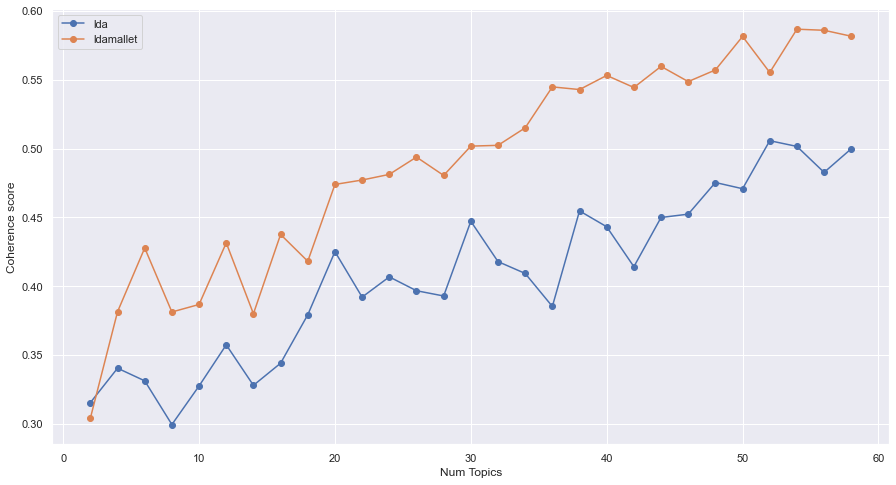

In [28]:
# Show graph
limit=60; start=2; step=2;
x = range(start, limit, step)
plt.figure(figsize=(15, 8))
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.plot(x, coherence_values_lda, marker='o', label='lda')
plt.plot(x, coherence_values_ldamallet, marker='o', label='ldamallet')
plt.legend()
plt.show()

## 6. Evaluate best model coherence measure 

In [29]:
def compare_coherence_measures(dictionary, texts, model_list):
    coherence_measures = ['u_mass', 'c_v', 'c_uci', 'c_npmi']
    coherence_values_hash = {'u_mass': [], 'c_v': [], 'c_uci': [], 'c_npmi': []}
    
    for model in model_list:
        for measure in coherence_measures:
            coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence=measure)
            coherence_values_hash[measure].append(coherencemodel.get_coherence())

    return coherence_values_hash

In [30]:
coherence_hash = compare_coherence_measures(dictionary=dic, texts=corpus, model_list = model_list_ldamallet)

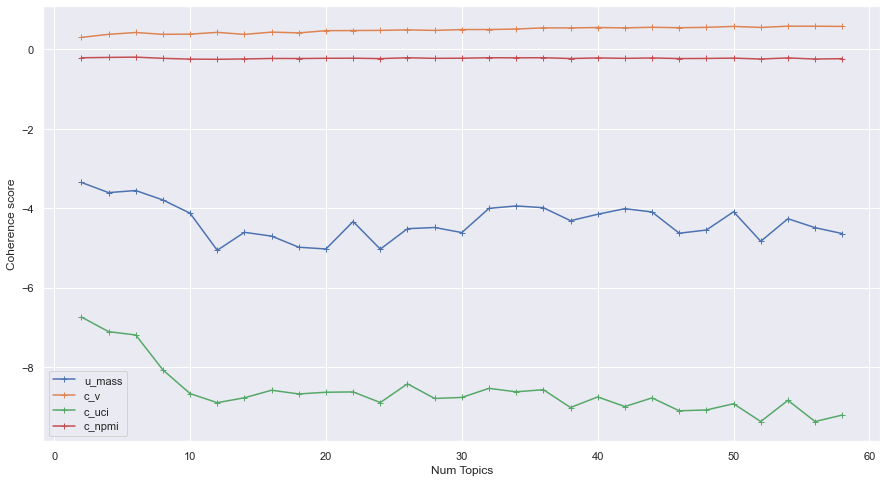

In [31]:
import matplotlib.pyplot as plt

limit=60; start=2; step=2;
x = range(start, limit, step)
plt.figure(figsize=(15, 8))
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.plot(x, coherence_hash['u_mass'], marker='+', label='u_mass')
plt.plot(x, coherence_hash['c_v'], marker='+', label='c_v')
plt.plot(x, coherence_hash['c_uci'], marker='+', label='c_uci')
plt.plot(x, coherence_hash['c_npmi'], marker='+', label='c_npmi')
plt.legend()
plt.show()

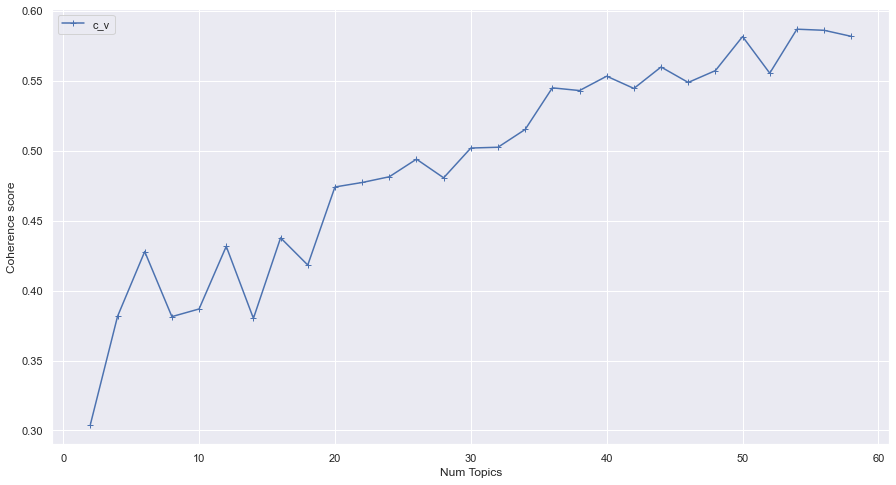

In [102]:
limit=60; start=2; step=2;
x = range(start, limit, step)
plt.figure(figsize=(15, 8))
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.plot(x, coherence_hash['c_v'], marker='+', label='c_v')
plt.legend()
plt.show()

## 7. Analyse optimal number of topics

In [33]:
best_result_index = coherence_hash['c_v'].index(max(coherence_hash['c_v']))
optimal_model_highest = model_list_ldamallet[best_result_index]

# Select the model and print the topics
# model_topics = optimal_model.show_topics(formatted=False)
print(f'''The {x[best_result_index]} topics gives the highest coherence score of {coherence_hash['c_v'][best_result_index]}''')

The 54 topics gives the highest coherence score of 0.5867063198582754


In [34]:
def convertldaGenToldaMallet(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha, eta=0)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [36]:
from gensim.models.ldamodel import LdaModel
optimal_model_highest = convertldaGenToldaMallet(optimal_model_highest)

In [37]:
plot_lda_vis(optimal_model_highest, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp impo

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.007898 -0.037151       1        1  1.596246
1     -0.029596  0.008023       2        1  1.709582
2     -0.120897  0.212447       3        1  2.146616
3     -0.024078 -0.081112       4        1  2.040471
4     -0.003512 -0.070947       5        1  1.688102
5      0.055022  0.050036       6        1  1.749877
6      0.021830  0.040871       7        1  1.372636
7      0.205758  0.011405       8        1  2.002782
8      0.148877 -0.085712       9        1  2.516096
9     -0.038932 -0.036671      10        1  1.621255
10     0.012819 -0.006657      11        1  1.574186
11    -0.007996 -0.007244      12        1  1.262799
12    -0.081641 -0.047301      13        1  2.521732
13    -0.037516 -0.002663      14        1  2.929711
14    -0.018952 -0.078506      15        1  2.030027
15     0.019683  0.124557      16        1  1.778479
16    -0.010004 -0.042134      17        1  1.958984
17     0.303603  0.107442      18        1  1.551981
18     0.101750 -0.031661      19        1  1.948269
19    -0.020544  0.023652      20        1  1.730332
20    -0.147934  0.171068      21        1  1.707175
21    -0.029648 -0.064837      22        1  1.519258
22    -0.041034 -0.170452      23        1  2.452599
23     0.019382  0.011659      24        1  1.666237
24    -0.001830  0.020182      25        1  1.991394
25    -0.038017  0.003923      26        1  1.208404
26    -0.042010  0.038908      27        1  1.570875
27    -0.026492 -0.035375      28        1  1.823500
28    -0.107543  0.107207      29        1  1.566717
29    -0.038165  0.060407      30        1  1.300860
30    -0.150516  0.126415      31        1  2.387885
31    -0.011771 -0.056564      32        1  1.690109
32     0.212292  0.108973      33        1  1.798552
33    -0.032059 -0.008532      34        1  1.957523
34    -0.028938  0.035337      35        1  1.754076
35    -0.088148  0.034797      36        1  2.239534
36    -0.040021 -0.017025      37        1  1.806141
37    -0.030622 -0.073193      38        1  2.138183
38     0.174683  0.049590      39        1  1.355973
39    -0.038559 -0.197008      40        1  1.762202
40     0.023732  0.086561      41        1  1.675479
41    -0.106552  0.084481      42        1  2.278063
42    -0.000873 -0.147643      43        1  1.727700
43    -0.003943 -0.019448      44        1  1.312722
44     0.007406  0.004918      45        1  1.313080
45     0.003046  0.000592      46        1  2.067879
46    -0.010538 -0.034002      47        1  2.366590
47     0.077368  0.085047      48        1  1.773379
48    -0.000850 -0.005847      49        1  1.550487
49    -0.012416 -0.016155      50        1  2.248657
50     0.114189 -0.002957      51        1  1.590267
51    -0.028279 -0.008388      52        1  1.936367
52     0.001250 -0.177229      53        1  1.732029
53    -0.060164 -0.046086      54        1  2.999940, topic_info=          Term        Freq       Total Category  logprob  loglift
64      people   87.000000   87.000000  Default  30.0000  30.0000
299       year  100.000000  100.000000  Default  29.0000  29.0000
39        game   45.000000   45.000000  Default  28.0000  28.0000
2397     blair   45.000000   45.000000  Default  27.0000  27.0000
861       told   36.000000   36.000000  Default  26.0000  26.0000
...        ...         ...         ...      ...      ...      ...
2581     crime    3.606397    7.062438  Topic54  -4.6697   2.8345
2807    expert    3.606397    7.094533  Topic54  -4.6697   2.8300
942       king    3.606397    7.320926  Topic54  -4.6697   2.7986
405       show    4.808529   37.237360  Topic54  -4.3820   1.4597
397   research    3.606397   17.541655  Topic54  -4.6697   1.9247

[2804 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
3450     50  0.821931     aara
429      45  0.783958    abbey
1861     41  0.930897  abbotts
701 

In [38]:
# no. of topics is 36
optimal_model_36 = model_list_ldamallet[17]
coherence_hash['c_v'][17]

optimal_model_36 = convertldaGenToldaMallet(optimal_model_36)
plot_lda_vis(optimal_model_36, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/usr/local/lib/pytho

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.003337  0.019993       1        1  2.983484
1      0.244633 -0.144751       2        1  3.108601
2     -0.013885  0.105920       3        1  2.574561
3      0.115208 -0.056042       4        1  2.537841
4      0.162429 -0.041891       5        1  2.560300
5     -0.059451  0.094134       6        1  4.103293
6     -0.024143  0.107346       7        1  3.239587
7      0.047234 -0.047218       8        1  3.260385
8     -0.100318  0.009705       9        1  2.515173
9     -0.117031 -0.130339      10        1  2.307391
10    -0.060653 -0.209541      11        1  2.681857
11    -0.009067  0.096199      12        1  2.883479
12    -0.014730  0.061470      13        1  2.279606
13    -0.034156  0.061484      14        1  2.892618
14    -0.003886  0.008071      15        1  2.687065
15     0.087133  0.014461      16        1  3.029889
16    -0.137634 -0.192128      17        1  3.064135
17     0.023622  0.058304      18        1  1.974520
18     0.036348  0.030932      19        1  2.672648
19    -0.014574  0.085532      20        1  2.458752
20    -0.080553  0.000716      21        1  2.667226
21    -0.046321  0.057842      22        1  2.783995
22     0.011834 -0.086319      23        1  2.683972
23    -0.031831  0.070886      24        1  2.433313
24     0.035578  0.116091      25        1  2.473075
25     0.012628  0.059648      26        1  3.123992
26    -0.004962  0.139371      27        1  3.003624
27    -0.014738  0.097977      28        1  2.561834
28    -0.199224 -0.148820      29        1  2.437848
29    -0.095691 -0.060114      30        1  3.883974
30     0.146990 -0.030450      31        1  2.572048
31    -0.151112 -0.124592      32        1  3.025339
32     0.208736 -0.094023      33        1  3.062435
33     0.019699  0.100672      34        1  2.154074
34    -0.082522  0.068371      35        1  3.036540
35     0.147745 -0.098901      36        1  2.281527, topic_info=          Term        Freq       Total Category  logprob  loglift
299       year  100.000000  100.000000  Default  30.0000  30.0000
64      people   87.000000   87.000000  Default  29.0000  29.0000
98       world   60.000000   60.000000  Default  28.0000  28.0000
2397     blair   45.000000   45.000000  Default  27.0000  27.0000
69       radio   40.000000   40.000000  Default  26.0000  26.0000
...        ...         ...         ...      ...      ...      ...
347      group    6.198310   15.301459  Topic36  -3.8544   2.8767
2950     small    2.479324    3.661416  Topic36  -4.7707   3.3905
173   increase    2.479324    9.869556  Topic36  -4.7707   2.3989
941       kind    2.479324    7.155775  Topic36  -4.7707   2.7204
1992      talk    2.479324    6.191423  Topic36  -4.7707   2.8651

[2125 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
429      30  0.855349    abbey
1861     13  0.868929  abbotts
701      34  1.054425  ability
870       5  0.207474   abroad
870      32  0.829898   abroad
...     ...       ...      ...
1368      1  1.016148    young
869      11  0.878176    youth
3392     32  1.047200     yuan
3794     16  1.111904      zen
300       5  0.807171     zoom

[2461 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36])

In [39]:
optimal_model_36 = model_list_ldamallet[17]
optimal_model = optimal_model_36

## 8. Find the most dominant topic in each news article

In [40]:
# Find dominant topic in each news article

def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for _, (topic_num, prop_topic) in enumerate(row):
            wp = ldamodel.show_topic(topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)
            break
    
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [41]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=bow_corpus, texts=news_data['content'])

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'News Article']

# Show
df_dominant_topic.head(10)

/var/folders/qd/3_f8j7jn0sd60czml9wnjgww0000gp/T/ipykernel_54663/1470428163.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)
/var/folders/qd/3_f8j7jn0sd60czml9wnjgww0000gp/T/ipykernel_54663/1470428163.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,News Article
0,0,25,0.4049,"men, woman, serena, win, money, added, prize, ...",world number one lindsay davenport criticised ...
1,1,17,0.5571,"phone, camera, mobile, people, month, image, r...",four times mobiles cameras sold europe end las...
2,2,19,0.3164,"number, top, national, time, announced, latest...",us pushed japan top supercomputing chart ibms ...
3,3,24,0.3239,"bank, private, sector, euniversity, disaster, ...",trial emilio botin chairman spains powerful ba...
4,4,18,0.4773,"january, biggest, model, car, recall, vehicle,...",worlds biggest carmaker general motors gm reca...
5,5,25,0.3664,"men, woman, serena, win, money, added, prize, ...",serena williams angrily rejected claims sister...
6,6,24,0.2699,"bank, private, sector, euniversity, disaster, ...",failed government scheme offer uk university c...
7,7,11,0.2577,"people, watch, work, make, project, programme,...",india ordered deportation iranianborn model ac...
8,8,21,0.5089,"hiphop, world, millan, rap, fan, group, spanis...",spin radio dial us likely find plenty spanishl...
9,9,33,0.1162,"year, cut, market, life, rate, interest, bonus...",eurodisney european home mickey mouse friends ...


## 9. Find the most dominant news article for each topic

In [43]:
sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "News Article"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,News Article
0,1,0.5427,"film, nair, india, young, actor, sharp, fair, ...",indian film director mira nair said thrilled g...
1,2,0.4315,"year, broadband, home, news, local, connection...",broadband jumbo jet would seen taxiing runway ...
2,3,0.5623,"profit, euro, europe, growth, net, sale, warne...",heineken carlsberg two worlds largest brewers ...
3,4,0.4488,"offer, service, telewest, offering, huge, cabl...",cable firms ntl telewest launched videoondeman...
4,5,0.4897,"end, race, part, lot, make, future, year, run,...",wont go one greatest marathons paulas career t...
5,6,0.4461,"blair, minister, labour, brown, election, prim...",tony blair faces first prime ministers questio...
6,7,0.3586,"tax, government, money, economic, budget, put,...",public trust handling economy restored gordon ...
7,8,0.4476,"radio, station, visual, service, chance, simil...",growth mobile phone market past decade nothing...
8,9,0.6454,"world, record, speed, lift, pressure, top, min...",two highspeed lifts worlds tallest building of...
9,10,0.5277,"country, technology, report, world, fund, acce...",digital divide rich poor nations narrowing fas...


## 10. Find the number of news articles belonging to each topic

In [101]:
# Number of Documents for Each Topic
topic_counts = df_dominant_topic['Dominant_Topic'].value_counts()

df = pd.DataFrame(topic_counts)
df.columns = ['No. of articles']
df.sort_index()

,No. of articles
1,2
2,1
3,1
4,2
5,1
6,3
7,3
8,1
9,1
10,1


In [47]:
import pickle

pickle.dump(optimal_model_36, open('optimal_model_36.pkl', 'wb'))
pickle.dump(optimal_model_highest, open('optimal_model_highest.pkl', 'wb'))